# MÉTODO DE ENTRADA DE VENTANA SÓLO VALOR 12 - 4

In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '1'

In [2]:
import tensorflow as tf
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt
from array import *
from pickle import dump
import math

import numpy as np
import pandas as pd
import seaborn as sns

np.random.seed(123)

from sklearn.preprocessing import StandardScaler, MinMaxScaler, MaxAbsScaler
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

In [3]:
FILEPATH = "../../datasources/THC-id-17.csv"
df_original = pd.read_csv(FILEPATH, parse_dates=True)

FILEPATH = "../../datasources/THC-id-17-preprocessed.csv"
df = pd.read_csv(FILEPATH, parse_dates=True)

In [4]:
df_original

,datetime,id,value
0,2019-01-01 03:00:00,17.0,0.087
1,2019-01-01 03:15:00,17.0,0.100
2,2019-01-01 03:30:00,17.0,0.084
3,2019-01-01 03:45:00,17.0,0.057
4,2019-01-01 04:00:00,17.0,0.167
...,...,...,...
64588,2020-11-03 22:00:00,17.0,0.031
64589,2020-11-03 22:15:00,17.0,0.055
64590,2020-11-03 22:30:00,17.0,0.019
64591,2020-11-03 22:45:00,17.0,0.021


In [5]:
df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
0,0.707107,0.707107,-0.993712,-0.111964,0.004172,0.999991,0.087
1,0.751840,0.659346,-0.994716,-0.102669,0.004351,0.999991,0.100
2,0.793353,0.608761,-0.995632,-0.093364,0.004530,0.999990,0.084
3,0.831470,0.555570,-0.996461,-0.084051,0.004709,0.999989,0.057
4,0.866025,0.500000,-0.997204,-0.074730,0.004888,0.999988,0.167
...,...,...,...,...,...,...,...
64588,-0.500000,0.866025,-0.826239,0.563320,-0.835100,0.550099,0.031
64589,-0.442289,0.896873,-0.820936,0.571021,-0.835001,0.550248,0.055
64590,-0.382683,0.923880,-0.815561,0.578671,-0.834902,0.550398,0.019
64591,-0.321439,0.946930,-0.810115,0.586271,-0.834804,0.550548,0.021


In [6]:
df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
0,0.707107,0.707107,-0.993712,-0.111964,0.004172,0.999991,0.087
1,0.751840,0.659346,-0.994716,-0.102669,0.004351,0.999991,0.100
2,0.793353,0.608761,-0.995632,-0.093364,0.004530,0.999990,0.084
3,0.831470,0.555570,-0.996461,-0.084051,0.004709,0.999989,0.057
4,0.866025,0.500000,-0.997204,-0.074730,0.004888,0.999988,0.167
...,...,...,...,...,...,...,...
64588,-0.500000,0.866025,-0.826239,0.563320,-0.835100,0.550099,0.031
64589,-0.442289,0.896873,-0.820936,0.571021,-0.835001,0.550248,0.055
64590,-0.382683,0.923880,-0.815561,0.578671,-0.834902,0.550398,0.019
64591,-0.321439,0.946930,-0.810115,0.586271,-0.834804,0.550548,0.021


### División de los datos

In [7]:
train_df, aux = train_test_split(df, test_size=0.3, shuffle=False)
test_df, val_df = train_test_split(aux, test_size=0.5, shuffle=False)

In [8]:
train_df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
0,0.707107,0.707107,-0.993712,-0.111964,0.004172,0.999991,0.087
1,0.751840,0.659346,-0.994716,-0.102669,0.004351,0.999991,0.100
2,0.793353,0.608761,-0.995632,-0.093364,0.004530,0.999990,0.084
3,0.831470,0.555570,-0.996461,-0.084051,0.004709,0.999989,0.057
4,0.866025,0.500000,-0.997204,-0.074730,0.004888,0.999988,0.167
...,...,...,...,...,...,...,...
45210,0.382683,0.923880,0.056070,0.998427,0.968510,-0.248976,0.041
45211,0.442289,0.896873,0.065403,0.997859,0.968465,-0.249150,0.024
45212,0.500000,0.866025,0.074730,0.997204,0.968420,-0.249323,0.017
45213,0.555570,0.831470,0.084051,0.996461,0.968376,-0.249497,0.046


In [9]:
test_df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
45215,6.593458e-01,0.751840,0.102669,0.994716,0.968286,-0.249844,0.016
45216,7.071068e-01,0.707107,0.111964,0.993712,0.968241,-0.250017,0.046
45217,7.518398e-01,0.659346,0.121251,0.992622,0.968197,-0.250191,0.009
45218,7.933533e-01,0.608761,0.130526,0.991445,0.968152,-0.250364,0.003
45219,8.314696e-01,0.555570,0.139790,0.990181,0.968107,-0.250538,0.034
...,...,...,...,...,...,...,...
54899,-6.540313e-02,0.997859,0.442289,-0.896873,-0.405068,-0.914287,0.018
54900,-5.539676e-12,1.000000,0.433884,-0.900969,-0.405231,-0.914214,0.018
54901,6.540313e-02,0.997859,0.425441,-0.904986,-0.405395,-0.914142,0.038
54902,1.305262e-01,0.991445,0.416961,-0.908924,-0.405559,-0.914069,0.039


In [10]:
val_df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
54904,0.258819,0.965926,0.399892,-0.916562,-0.405887,-0.913923,0.018
54905,0.321439,0.946930,0.391305,-0.920261,-0.406050,-0.913851,0.017
54906,0.382683,0.923880,0.382683,-0.923880,-0.406214,-0.913778,0.018
54907,0.442289,0.896873,0.374029,-0.927417,-0.406378,-0.913705,0.048
54908,0.500000,0.866025,0.365341,-0.930874,-0.406541,-0.913632,0.024
...,...,...,...,...,...,...,...
64588,-0.500000,0.866025,-0.826239,0.563320,-0.835100,0.550099,0.031
64589,-0.442289,0.896873,-0.820936,0.571021,-0.835001,0.550248,0.055
64590,-0.382683,0.923880,-0.815561,0.578671,-0.834902,0.550398,0.019
64591,-0.321439,0.946930,-0.810115,0.586271,-0.834804,0.550548,0.021


## Funciones auxiliares

In [11]:
def split_data(data, n_input, n_out):
    X, y = list(), list()
    in_start = 0
    
    for _ in range(len(data)):
        in_end = in_start + n_input
        out_end = in_end + n_out
        if out_end <= len(data):
            X.append(np.array(data.iloc[in_start:in_end, -1]))
            y.append(np.array(data.iloc[in_end:out_end, -1]))
        in_start += 1
        
    return np.array(X).reshape(len(X), n_input, 1), np.array(y)

In [12]:
def plot_history(history):
    hist = pd.DataFrame(history.history)
    hist['epoch'] = history.epoch
    plt.figure()
    plt.xlabel('Epoch')
    plt.ylabel('Mean Abs Error [MPG]')
    plt.plot(hist['epoch'], hist['mae'], label='Train Error')
    plt.plot(hist['epoch'], hist['val_mae'], label = 'Val Error')
    plt.ylim(bottom=0)
    plt.legend()
    plt.figure()
    plt.xlabel('Epoch')
    plt.ylabel('Mean Square Error [$MPG^2$]')
    plt.plot(hist['epoch'], hist['mse'], label='Train Error')
    plt.plot(hist['epoch'], hist['val_mse'], label = 'Val Error')
    plt.ylim(bottom=0)
    plt.legend()
    plt.show()

In [13]:
def plot_window_predictions(index_min, index_max, real_outputs, pred_outputs, num_plots, start):
    for n in range(start, start + num_plots):
        limit = index_min + n + n_entrada
        input_indices = np.array(df_original['datetime'].iloc[index_min + n : limit])
        input_values = np.array(df_original['value'].iloc[index_min + n : limit])
        output_indices = np.array(df_original['datetime'].iloc[limit : limit + n_predicciones])
        real_values = real_outputs[n]
        pred_values = pred_outputs[n]
        
        plt.figure()
        plt.xlabel('Time')
        plt.ylabel(f'Valores de prediccion - Iteracion {n+1}')
        plt.scatter(input_indices, input_values, color='b',zorder=2)
        plt.plot(input_indices, input_values, label='Inputs', color='b', zorder=1)
        plt.scatter(output_indices, real_values, edgecolors='k', label='Real output', c='#2ca02c', s=64)
        plt.scatter(output_indices, pred_values, marker='X', edgecolors='k', label='Prediction output', c='#ff7f0e', s=64)
        plt.xticks(rotation = 90)
        plt.legend()

In [14]:
def plot_window_predictions_values(index_min, pred_outputs, max_plots):
    plt.figure()
    plt.xlabel('Time')
    plt.ylabel(f'Valores de prediccion')
    plt.plot(np.array(df_original['datetime'].iloc[index_min + n_entrada : index_min + n_entrada + max_plots + n_predicciones]), 
             np.array(df_original['value'].iloc[index_min + n_entrada : index_min + n_entrada + max_plots + n_predicciones]), 
             color='b', zorder=1)
    
    for n in range(max_plots):
        limit = index_min + n + n_entrada
        output_indices = np.array(df_original['datetime'].iloc[limit : limit + n_predicciones])
        pred_values = pred_outputs[n]
        
        plt.scatter(output_indices, pred_values, marker='X', edgecolors='k', label='Prediction output', c='#ff7f0e', s=64)
        plt.xticks(rotation = 90)

In [15]:
import tensorflow.keras.backend as K

def smape(y_true, y_pred):
    return K.mean(2*K.abs(y_pred-y_true)/(K.abs(y_true)+K.abs(y_pred)))

## Parámetros
####  En este caso vamos a generar una ventana de 12 valores de entrada que corresponde a las 3 horas anteriores y una salida de 4 valores que corresponden al consumo de la siguiente hora

In [16]:
###### PARAMETERS ######
n_epochs = 200
batch_size = 128
n_entrada = 12           # Número de mediciones en las 3 horas anteriores
n_predicciones = 4       # Mediciones en una hora
n_features = 1 
########################

## Extraer datos de entrada y salida

In [17]:
data_trainX, data_trainY = split_data(train_df, n_entrada, n_predicciones)
data_valX, data_valY = split_data(val_df, n_entrada, n_predicciones)
data_testX, data_testY = split_data(test_df, n_entrada, n_predicciones)

In [18]:
data_trainX.shape

(45200, 12, 1)

In [19]:
data_trainY.shape

(45200, 4)

In [20]:
data_valX.shape

(9674, 12, 1)

In [21]:
data_valY.shape

(9674, 4)

In [22]:
data_testX.shape

(9674, 12, 1)

In [23]:
data_testY.shape

(9674, 4)

In [24]:
data_trainX[0]

array([[0.087],
       [0.1  ],
       [0.084],
       [0.057],
       [0.167],
       [0.053],
       [0.057],
       [0.058],
       [0.038],
       [0.018],
       [0.06 ],
       [0.053]])

In [25]:
data_trainY[0]

array([0.055, 0.055, 0.05 , 0.05 ])

## Estandarización y normalización de los datos

In [26]:
# Normalizado
maxabs_scaler = MaxAbsScaler()
    
maxabs_scaler.fit(data_trainX.reshape(-1, data_trainX.shape[-1]))
    
scaled_trainX = maxabs_scaler.transform(data_trainX.reshape(-1, data_trainX.shape[-1])).reshape(data_trainX.shape)
scaled_valX = maxabs_scaler.transform(data_valX.reshape(-1, data_valX.shape[-1])).reshape(data_valX.shape)
scaled_testX = maxabs_scaler.transform(data_testX.reshape(-1, data_testX.shape[-1])).reshape(data_testX.shape)

In [27]:
scaled_trainX.shape

(45200, 12, 1)

In [28]:
scaled_valX.shape

(9674, 12, 1)

In [29]:
scaled_testX.shape

(9674, 12, 1)

In [30]:
scaled_trainX[0]

array([[0.12869822],
       [0.14792899],
       [0.12426036],
       [0.08431953],
       [0.24704142],
       [0.07840237],
       [0.08431953],
       [0.08579882],
       [0.05621302],
       [0.02662722],
       [0.0887574 ],
       [0.07840237]])

### Algunos modelos necesitan otros tipos de entrada

In [31]:
scaled_trainX_4D = scaled_trainX.reshape(scaled_trainX.shape[0], 1, n_entrada, n_features)
scaled_valX_4D = scaled_valX.reshape(scaled_valX.shape[0], 1, n_entrada, n_features)
scaled_testX_4D = scaled_testX.reshape(scaled_testX.shape[0], 1, n_entrada, n_features)

scaled_trainX_5D = scaled_trainX.reshape(scaled_trainX.shape[0], 1, 1, n_entrada, n_features)
scaled_valX_5D = scaled_valX.reshape(scaled_valX.shape[0], 1, 1, n_entrada, n_features)
scaled_testX_5D = scaled_testX.reshape(scaled_testX.shape[0], 1, 1, n_entrada, n_features)

data_trainY_3D = data_trainY.reshape(data_trainY.shape[0], 1, n_predicciones)
data_valY_3D = data_valY.reshape(data_valY.shape[0], 1, n_predicciones)
data_testY_3D = data_testY.reshape(data_testY.shape[0], 1, n_predicciones)

data_trainY_3D_2 = data_trainY.reshape(data_trainY.shape[0], n_predicciones, 1)
data_valY_3D_2 = data_valY.reshape(data_valY.shape[0], n_predicciones, 1)
data_testY_3D_2 = data_testY.reshape(data_testY.shape[0], n_predicciones, 1)

### Early stopping

In [32]:
early_stop = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=100)

# MODELO 1: LSTM DE UNA CAPA

### Construimos el modelo

In [33]:
def build_model1():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [34]:
model1 = build_model1()
model1.summary()

2022-06-24 02:37:31.168109: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-06-24 02:37:31.716409: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 30514 MB memory:  -> device: 0, name: Tesla V100-PCIE-32GB, pci bus id: 0000:d7:00.0, compute capability: 7.0


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 128)               66560     
                                                                 
 dense (Dense)               (None, 4)                 516       
                                                                 
Total params: 67,076
Trainable params: 67,076
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [35]:
history1 = model1.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200


2022-06-24 02:37:33.429150: I tensorflow/stream_executor/cuda/cuda_dnn.cc:366] Loaded cuDNN version 8100


354/354 [==============================] - 5s 10ms/step - loss: 0.0061 - mae: 0.0457 - mse: 0.0061 - smape: 0.8119 - val_loss: 0.0059 - val_mae: 0.0400 - val_mse: 0.0059 - val_smape: 0.7425
Epoch 2/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0060 - mae: 0.0450 - mse: 0.0060 - smape: 0.8002 - val_loss: 0.0059 - val_mae: 0.0453 - val_mse: 0.0059 - val_smape: 0.8259
Epoch 3/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0060 - mae: 0.0448 - mse: 0.0060 - smape: 0.7981 - val_loss: 0.0058 - val_mae: 0.0388 - val_mse: 0.0058 - val_smape: 0.7188
Epoch 4/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0059 - mae: 0.0445 - mse: 0.0059 - smape: 0.7954 - val_loss: 0.0058 - val_mae: 0.0421 - val_mse: 0.0058 - val_smape: 0.7844
Epoch 5/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0059 - mae: 0.0444 - mse: 0.0059 - smape: 0.7935 - val_loss: 0.0057 - val_mae: 0.0388 - val_mse: 0.0057 - val_smape: 0.7264
Epoch 

Epoch 42/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0057 - mae: 0.0436 - mse: 0.0057 - smape: 0.7791 - val_loss: 0.0062 - val_mae: 0.0441 - val_mse: 0.0062 - val_smape: 0.7572
Epoch 43/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0057 - mae: 0.0436 - mse: 0.0057 - smape: 0.7781 - val_loss: 0.0057 - val_mae: 0.0417 - val_mse: 0.0057 - val_smape: 0.7804
Epoch 44/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0057 - mae: 0.0436 - mse: 0.0057 - smape: 0.7784 - val_loss: 0.0057 - val_mae: 0.0407 - val_mse: 0.0057 - val_smape: 0.7611
Epoch 45/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0057 - mae: 0.0436 - mse: 0.0057 - smape: 0.7786 - val_loss: 0.0057 - val_mae: 0.0406 - val_mse: 0.0057 - val_smape: 0.7625
Epoch 46/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0057 - mae: 0.0435 - mse: 0.0057 - smape: 0.7766 - val_loss: 0.0057 - val_mae: 0.0415 - val_mse: 0.0057 - val_smap

354/354 [==============================] - 3s 8ms/step - loss: 0.0052 - mae: 0.0417 - mse: 0.0052 - smape: 0.7623 - val_loss: 0.0061 - val_mae: 0.0422 - val_mse: 0.0061 - val_smape: 0.7634
Epoch 123/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0052 - mae: 0.0417 - mse: 0.0052 - smape: 0.7630 - val_loss: 0.0059 - val_mae: 0.0388 - val_mse: 0.0059 - val_smape: 0.7257
Epoch 124/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0052 - mae: 0.0415 - mse: 0.0052 - smape: 0.7618 - val_loss: 0.0061 - val_mae: 0.0406 - val_mse: 0.0061 - val_smape: 0.7549
Epoch 125/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0051 - mae: 0.0416 - mse: 0.0051 - smape: 0.7624 - val_loss: 0.0061 - val_mae: 0.0413 - val_mse: 0.0061 - val_smape: 0.7474
Epoch 126/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0051 - mae: 0.0415 - mse: 0.0051 - smape: 0.7635 - val_loss: 0.0062 - val_mae: 0.0445 - val_mse: 0.0062 - val_smape: 0.7992

In [36]:
hist1 = pd.DataFrame(history1.history)
hist1['epoch'] = history1.epoch
hist1

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006149,0.045668,0.006149,0.811895,0.005885,0.040025,0.005885,0.742472,0
1,0.005998,0.044964,0.005998,0.800196,0.005927,0.045341,0.005927,0.825850,1
2,0.005970,0.044806,0.005970,0.798108,0.005837,0.038833,0.005837,0.718769,2
3,0.005912,0.044538,0.005912,0.795358,0.005810,0.042071,0.005810,0.784384,3
4,0.005886,0.044435,0.005886,0.793544,0.005730,0.038824,0.005730,0.726430,4
...,...,...,...,...,...,...,...,...,...
125,0.005138,0.041514,0.005138,0.763531,0.006160,0.044537,0.006160,0.799241,125
126,0.005112,0.041411,0.005112,0.761359,0.006024,0.042729,0.006024,0.779924,126
127,0.005096,0.041343,0.005096,0.761506,0.006074,0.043194,0.006074,0.786428,127
128,0.005069,0.041204,0.005069,0.760187,0.006201,0.043401,0.006201,0.772371,128


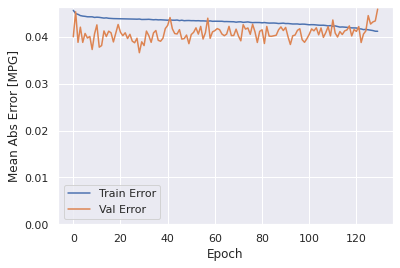

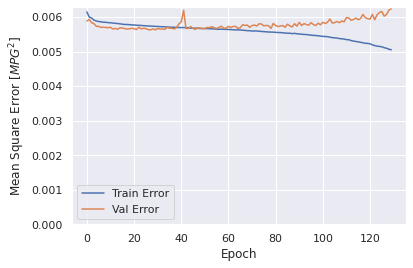

In [37]:
sns.set(rc = {'figure.figsize':(15,5), 'figure.dpi':80})
plot_history(history1)

### Evaluar predicciones

In [38]:
score_train1 = model1.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train1[0]}')
print(f'MAE:{score_train1[1]}')
print(f'MSE:{score_train1[2]}')
print(f'SMAPE:{score_train1[3]}')

1413/1413 [==============================] - 7s 5ms/step - loss: 0.0050 - mae: 0.0427 - mse: 0.0050 - smape: 0.7773
Loss:0.004984074272215366
MAE:0.042712464928627014
MSE:0.004984074272215366
SMAPE:0.777288556098938


In [39]:
score_val1 = model1.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val1[0]}')
print(f'MAE:{score_val1[1]}')
print(f'MSE:{score_val1[2]}')
print(f'SMAPE:{score_val1[3]}')

303/303 [==============================] - 2s 5ms/step - loss: 0.0062 - mae: 0.0459 - mse: 0.0062 - smape: 0.8135
Loss:0.006235226988792419
MAE:0.04593679681420326
MSE:0.006235226988792419
SMAPE:0.813459038734436


In [40]:
score_test1 = model1.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test1[0]}') 
print(f'MAE:{score_test1[1]}')
print(f'MSE:{score_test1[2]}')
print(f'SMAPE:{score_test1[3]}')

303/303 [==============================] - 2s 5ms/step - loss: 0.0066 - mae: 0.0501 - mse: 0.0066 - smape: 0.8328
Loss:0.006604182533919811
MAE:0.05005190148949623
MSE:0.006604182533919811
SMAPE:0.8327583074569702


### Comparativa de resultados

In [41]:
result = hist1.iloc[-1]
comparativa1 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test1[1], score_test1[2], score_test1[3], math.sqrt(score_test1[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa1.style.set_caption("Método de ventana de varios pasos - LSTM de una capa")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.041196,0.005052,0.761339,0.071078
VALIDACION,0.045937,0.006235,0.814172,0.078963
TEST,0.050052,0.006604,0.832758,0.081266


### Obtener predicciones

In [42]:
trainPredict1 = model1.predict(scaled_trainX)
testPredict1 = model1.predict(scaled_testX)

### Visualización de las predicciones

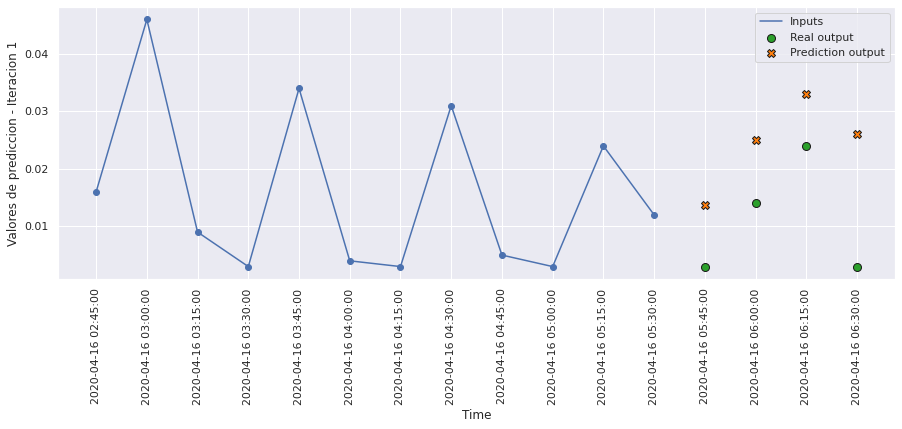

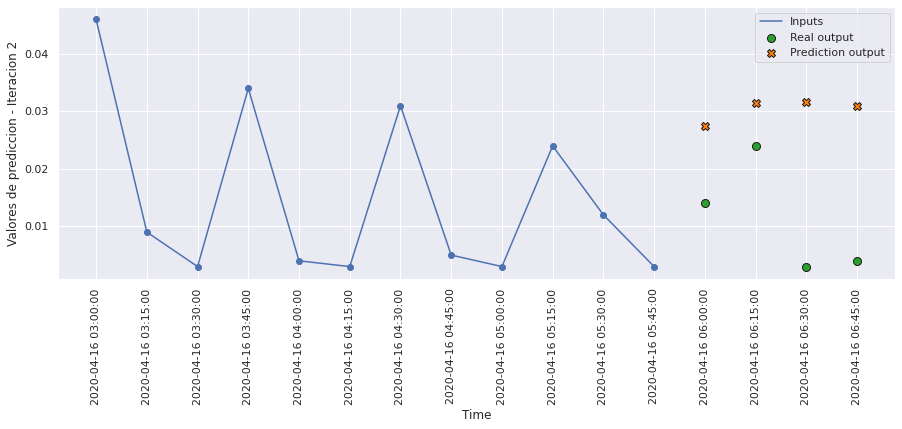

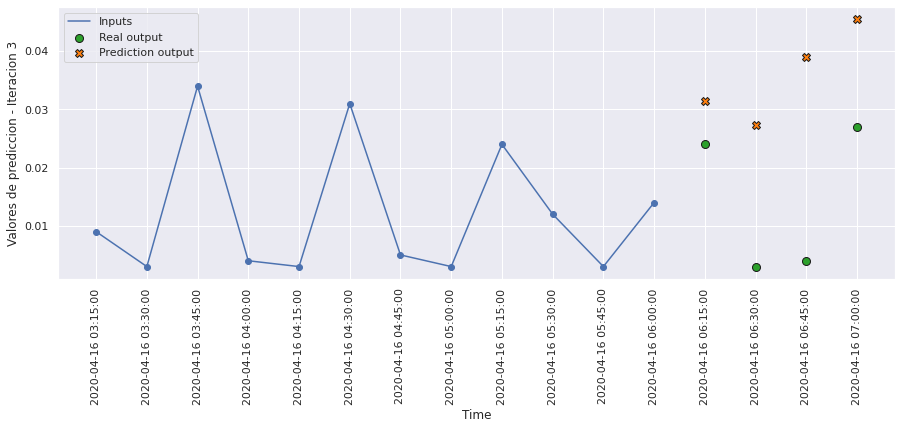

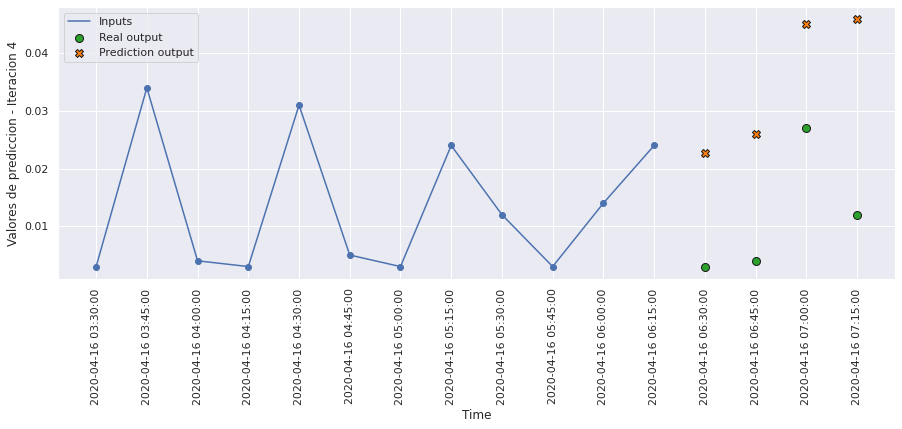

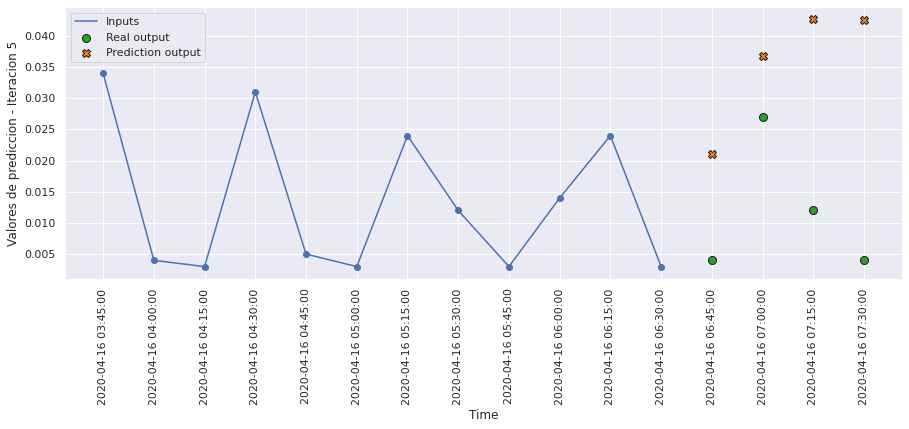

...

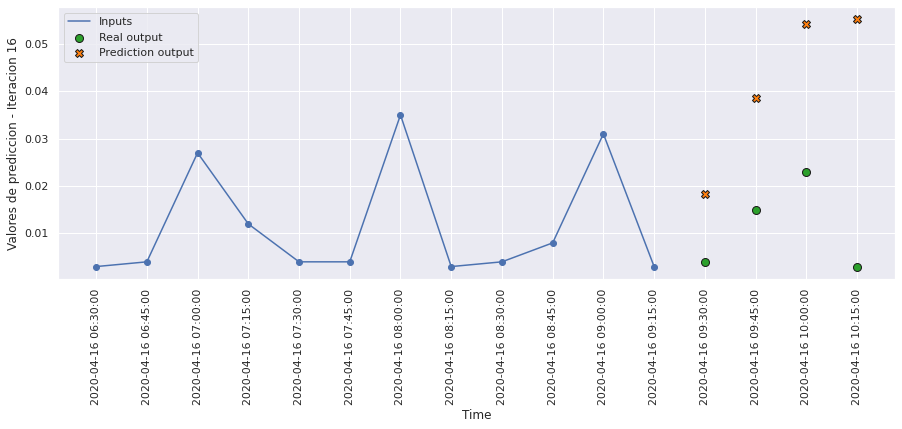

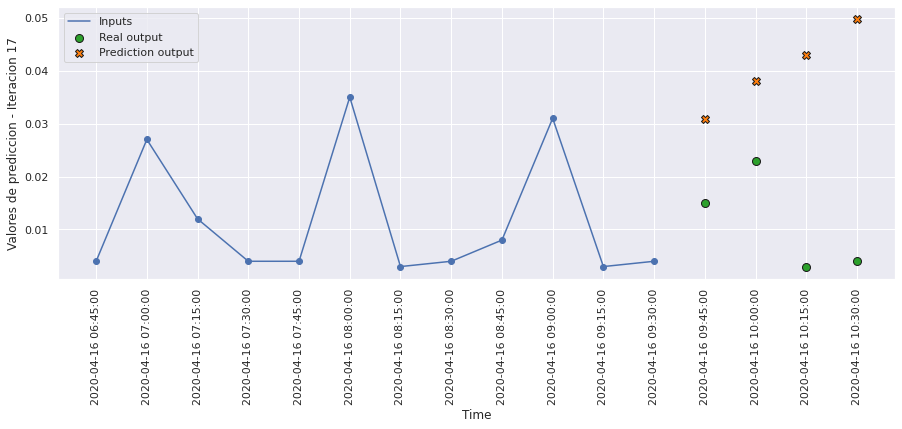

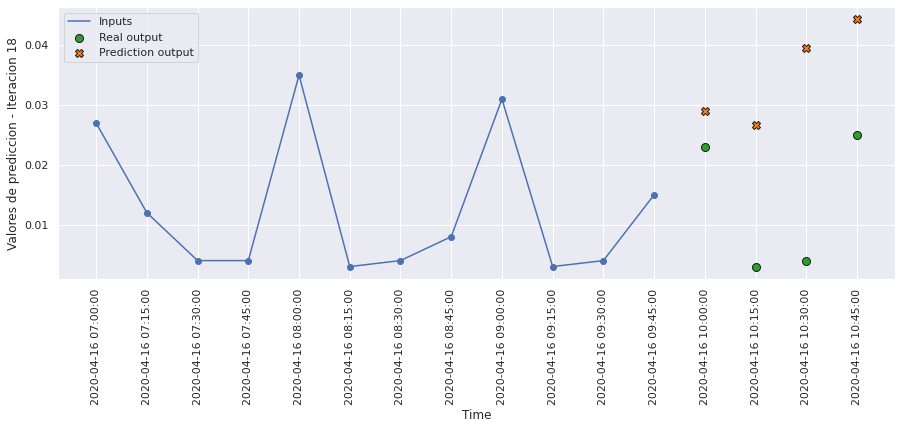

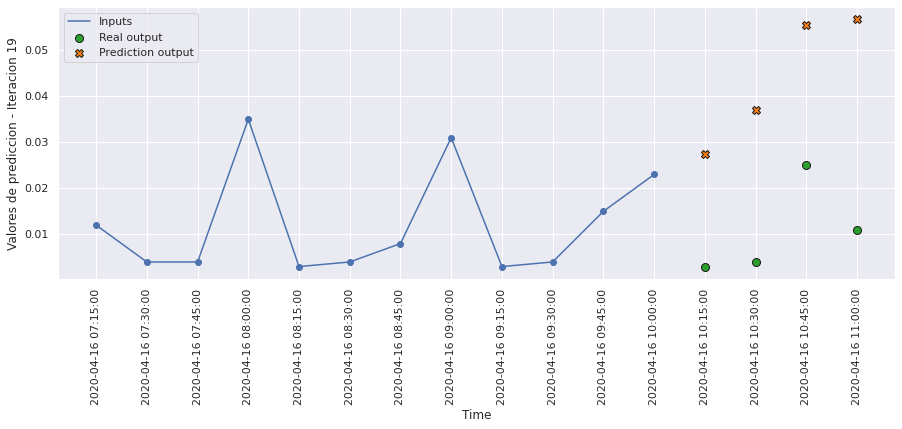

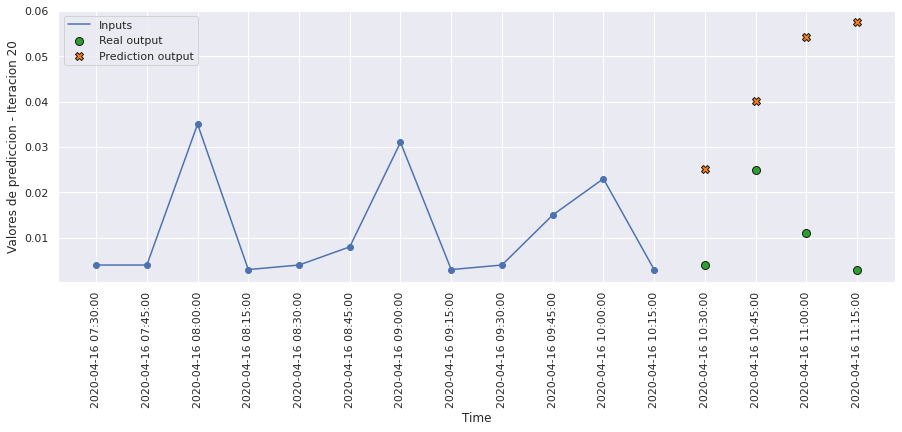

In [43]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict1, 20, 0)

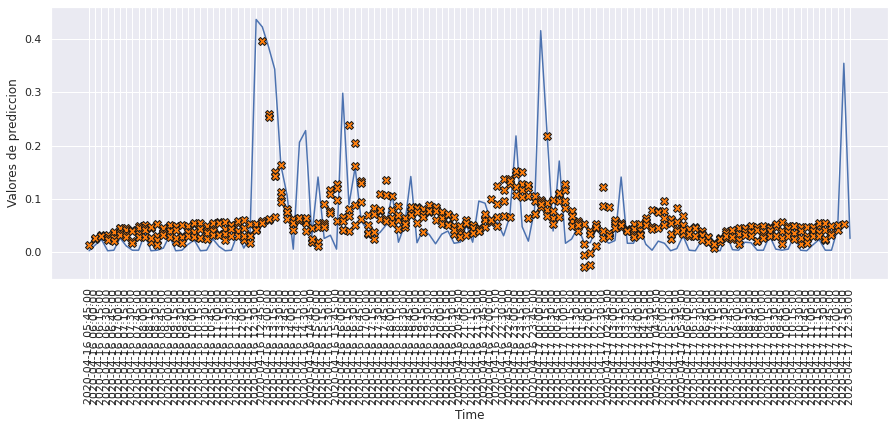

In [44]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict1, 120)

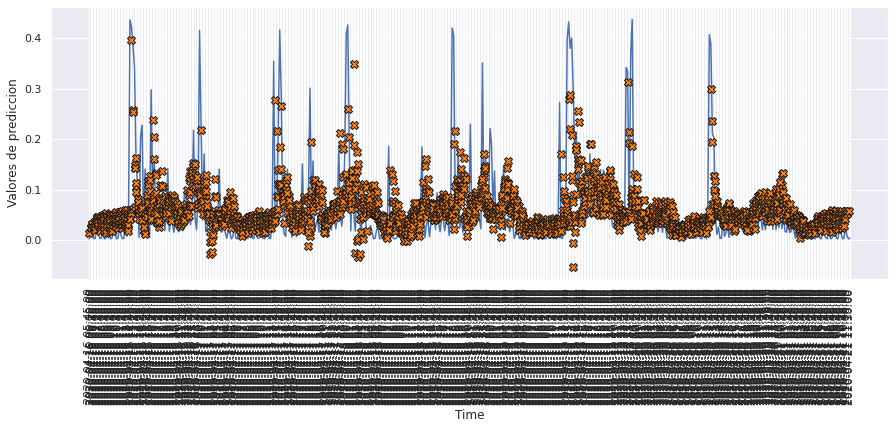

In [45]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict1, 500)

# MODELO 2: LSTM DE DOS CAPAS

### Construimos el modelo

In [46]:
def build_model2():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences = True),
        tf.keras.layers.LSTM(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [47]:
model2 = build_model2()
model2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1 (LSTM)               (None, 12, 128)           66560     
                                                                 
 lstm_2 (LSTM)               (None, 128)               131584    
                                                                 
 dense_1 (Dense)             (None, 4)                 516       
                                                                 
Total params: 198,660
Trainable params: 198,660
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [48]:
history2 = model2.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 7s 15ms/step - loss: 0.0062 - mae: 0.0460 - mse: 0.0062 - smape: 0.8166 - val_loss: 0.0059 - val_mae: 0.0391 - val_mse: 0.0059 - val_smape: 0.7253
Epoch 2/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0060 - mae: 0.0450 - mse: 0.0060 - smape: 0.8001 - val_loss: 0.0059 - val_mae: 0.0437 - val_mse: 0.0059 - val_smape: 0.7931
Epoch 3/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0060 - mae: 0.0448 - mse: 0.0060 - smape: 0.7983 - val_loss: 0.0058 - val_mae: 0.0408 - val_mse: 0.0058 - val_smape: 0.7611
Epoch 4/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0059 - mae: 0.0447 - mse: 0.0059 - smape: 0.7968 - val_loss: 0.0058 - val_mae: 0.0392 - val_mse: 0.0058 - val_smape: 0.7362
Epoch 5/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0059 - mae: 0.0444 - mse: 0.0059 - smape: 0.7935 - val_loss: 0.0058 - val_mae: 0.0436 - val_mse: 0.0058 - val_smap

354/354 [==============================] - 5s 14ms/step - loss: 0.0051 - mae: 0.0410 - mse: 0.0051 - smape: 0.7532 - val_loss: 0.0060 - val_mae: 0.0413 - val_mse: 0.0060 - val_smape: 0.7558
Epoch 82/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0050 - mae: 0.0408 - mse: 0.0050 - smape: 0.7511 - val_loss: 0.0061 - val_mae: 0.0411 - val_mse: 0.0061 - val_smape: 0.7432
Epoch 83/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0050 - mae: 0.0408 - mse: 0.0050 - smape: 0.7520 - val_loss: 0.0061 - val_mae: 0.0398 - val_mse: 0.0061 - val_smape: 0.7318
Epoch 84/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0050 - mae: 0.0405 - mse: 0.0050 - smape: 0.7504 - val_loss: 0.0061 - val_mae: 0.0407 - val_mse: 0.0061 - val_smape: 0.7432
Epoch 85/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0049 - mae: 0.0404 - mse: 0.0049 - smape: 0.7503 - val_loss: 0.0062 - val_mae: 0.0416 - val_mse: 0.0062 - val_smape: 0.751

In [49]:
hist2 = pd.DataFrame(history2.history)
hist2['epoch'] = history2.epoch
hist2

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006213,0.045990,0.006213,0.816620,0.005872,0.039059,0.005872,0.725266,0
1,0.006014,0.045010,0.006014,0.800114,0.005916,0.043708,0.005916,0.793104,1
2,0.005980,0.044839,0.005980,0.798325,0.005816,0.040767,0.005816,0.761069,2
3,0.005926,0.044663,0.005926,0.796812,0.005756,0.039189,0.005756,0.736178,3
4,0.005894,0.044433,0.005894,0.793463,0.005811,0.043600,0.005811,0.810366,4
...,...,...,...,...,...,...,...,...,...
137,0.002180,0.027534,0.002180,0.686572,0.007927,0.048585,0.007927,0.841040,137
138,0.002165,0.027487,0.002165,0.687513,0.007768,0.047018,0.007768,0.819129,138
139,0.002129,0.027254,0.002129,0.685101,0.007402,0.044498,0.007402,0.811603,139
140,0.002093,0.027001,0.002093,0.683320,0.007954,0.047810,0.007954,0.835253,140


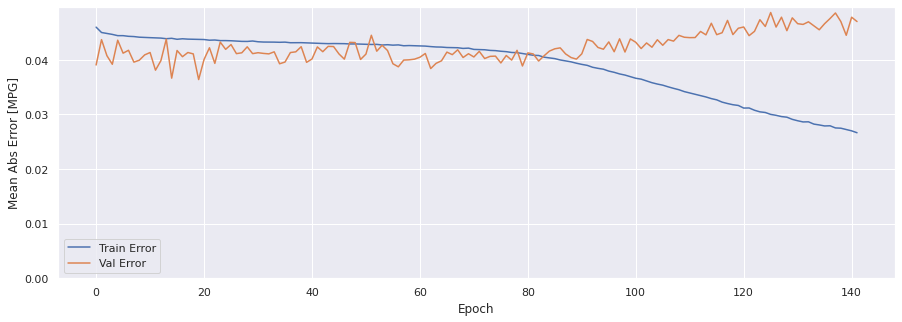

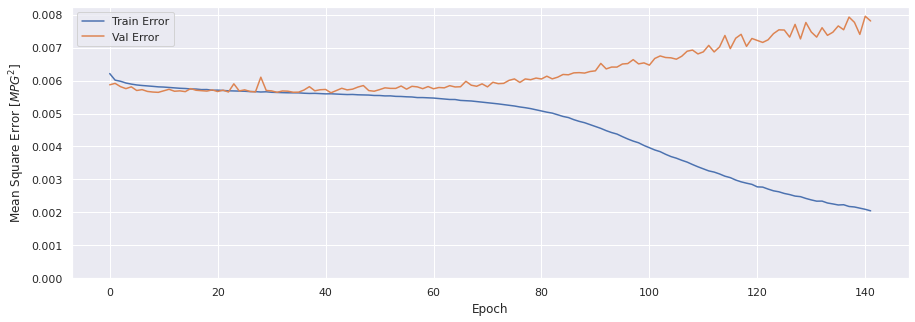

In [50]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history2)

### Evaluar predicciones

In [51]:
score_train2 = model2.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train2[0]}')
print(f'MAE:{score_train2[1]}')
print(f'MSE:{score_train2[2]}')
print(f'SMAPE:{score_train2[3]}')

1413/1413 [==============================] - 9s 7ms/step - loss: 0.0020 - mae: 0.0264 - mse: 0.0020 - smape: 0.6966
Loss:0.001952692517079413
MAE:0.02636648714542389
MSE:0.001952692517079413
SMAPE:0.6966477036476135


In [52]:
score_val2 = model2.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val2[0]}')
print(f'MAE:{score_val2[1]}')
print(f'MSE:{score_val2[2]}')
print(f'SMAPE:{score_val2[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0078 - mae: 0.0470 - mse: 0.0078 - smape: 0.8437
Loss:0.007809233386069536
MAE:0.04701715707778931
MSE:0.007809233386069536
SMAPE:0.8437326550483704


In [53]:
score_test2 = model2.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test2[0]}')
print(f'MAE:{score_test2[1]}')
print(f'MSE:{score_test2[2]}')
print(f'SMAPE:{score_test2[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0082 - mae: 0.0508 - mse: 0.0082 - smape: 0.8601
Loss:0.008168278262019157
MAE:0.05080661177635193
MSE:0.008168278262019157
SMAPE:0.8600807189941406


### Comparativa de resultados

In [54]:
result = hist2.iloc[-1]
comparativa2 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test2[1], score_test2[2], score_test2[3], math.sqrt(score_test2[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa2.style.set_caption("Método de ventana de varios pasos - LSTM de dos capas")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.026655,0.002048,0.678209,0.045253
VALIDACION,0.047017,0.007809,0.844375,0.088370
TEST,0.050807,0.008168,0.860081,0.090379


### Obtener predicciones

In [55]:
trainPredict2 = model2.predict(scaled_trainX)
testPredict2 = model2.predict(scaled_testX)

### Visualización de las predicciones

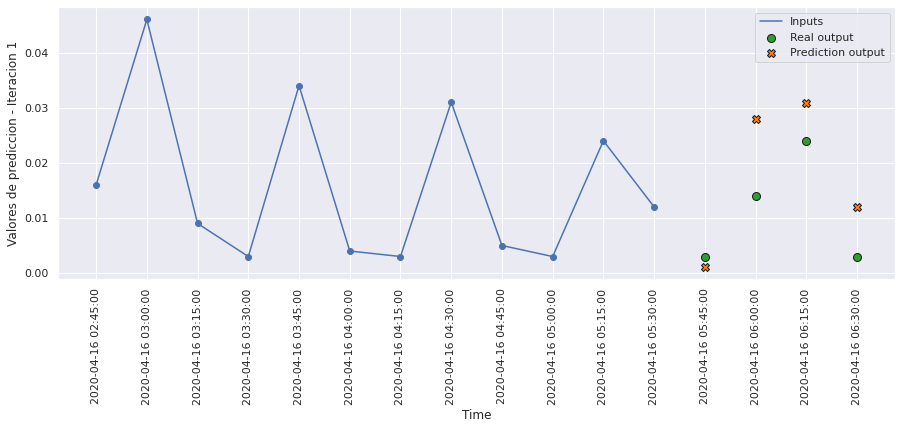

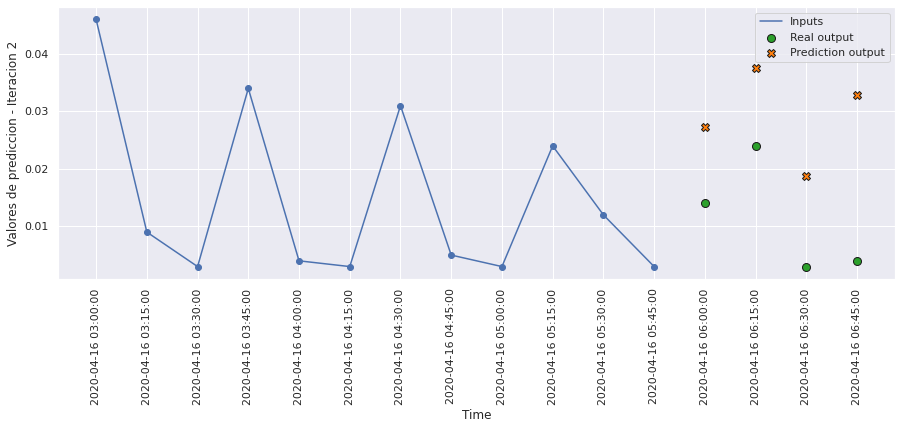

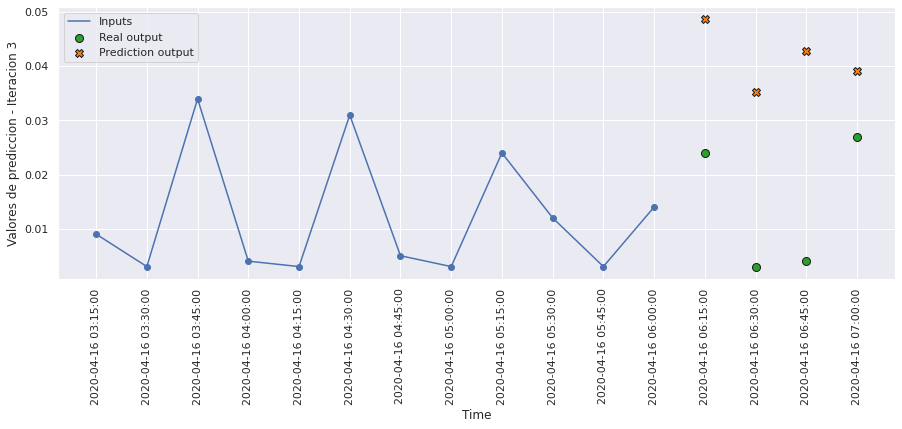

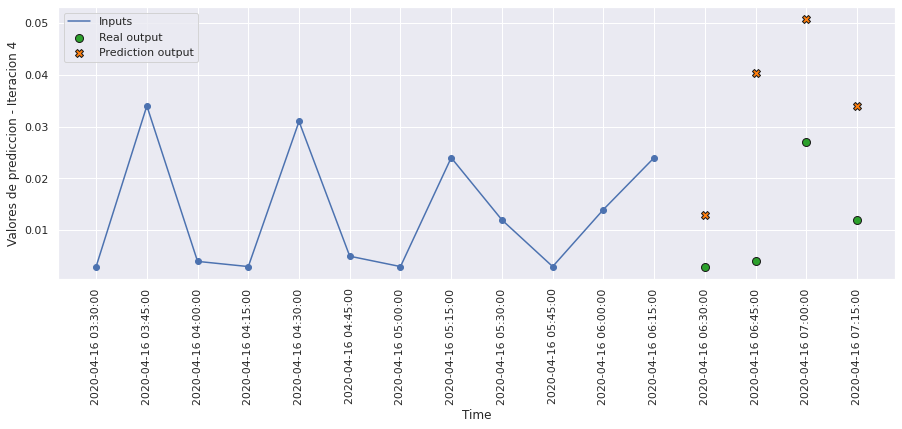

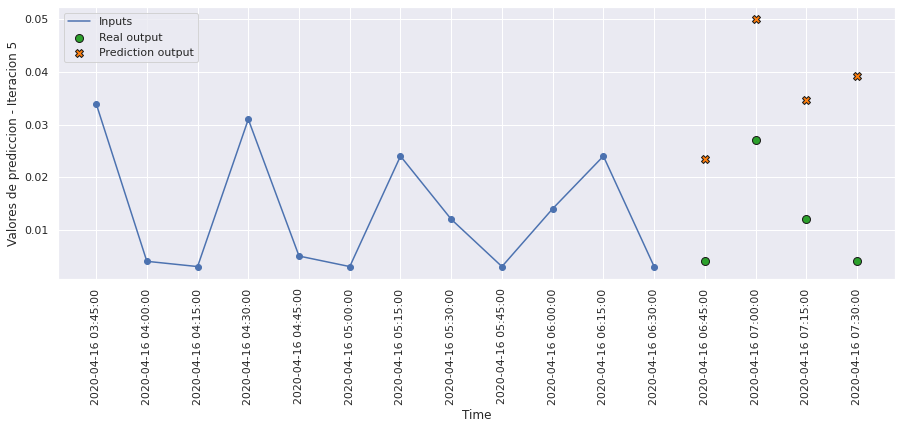

...

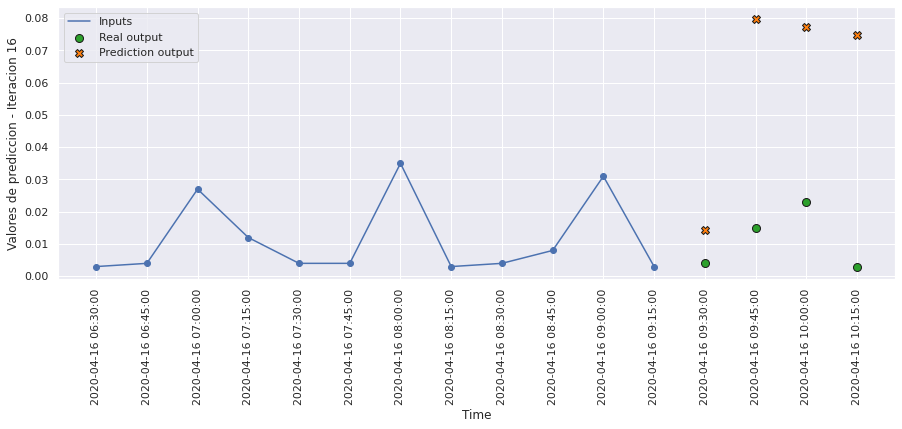

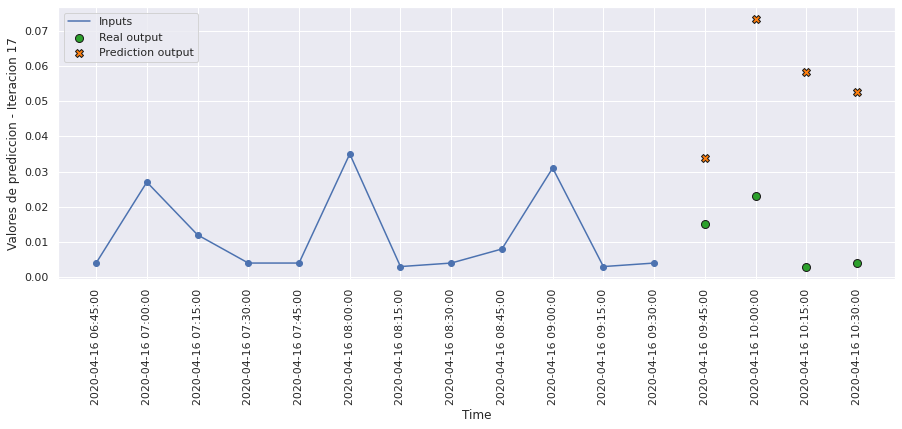

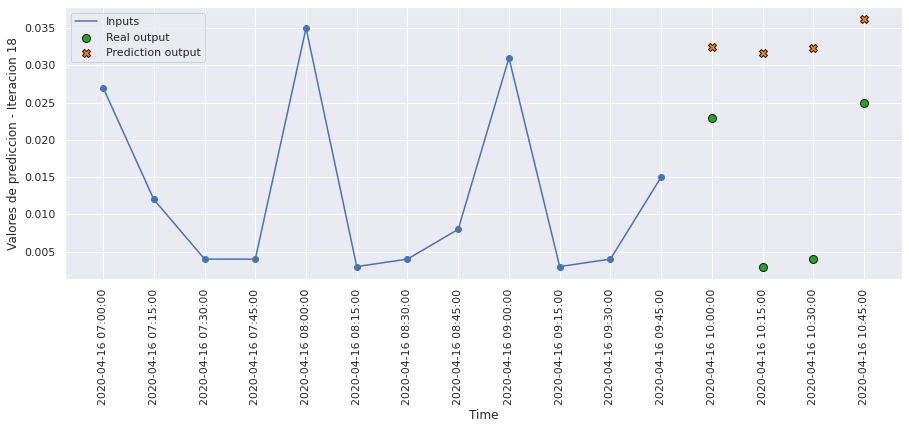

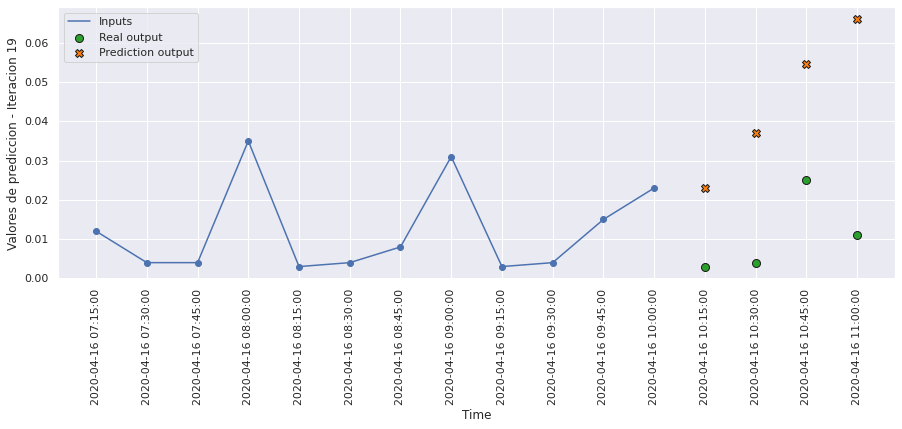

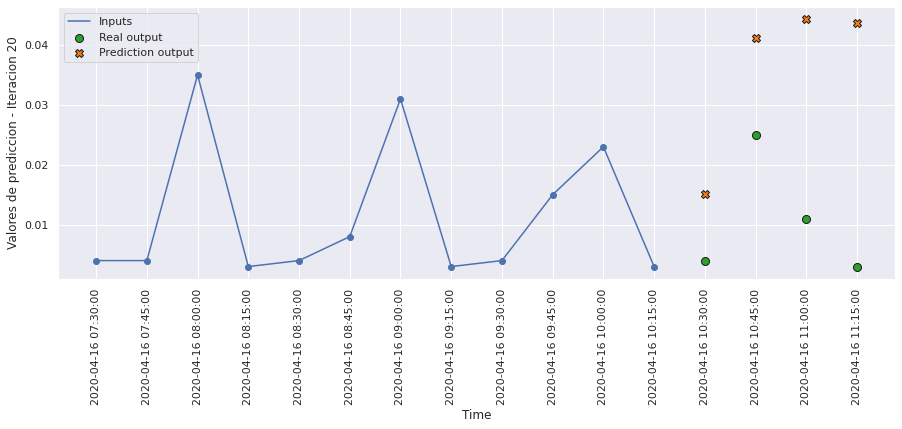

In [56]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict2, 20, 0)

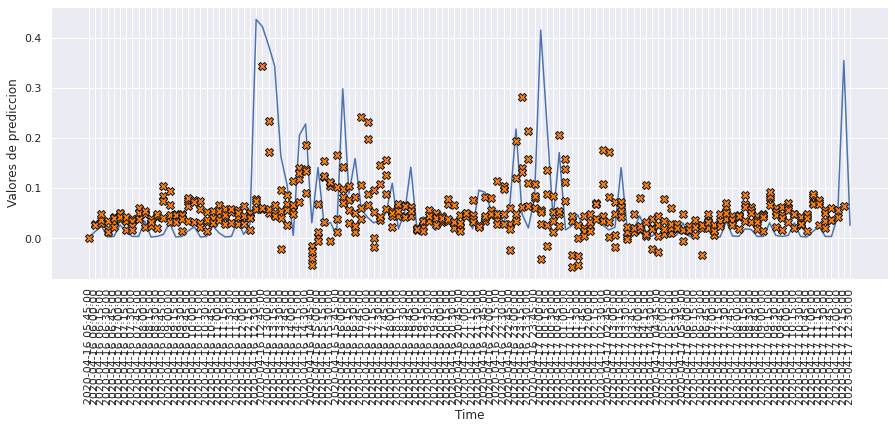

In [57]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict2, 120)

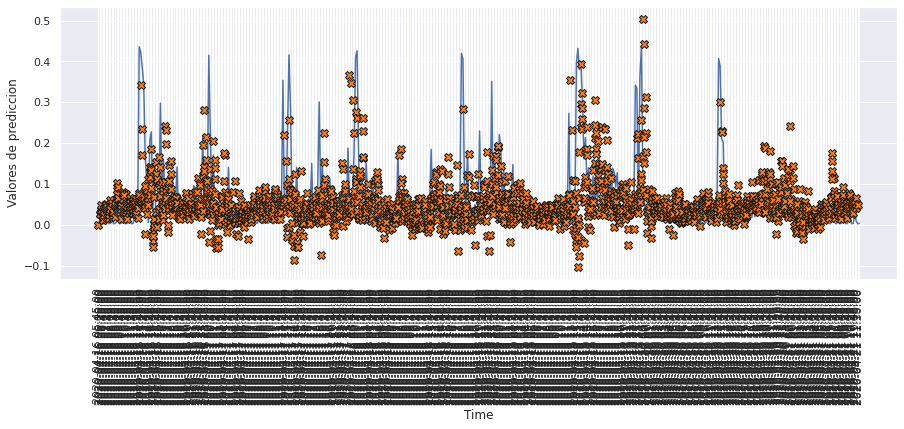

In [58]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict2, 500)

# MODELO 3: LSTM DE 3 CAPAS

### Construimos el modelo

In [59]:
def build_model3():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences=True),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences=True),
        tf.keras.layers.LSTM(64, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [60]:
model3 = build_model3()
model3.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_3 (LSTM)               (None, 12, 128)           66560     
                                                                 
 lstm_4 (LSTM)               (None, 12, 128)           131584    
                                                                 
 lstm_5 (LSTM)               (None, 64)                49408     
                                                                 
 dense_2 (Dense)             (None, 4)                 260       
                                                                 
Total params: 247,812
Trainable params: 247,812
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [61]:
history3 = model3.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 9s 19ms/step - loss: 0.0063 - mae: 0.0467 - mse: 0.0063 - smape: 0.8258 - val_loss: 0.0059 - val_mae: 0.0436 - val_mse: 0.0059 - val_smape: 0.8015
Epoch 2/200
354/354 [==============================] - 6s 16ms/step - loss: 0.0060 - mae: 0.0450 - mse: 0.0060 - smape: 0.8009 - val_loss: 0.0058 - val_mae: 0.0376 - val_mse: 0.0058 - val_smape: 0.7025
Epoch 3/200
354/354 [==============================] - 6s 17ms/step - loss: 0.0059 - mae: 0.0446 - mse: 0.0059 - smape: 0.7949 - val_loss: 0.0057 - val_mae: 0.0397 - val_mse: 0.0057 - val_smape: 0.7477
Epoch 4/200
354/354 [==============================] - 6s 17ms/step - loss: 0.0059 - mae: 0.0444 - mse: 0.0059 - smape: 0.7940 - val_loss: 0.0057 - val_mae: 0.0421 - val_mse: 0.0057 - val_smape: 0.7907
Epoch 5/200
354/354 [==============================] - 6s 17ms/step - loss: 0.0059 - mae: 0.0443 - mse: 0.0059 - smape: 0.7913 - val_loss: 0.0057 - val_mae: 0.0406 - val_mse: 0.0057 - val_smap

354/354 [==============================] - 6s 16ms/step - loss: 0.0029 - mae: 0.0320 - mse: 0.0029 - smape: 0.7142 - val_loss: 0.0072 - val_mae: 0.0456 - val_mse: 0.0072 - val_smape: 0.7984
Epoch 82/200
354/354 [==============================] - 6s 16ms/step - loss: 0.0028 - mae: 0.0318 - mse: 0.0028 - smape: 0.7131 - val_loss: 0.0071 - val_mae: 0.0442 - val_mse: 0.0071 - val_smape: 0.7792
Epoch 83/200
354/354 [==============================] - 6s 17ms/step - loss: 0.0028 - mae: 0.0315 - mse: 0.0028 - smape: 0.7116 - val_loss: 0.0070 - val_mae: 0.0436 - val_mse: 0.0070 - val_smape: 0.7985
Epoch 84/200
354/354 [==============================] - 6s 17ms/step - loss: 0.0027 - mae: 0.0312 - mse: 0.0027 - smape: 0.7096 - val_loss: 0.0069 - val_mae: 0.0426 - val_mse: 0.0069 - val_smape: 0.7733
Epoch 85/200
354/354 [==============================] - 6s 17ms/step - loss: 0.0027 - mae: 0.0310 - mse: 0.0027 - smape: 0.7075 - val_loss: 0.0070 - val_mae: 0.0432 - val_mse: 0.0070 - val_smape: 0.784

In [62]:
hist3 = pd.DataFrame(history3.history)
hist3['epoch'] = history3.epoch
hist3

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006346,0.046696,0.006346,0.825788,0.005893,0.043582,0.005893,0.801519,0
1,0.005994,0.045038,0.005994,0.800926,0.005829,0.037639,0.005829,0.702538,1
2,0.005918,0.044588,0.005918,0.794937,0.005738,0.039696,0.005738,0.747679,2
3,0.005881,0.044435,0.005881,0.793962,0.005722,0.042136,0.005722,0.790663,3
4,0.005853,0.044309,0.005853,0.791315,0.005731,0.040639,0.005731,0.765150,4
...,...,...,...,...,...,...,...,...,...
111,0.001773,0.025518,0.001773,0.665943,0.007436,0.045261,0.007436,0.797166,111
112,0.001778,0.025504,0.001778,0.663895,0.007421,0.045978,0.007421,0.791661,112
113,0.001722,0.025192,0.001722,0.663227,0.007308,0.045329,0.007308,0.789123,113
114,0.001708,0.025046,0.001708,0.661455,0.007418,0.045889,0.007418,0.795394,114


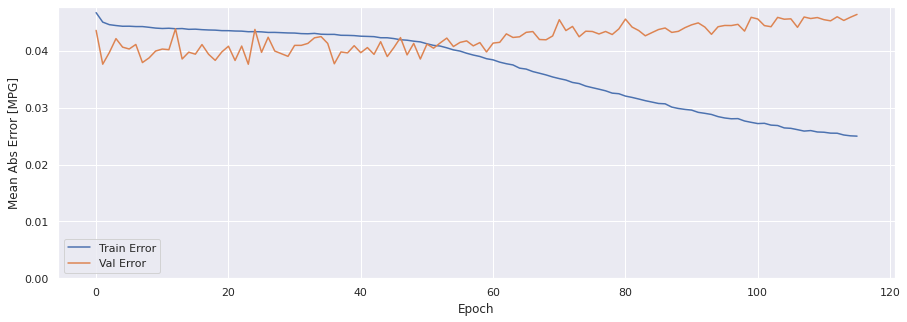

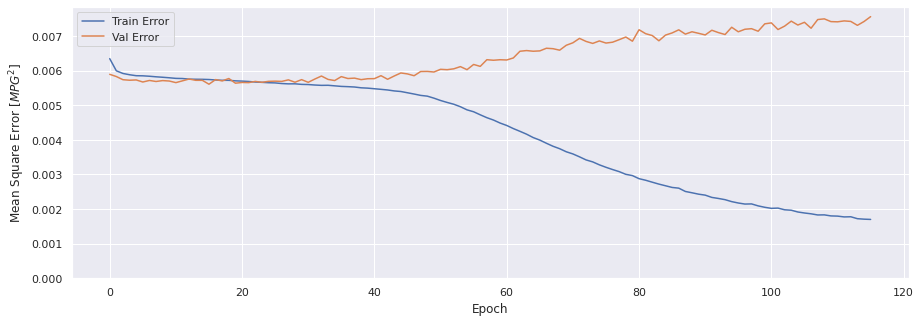

In [63]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history3)

### Evaluar predicciones

In [64]:
score_train3 = model3.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train3[0]}')
print(f'MAE:{score_train3[1]}')
print(f'MSE:{score_train3[2]}')
print(f'SMAPE:{score_train3[3]}')

1413/1413 [==============================] - 11s 8ms/step - loss: 0.0016 - mae: 0.0243 - mse: 0.0016 - smape: 0.6436
Loss:0.0015931520611047745
MAE:0.0243386197835207
MSE:0.0015931520611047745
SMAPE:0.6435579061508179


In [65]:
score_val3 = model3.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val3[0]}')
print(f'MAE:{score_val3[1]}')
print(f'MSE:{score_val3[2]}')
print(f'SMAPE:{score_val3[3]}')

303/303 [==============================] - 2s 8ms/step - loss: 0.0076 - mae: 0.0464 - mse: 0.0076 - smape: 0.7997
Loss:0.0075594657100737095
MAE:0.04639070853590965
MSE:0.0075594657100737095
SMAPE:0.7996543645858765


In [66]:
score_test3 = model3.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test3[0]}')
print(f'MAE:{score_test3[1]}')
print(f'MSE:{score_test3[2]}')
print(f'SMAPE:{score_test3[3]}')

303/303 [==============================] - 2s 8ms/step - loss: 0.0081 - mae: 0.0509 - mse: 0.0081 - smape: 0.8298
Loss:0.008124849759042263
MAE:0.05085611715912819
MSE:0.008124849759042263
SMAPE:0.8298024535179138


### Comparativa de resultados

In [67]:
result = hist3.iloc[-1]
comparativa3 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test3[1], score_test3[2], score_test3[3], math.sqrt(score_test3[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa3.style.set_caption("Método de ventana de varios pasos - LSTM de tres capas")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.024991,0.001701,0.660235,0.041242
VALIDACION,0.046391,0.007559,0.800320,0.086945
TEST,0.050856,0.008125,0.829802,0.090138


### Obtener predicciones

In [68]:
trainPredict3 = model3.predict(scaled_trainX)
testPredict3 = model3.predict(scaled_testX)

### Visualización de las predicciones

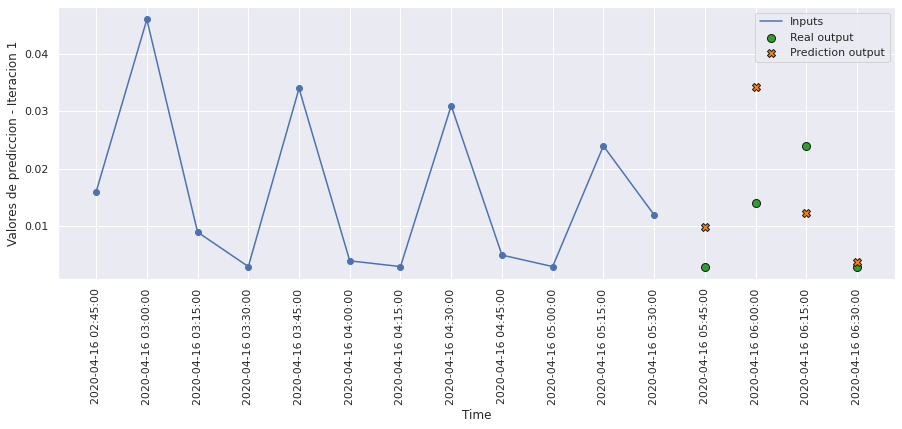

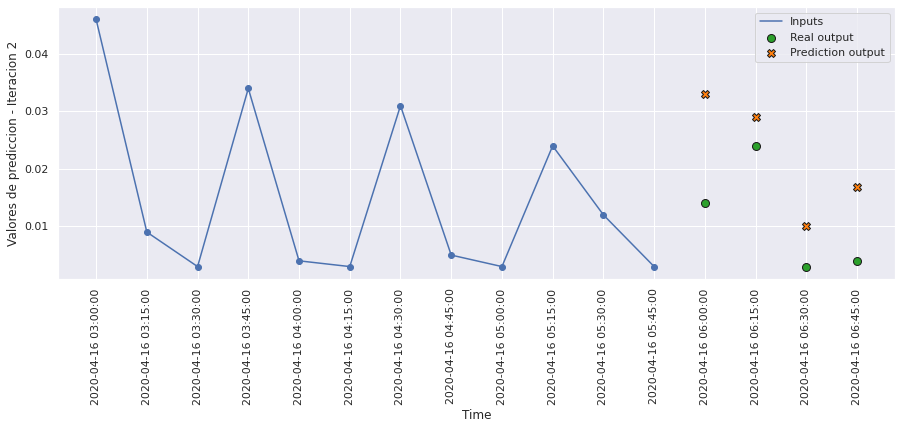

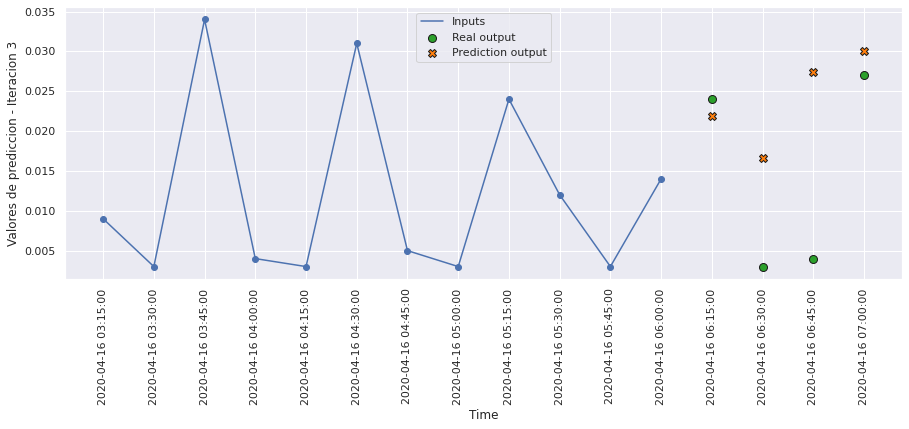

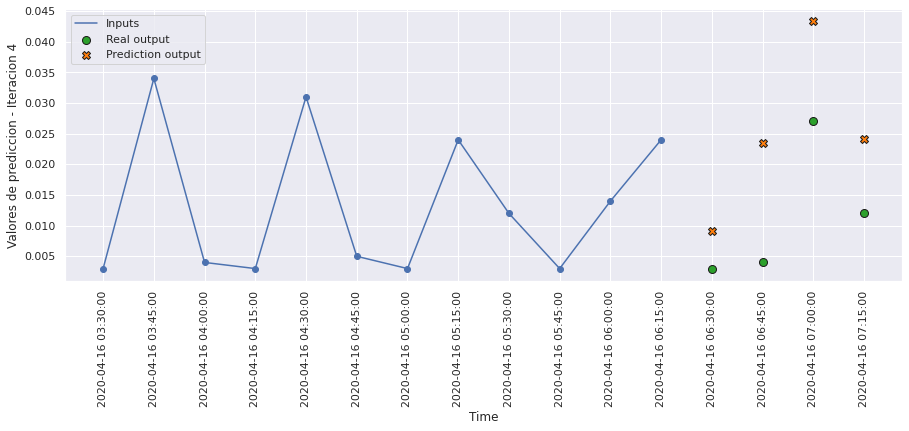

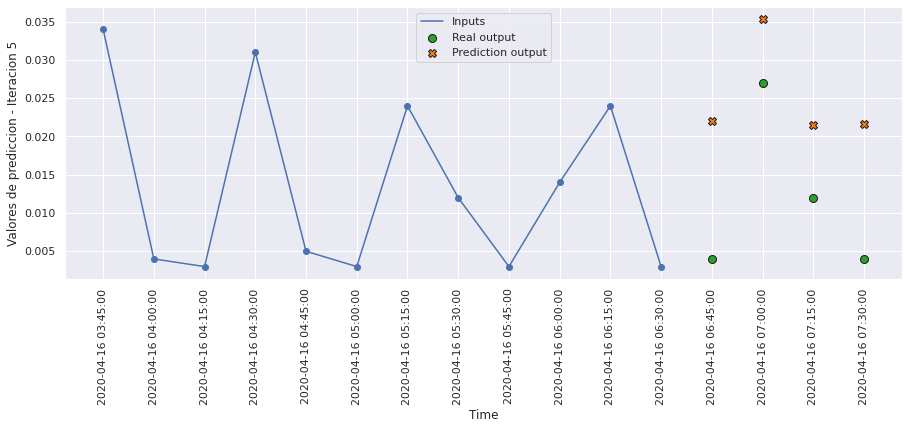

...

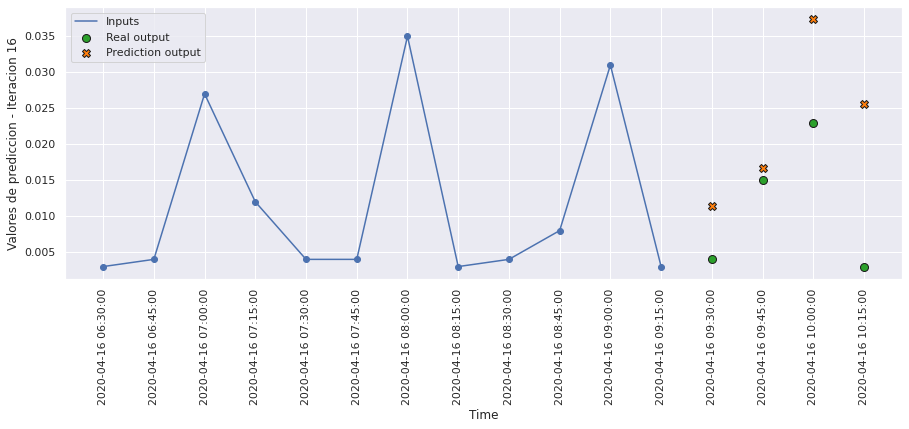

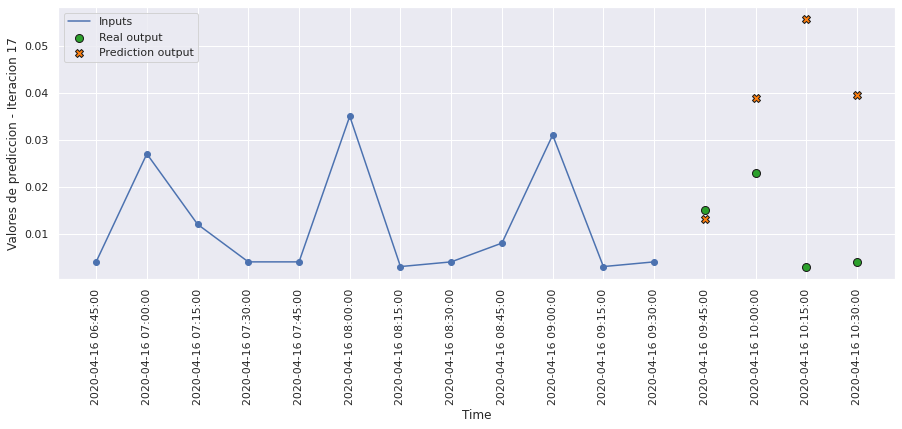

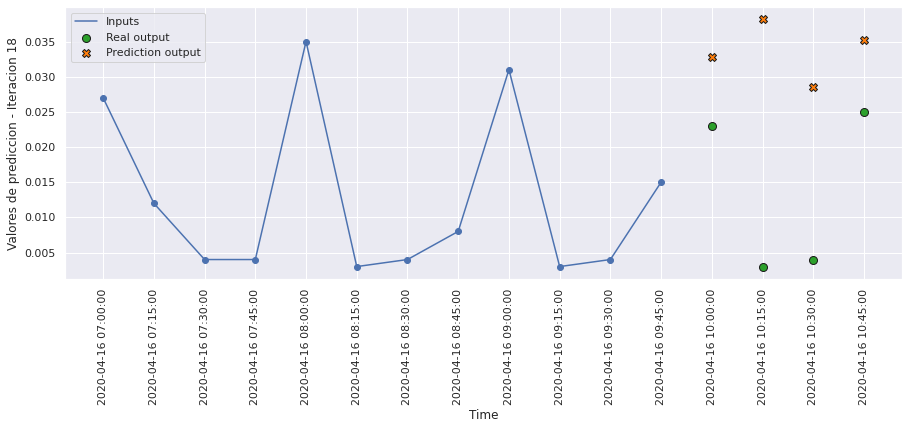

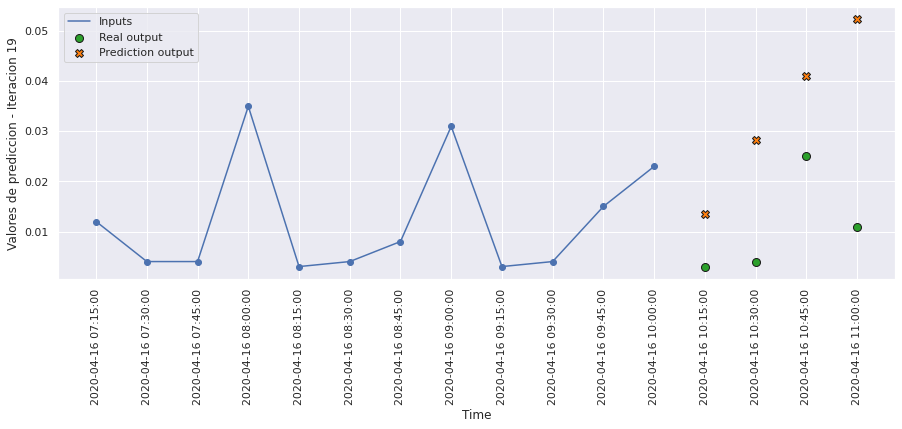

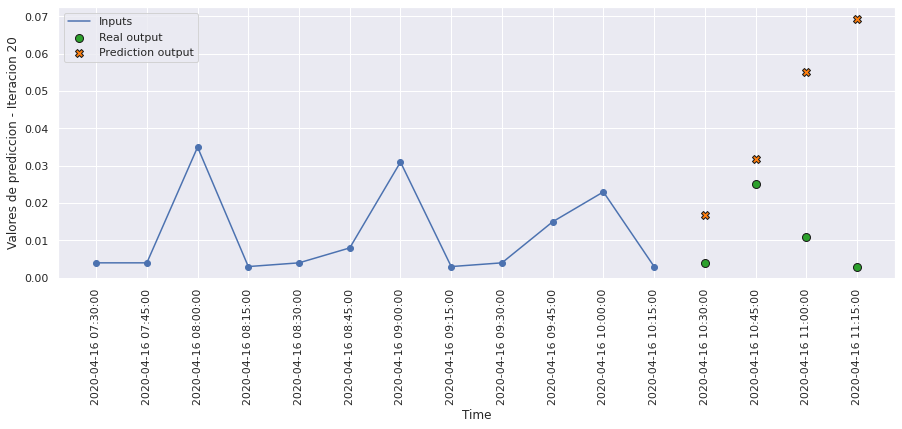

In [69]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict3, 20, 0)

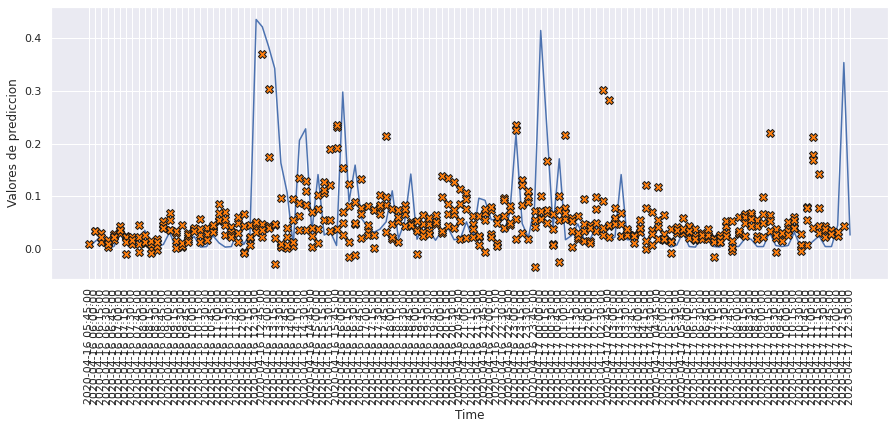

In [70]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict3, 120)

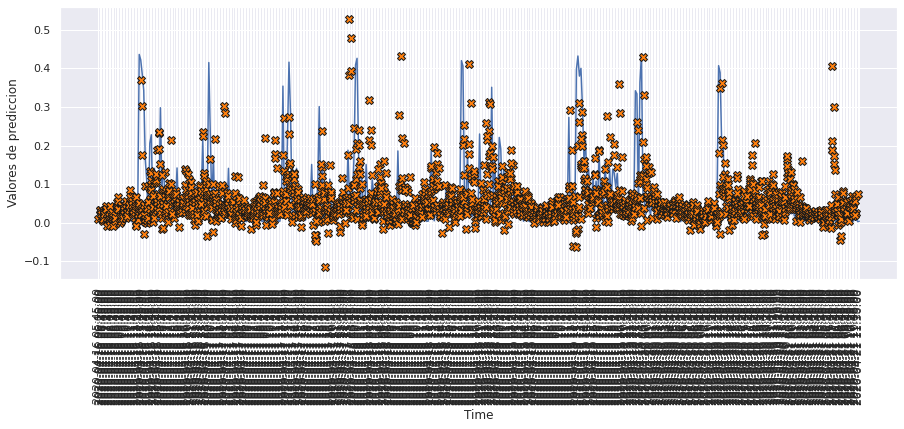

In [71]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict3, 500)

# MODELO 4: LSTM BIDIRECCIONAL

### Construimos el modelo

In [72]:
def build_model4():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(128, activation='tanh')),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [73]:
model4 = build_model4()
model4.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional (Bidirectiona  (None, 256)              133120    
 l)                                                              
                                                                 
 dense_3 (Dense)             (None, 4)                 1028      
                                                                 
Total params: 134,148
Trainable params: 134,148
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [74]:
history4 = model4.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 7s 14ms/step - loss: 0.0061 - mae: 0.0458 - mse: 0.0061 - smape: 0.8130 - val_loss: 0.0059 - val_mae: 0.0406 - val_mse: 0.0059 - val_smape: 0.7538
Epoch 2/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0060 - mae: 0.0450 - mse: 0.0060 - smape: 0.8000 - val_loss: 0.0059 - val_mae: 0.0411 - val_mse: 0.0059 - val_smape: 0.7603
Epoch 3/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0060 - mae: 0.0449 - mse: 0.0060 - smape: 0.7989 - val_loss: 0.0059 - val_mae: 0.0429 - val_mse: 0.0059 - val_smape: 0.7865
Epoch 4/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0059 - mae: 0.0446 - mse: 0.0059 - smape: 0.7951 - val_loss: 0.0058 - val_mae: 0.0386 - val_mse: 0.0058 - val_smape: 0.7286
Epoch 5/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0059 - mae: 0.0444 - mse: 0.0059 - smape: 0.7936 - val_loss: 0.0057 - val_mae: 0.0393 - val_mse: 0.0057 - val_smap

354/354 [==============================] - 4s 12ms/step - loss: 0.0055 - mae: 0.0428 - mse: 0.0055 - smape: 0.7688 - val_loss: 0.0058 - val_mae: 0.0420 - val_mse: 0.0058 - val_smape: 0.7739
Epoch 82/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0055 - mae: 0.0429 - mse: 0.0055 - smape: 0.7698 - val_loss: 0.0058 - val_mae: 0.0406 - val_mse: 0.0058 - val_smape: 0.7594
Epoch 83/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0055 - mae: 0.0429 - mse: 0.0055 - smape: 0.7689 - val_loss: 0.0057 - val_mae: 0.0387 - val_mse: 0.0057 - val_smape: 0.7210
Epoch 84/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0055 - mae: 0.0429 - mse: 0.0055 - smape: 0.7699 - val_loss: 0.0057 - val_mae: 0.0392 - val_mse: 0.0057 - val_smape: 0.7428
Epoch 85/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0055 - mae: 0.0428 - mse: 0.0055 - smape: 0.7681 - val_loss: 0.0058 - val_mae: 0.0393 - val_mse: 0.0058 - val_smape: 0.736

In [75]:
hist4 = pd.DataFrame(history4.history)
hist4['epoch'] = history4.epoch
hist4

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006146,0.045751,0.006146,0.813014,0.005874,0.040621,0.005874,0.753801,0
1,0.006002,0.044983,0.006002,0.799951,0.005852,0.041091,0.005852,0.760309,1
2,0.005980,0.044862,0.005980,0.798853,0.005857,0.042932,0.005857,0.786530,2
3,0.005923,0.044594,0.005923,0.795137,0.005776,0.038622,0.005776,0.728581,3
4,0.005889,0.044408,0.005889,0.793645,0.005707,0.039323,0.005707,0.736155,4
...,...,...,...,...,...,...,...,...,...
115,0.005144,0.041545,0.005144,0.761547,0.005979,0.040190,0.005979,0.743207,115
116,0.005116,0.041452,0.005116,0.762296,0.005927,0.040644,0.005927,0.752094,116
117,0.005080,0.041295,0.005080,0.761798,0.006062,0.043981,0.006062,0.792400,117
118,0.005069,0.041363,0.005069,0.763125,0.006030,0.040738,0.006030,0.756976,118


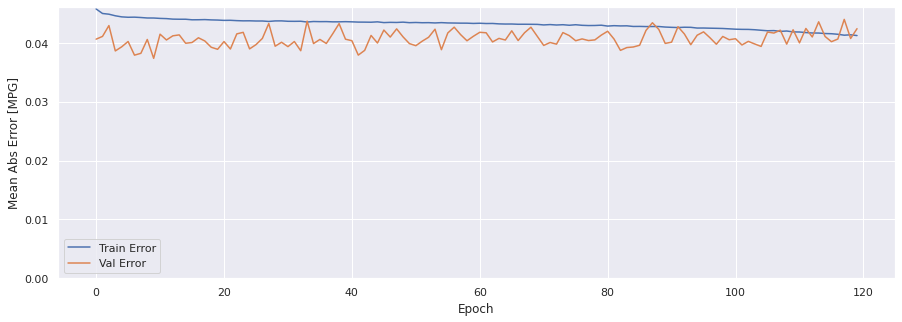

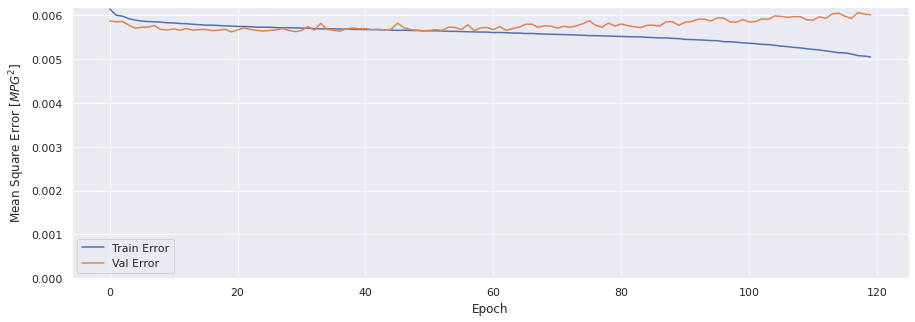

In [76]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history4)

### Evaluar predicciones

In [77]:
score_train4 = model4.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train4[0]}')
print(f'MAE:{score_train4[1]}')
print(f'MSE:{score_train4[2]}')
print(f'SMAPE:{score_train4[3]}')

1413/1413 [==============================] - 8s 6ms/step - loss: 0.0050 - mae: 0.0416 - mse: 0.0050 - smape: 0.7673
Loss:0.004981448408216238
MAE:0.041586991399526596
MSE:0.004981448408216238
SMAPE:0.7672837972640991


In [78]:
score_val4 = model4.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val4[0]}')
print(f'MAE:{score_val4[1]}')
print(f'MSE:{score_val4[2]}')
print(f'SMAPE:{score_val4[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0060 - mae: 0.0424 - mse: 0.0060 - smape: 0.7729
Loss:0.006008358206599951
MAE:0.04240303114056587
MSE:0.006008358206599951
SMAPE:0.7728894948959351


In [79]:
score_test4 = model4.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test4[0]}')
print(f'MAE:{score_test4[1]}')
print(f'MSE:{score_test4[2]}')
print(f'SMAPE:{score_test4[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0064 - mae: 0.0467 - mse: 0.0064 - smape: 0.7959
Loss:0.006357486359775066
MAE:0.046660929918289185
MSE:0.006357486359775066
SMAPE:0.7958712577819824


### Comparativa de resultados

In [80]:
result = hist4.iloc[-1]
comparativa4 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test4[1], score_test4[2], score_test4[3], math.sqrt(score_test4[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa4.style.set_caption("Método de ventana de varios pasos - Bidireccional LSTM")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.041233,0.005052,0.762121,0.071074
VALIDACION,0.042403,0.006008,0.773916,0.077514
TEST,0.046661,0.006357,0.795871,0.079734


### Obtener predicciones

In [81]:
trainPredict4 = model4.predict(scaled_trainX)
testPredict4 = model4.predict(scaled_testX)

### Visualización de las predicciones

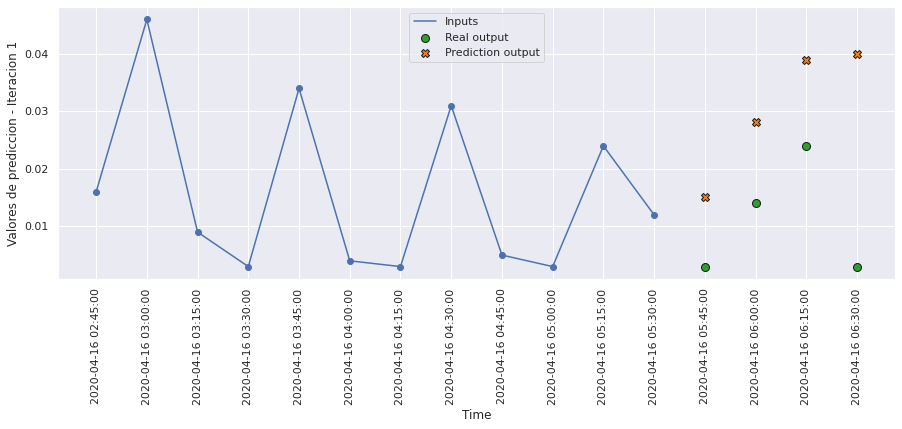

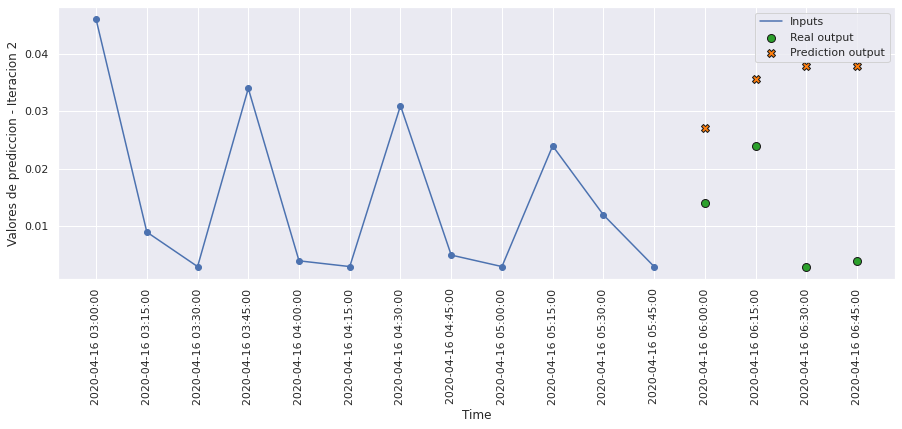

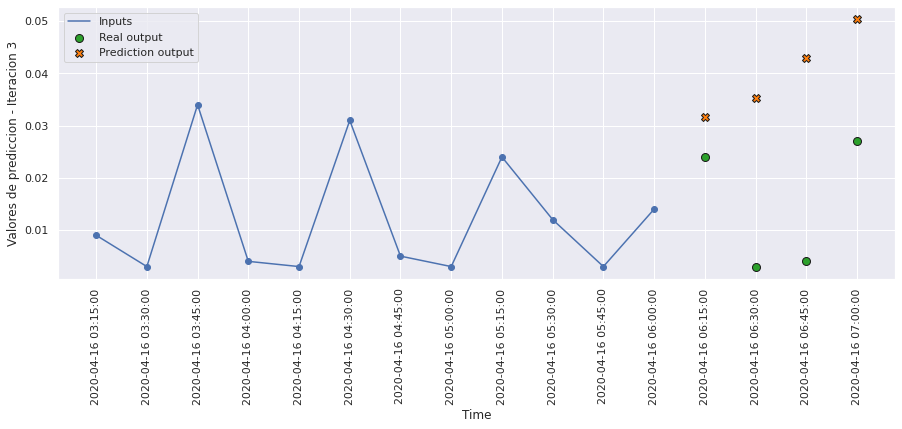

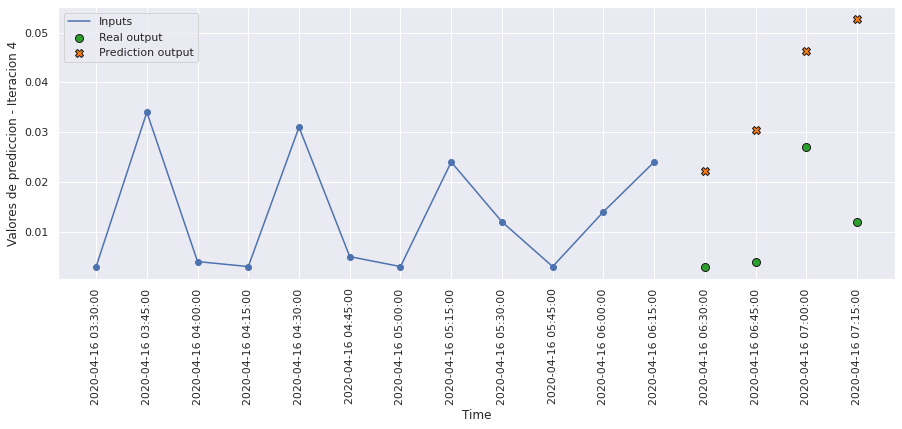

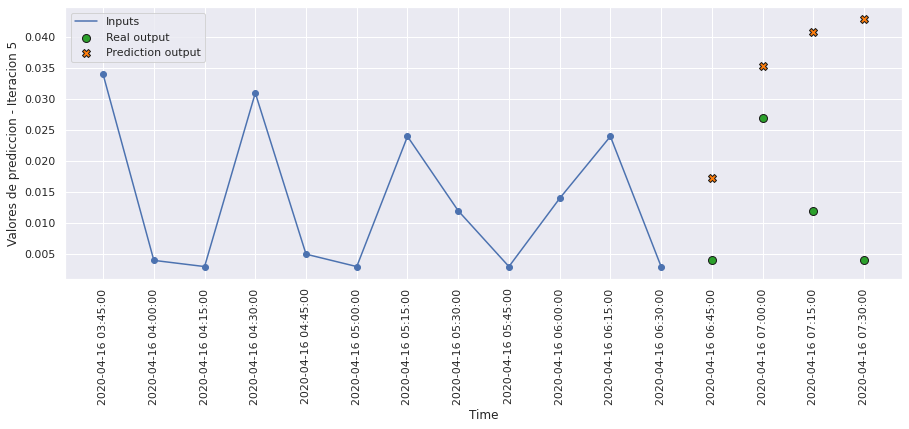

...

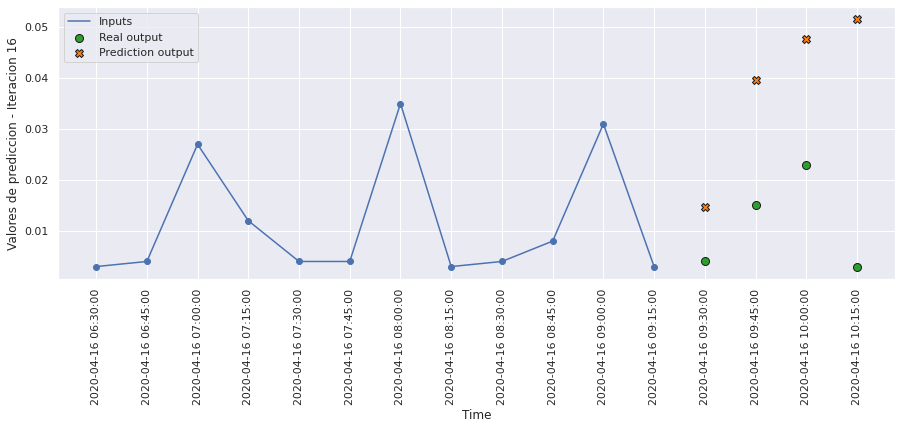

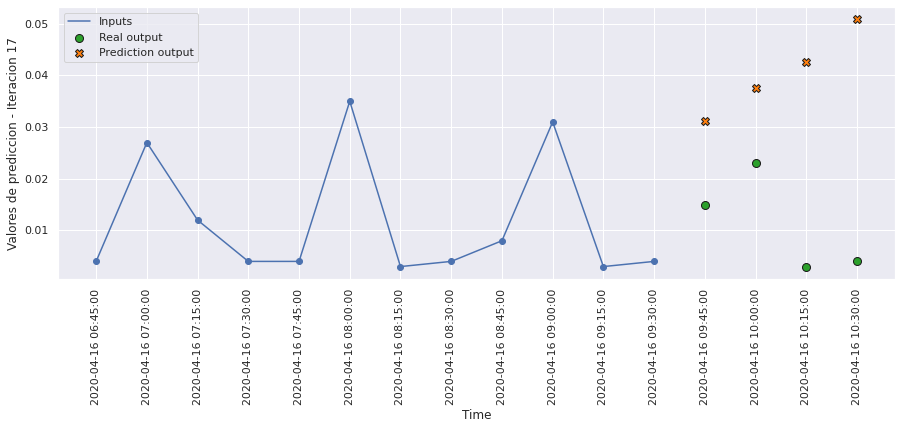

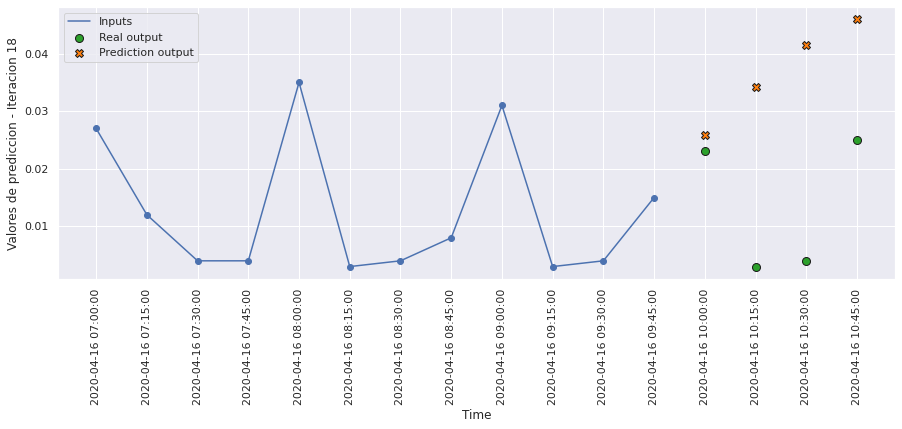

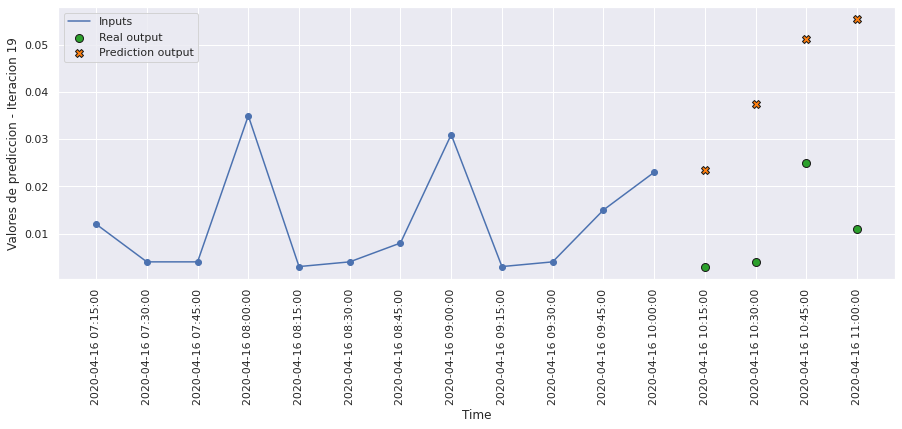

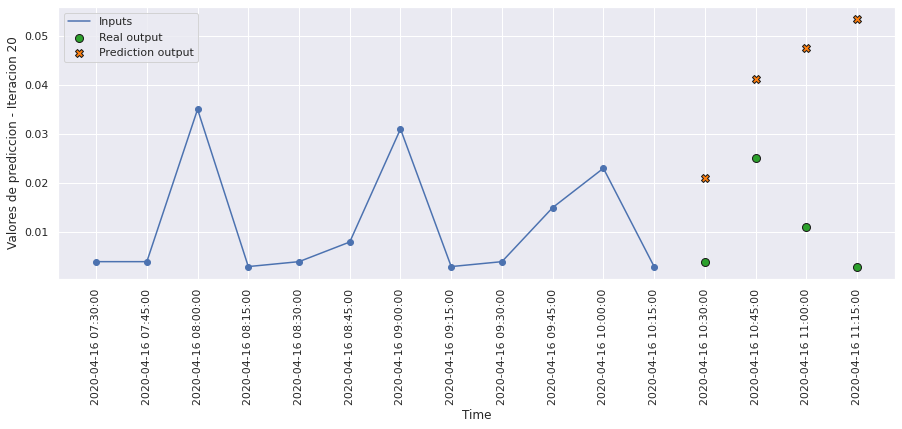

In [82]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict4, 20, 0)

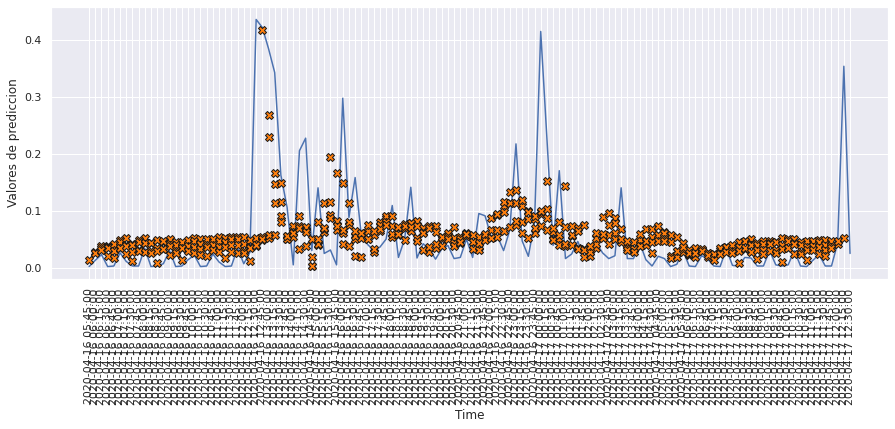

In [83]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict4, 120)

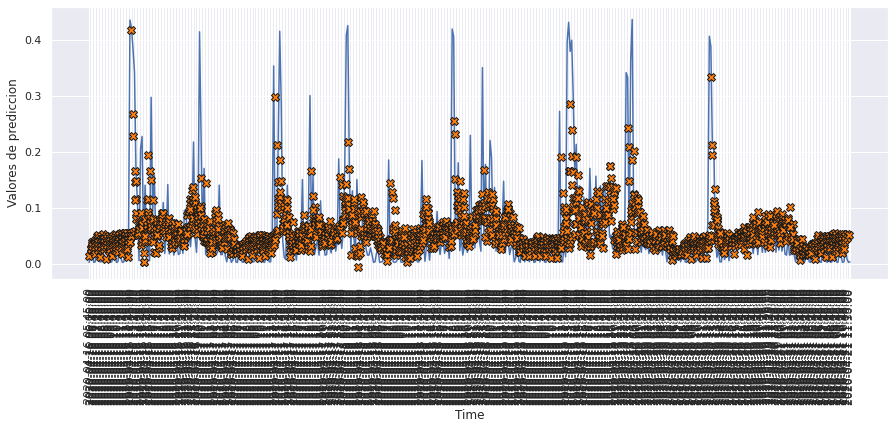

In [84]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict4, 500)

# MODELO 5: CONVOLUCIONAL 1D

### Construimos el modelo

In [85]:
def build_model5():
    model = tf.keras.Sequential([
        tf.keras.layers.TimeDistributed(tf.keras.layers.Conv1D(filters=64, kernel_size=1, activation='relu'), 
                                        input_shape=(None, n_entrada, n_features)),
        tf.keras.layers.TimeDistributed(tf.keras.layers.MaxPooling1D(pool_size=2)),
        tf.keras.layers.TimeDistributed(tf.keras.layers.Flatten()),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [86]:
model5 = build_model5()
model5.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed (TimeDistr  (None, None, 12, 64)     128       
 ibuted)                                                         
                                                                 
 time_distributed_1 (TimeDis  (None, None, 6, 64)      0         
 tributed)                                                       
                                                                 
 time_distributed_2 (TimeDis  (None, None, 384)        0         
 tributed)                                                       
                                                                 
 dense_4 (Dense)             (None, None, 4)           1540      
                                                                 
Total params: 1,668
Trainable params: 1,668
Non-trainable params: 0
____________________________________________________

### Entrenamiento del modelo

In [87]:
history5 = model5.fit(scaled_trainX_4D, data_trainY_3D, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX_4D, data_valY_3D), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 3s 7ms/step - loss: 0.0063 - mae: 0.0466 - mse: 0.0063 - smape: 0.8264 - val_loss: 0.0060 - val_mae: 0.0423 - val_mse: 0.0060 - val_smape: 0.7737
Epoch 2/200
354/354 [==============================] - 2s 7ms/step - loss: 0.0061 - mae: 0.0456 - mse: 0.0061 - smape: 0.8071 - val_loss: 0.0060 - val_mae: 0.0378 - val_mse: 0.0060 - val_smape: 0.6984
Epoch 3/200
354/354 [==============================] - 2s 7ms/step - loss: 0.0061 - mae: 0.0454 - mse: 0.0061 - smape: 0.8030 - val_loss: 0.0060 - val_mae: 0.0404 - val_mse: 0.0060 - val_smape: 0.7437
Epoch 4/200
354/354 [==============================] - 2s 7ms/step - loss: 0.0061 - mae: 0.0453 - mse: 0.0061 - smape: 0.8028 - val_loss: 0.0060 - val_mae: 0.0392 - val_mse: 0.0060 - val_smape: 0.7145
Epoch 5/200
354/354 [==============================] - 2s 7ms/step - loss: 0.0061 - mae: 0.0453 - mse: 0.0061 - smape: 0.8011 - val_loss: 0.0061 - val_mae: 0.0380 - val_mse: 0.0061 - val_smape: 0.

Epoch 82/200
354/354 [==============================] - 2s 7ms/step - loss: 0.0060 - mae: 0.0450 - mse: 0.0060 - smape: 0.7955 - val_loss: 0.0061 - val_mae: 0.0382 - val_mse: 0.0061 - val_smape: 0.7016
Epoch 83/200
354/354 [==============================] - 2s 7ms/step - loss: 0.0060 - mae: 0.0451 - mse: 0.0060 - smape: 0.7959 - val_loss: 0.0061 - val_mae: 0.0377 - val_mse: 0.0061 - val_smape: 0.6898
Epoch 84/200
354/354 [==============================] - 2s 7ms/step - loss: 0.0060 - mae: 0.0450 - mse: 0.0060 - smape: 0.7957 - val_loss: 0.0061 - val_mae: 0.0385 - val_mse: 0.0061 - val_smape: 0.7075
Epoch 85/200
354/354 [==============================] - 2s 7ms/step - loss: 0.0060 - mae: 0.0450 - mse: 0.0060 - smape: 0.7949 - val_loss: 0.0060 - val_mae: 0.0405 - val_mse: 0.0060 - val_smape: 0.7284
Epoch 86/200
354/354 [==============================] - 2s 7ms/step - loss: 0.0060 - mae: 0.0451 - mse: 0.0060 - smape: 0.7964 - val_loss: 0.0060 - val_mae: 0.0380 - val_mse: 0.0060 - val_smap

354/354 [==============================] - 2s 7ms/step - loss: 0.0060 - mae: 0.0450 - mse: 0.0060 - smape: 0.7952 - val_loss: 0.0060 - val_mae: 0.0381 - val_mse: 0.0060 - val_smape: 0.6922
Epoch 163/200
354/354 [==============================] - 2s 7ms/step - loss: 0.0060 - mae: 0.0450 - mse: 0.0060 - smape: 0.7948 - val_loss: 0.0060 - val_mae: 0.0406 - val_mse: 0.0060 - val_smape: 0.7256
Epoch 164/200
354/354 [==============================] - 2s 7ms/step - loss: 0.0060 - mae: 0.0451 - mse: 0.0060 - smape: 0.7948 - val_loss: 0.0062 - val_mae: 0.0362 - val_mse: 0.0062 - val_smape: 0.6698
Epoch 165/200
354/354 [==============================] - 2s 7ms/step - loss: 0.0060 - mae: 0.0450 - mse: 0.0060 - smape: 0.7940 - val_loss: 0.0060 - val_mae: 0.0384 - val_mse: 0.0060 - val_smape: 0.6988
Epoch 166/200
354/354 [==============================] - 2s 7ms/step - loss: 0.0060 - mae: 0.0450 - mse: 0.0060 - smape: 0.7946 - val_loss: 0.0061 - val_mae: 0.0375 - val_mse: 0.0061 - val_smape: 0.6903

In [88]:
hist5 = pd.DataFrame(history5.history)
hist5['epoch'] = history5.epoch
hist5

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006313,0.046585,0.006313,0.826372,0.006043,0.042343,0.006043,0.773741,0
1,0.006122,0.045635,0.006122,0.807150,0.006025,0.037807,0.006025,0.698369,1
2,0.006100,0.045373,0.006100,0.802973,0.006019,0.040429,0.006019,0.743657,2
3,0.006086,0.045344,0.006086,0.802832,0.006010,0.039217,0.006010,0.714500,3
4,0.006082,0.045301,0.006082,0.801132,0.006058,0.038017,0.006058,0.701795,4
...,...,...,...,...,...,...,...,...,...
195,0.005998,0.044997,0.005998,0.795336,0.006139,0.036739,0.006139,0.683662,195
196,0.005997,0.044899,0.005997,0.793370,0.006053,0.038946,0.006053,0.712869,196
197,0.006011,0.045098,0.006011,0.796049,0.006038,0.037333,0.006038,0.684495,197
198,0.005998,0.044928,0.005998,0.793733,0.006118,0.036773,0.006118,0.674495,198


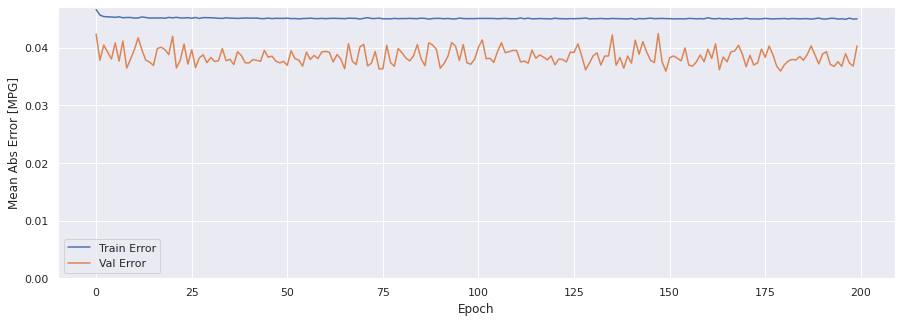

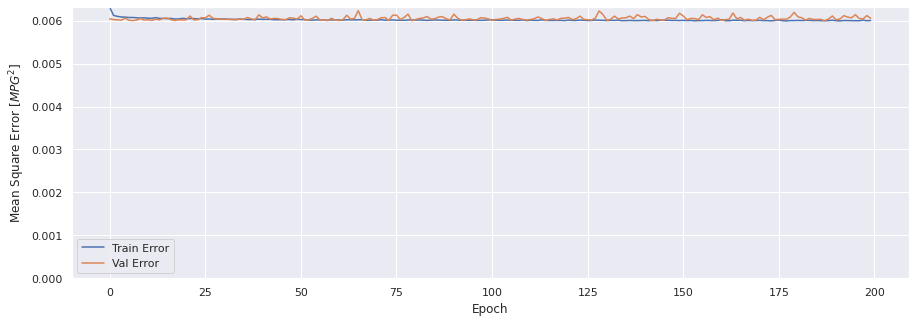

In [89]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history5)

### Evaluar predicciones

In [90]:
score_train5 = model5.evaluate(scaled_trainX_4D, data_trainY_3D, verbose=1)
print(f'Loss:{score_train5[0]}')
print(f'MAE:{score_train5[1]}')
print(f'MSE:{score_train5[2]}')
print(f'SMAPE:{score_train5[3]}')

1413/1413 [==============================] - 6s 4ms/step - loss: 0.0060 - mae: 0.0467 - mse: 0.0060 - smape: 0.8188
Loss:0.005997960455715656
MAE:0.04671471565961838
MSE:0.005997960455715656
SMAPE:0.8187910914421082


In [91]:
score_val5 = model5.evaluate(scaled_valX_4D, data_valY_3D, verbose=1)
print(f'Loss:{score_val5[0]}')
print(f'MAE:{score_val5[1]}')
print(f'MSE:{score_val5[2]}')
print(f'SMAPE:{score_val5[3]}')

303/303 [==============================] - 1s 4ms/step - loss: 0.0061 - mae: 0.0403 - mse: 0.0061 - smape: 0.7332
Loss:0.006055396515876055
MAE:0.04028751701116562
MSE:0.006055396515876055
SMAPE:0.7332442998886108


In [92]:
score_test5 = model5.evaluate(scaled_testX_4D, data_testY_3D, verbose=1)
print(f'Loss:{score_test5[0]}')
print(f'MAE:{score_test5[1]}')
print(f'MSE:{score_test5[2]}')
print(f'SMAPE:{score_test5[3]}')

303/303 [==============================] - 1s 4ms/step - loss: 0.0062 - mae: 0.0445 - mse: 0.0062 - smape: 0.7637
Loss:0.006168342661112547
MAE:0.04454048350453377
MSE:0.006168342661112547
SMAPE:0.7637470960617065


### Comparativa de resultados

In [93]:
result = hist5.iloc[-1]
comparativa5 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test5[1], score_test5[2], score_test5[3], math.sqrt(score_test5[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa5.style.set_caption("Método de ventana de varios pasos - Convolucional 1D")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.044978,0.006004,0.793909,0.077483
VALIDACION,0.040288,0.006055,0.734606,0.077816
TEST,0.044540,0.006168,0.763747,0.078539


### Obtener predicciones

In [94]:
trainPredict5 = model5.predict(scaled_trainX_4D)
testPredict5 = model5.predict(scaled_testX_4D)

### Visualización de las predicciones

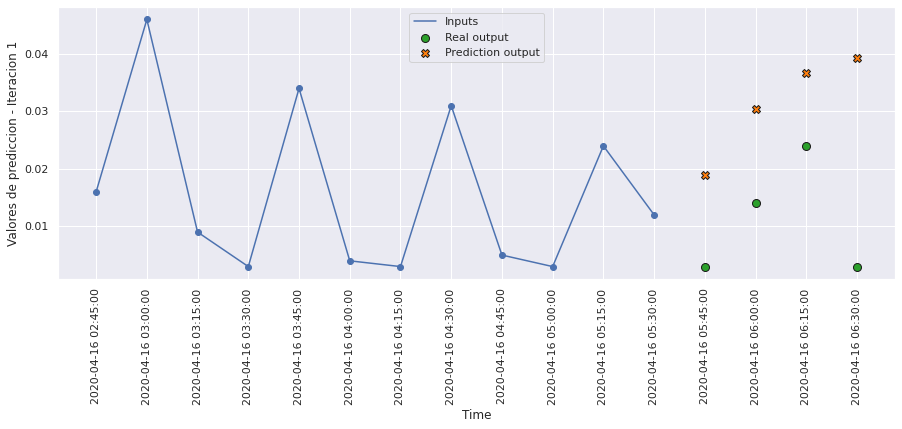

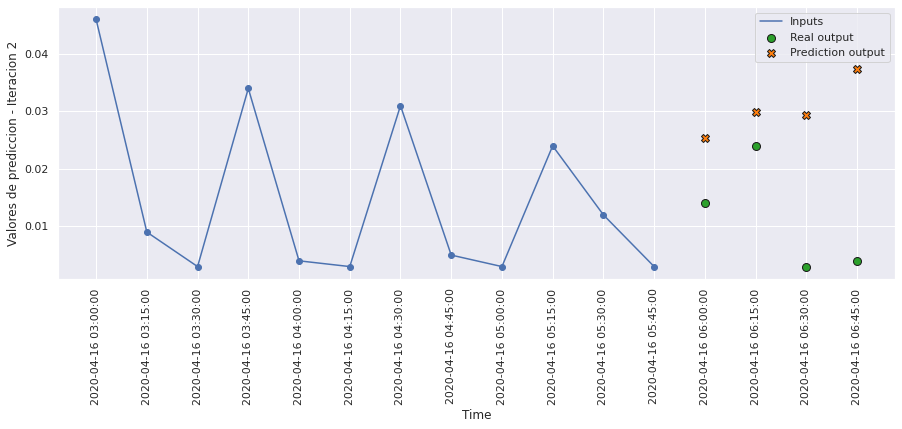

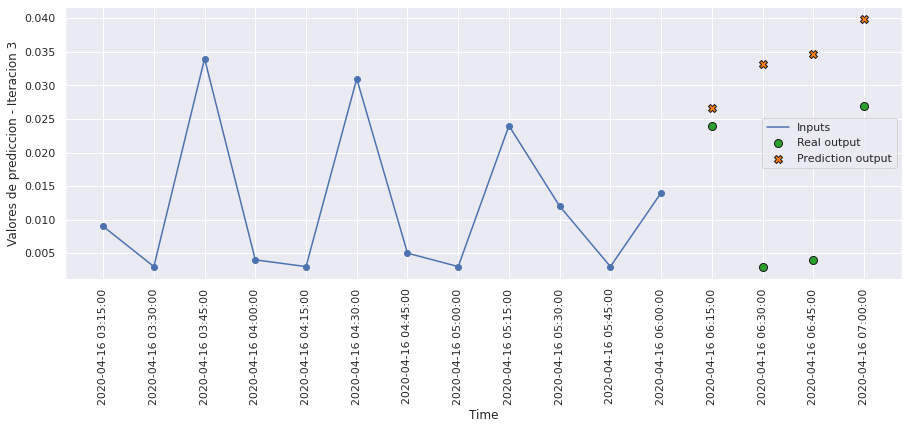

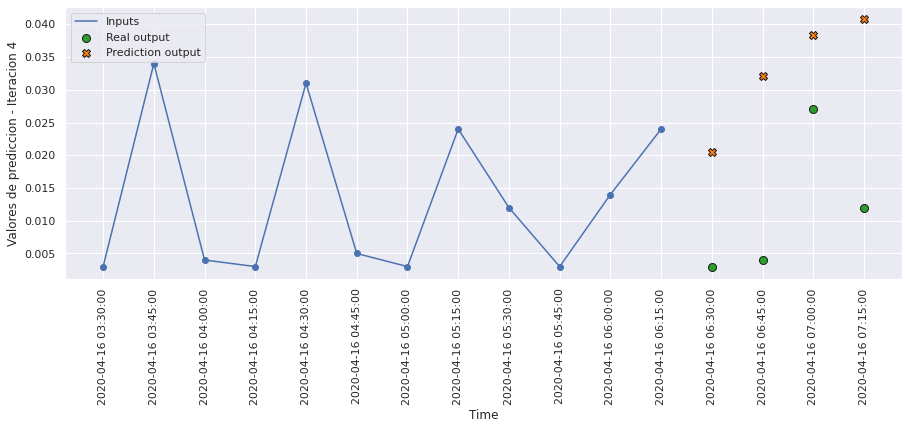

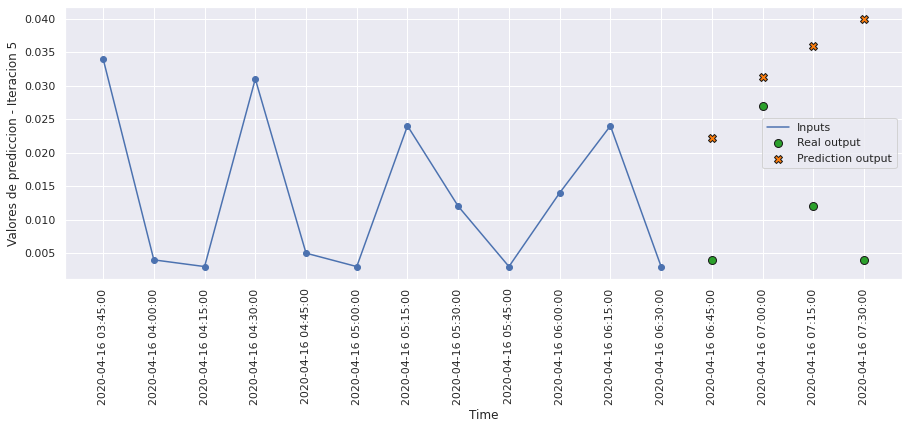

...

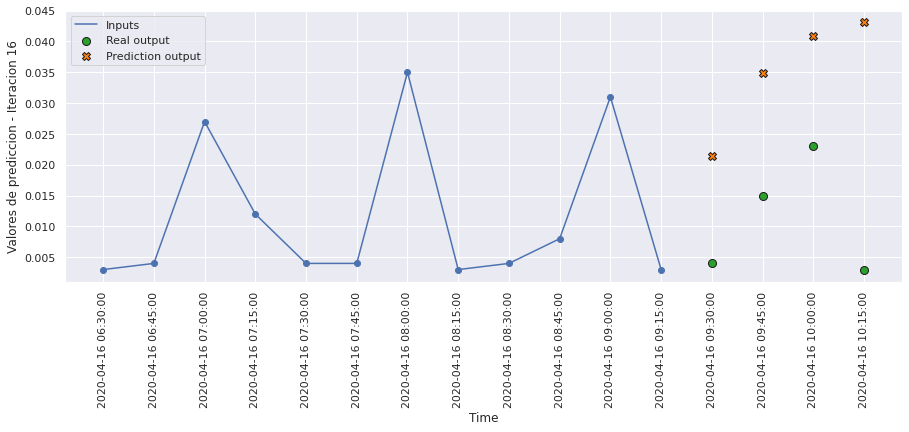

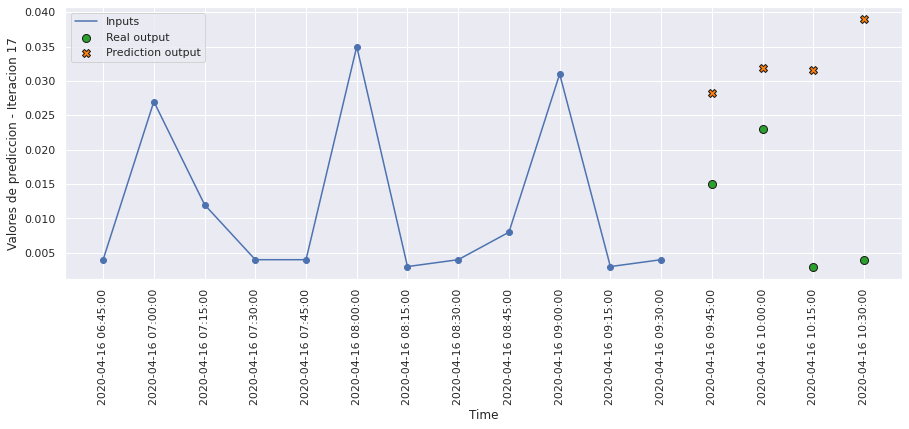

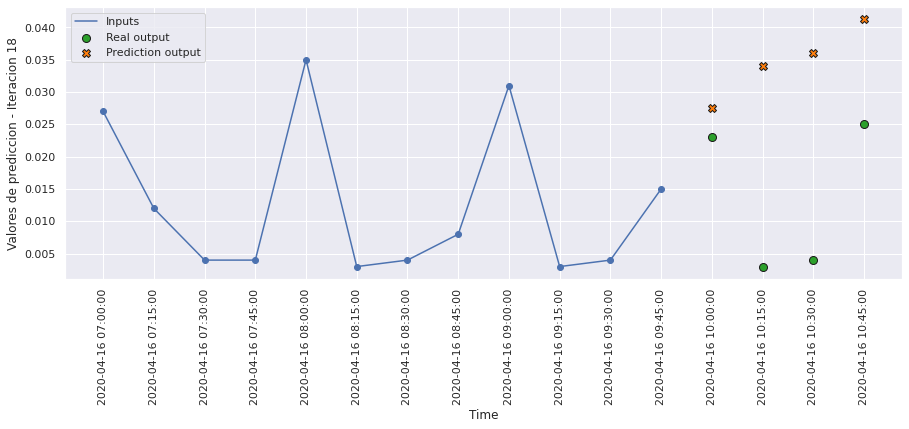

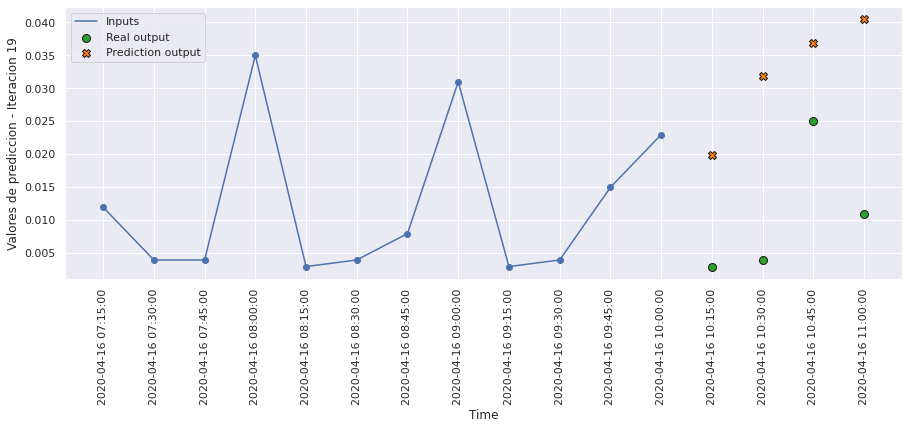

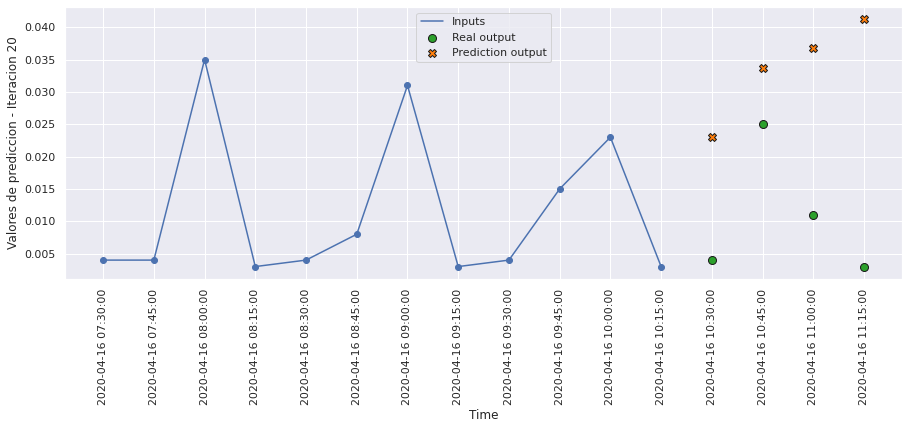

In [95]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, 
                        testPredict5.reshape(testPredict5.shape[0],n_predicciones), 20, 0)

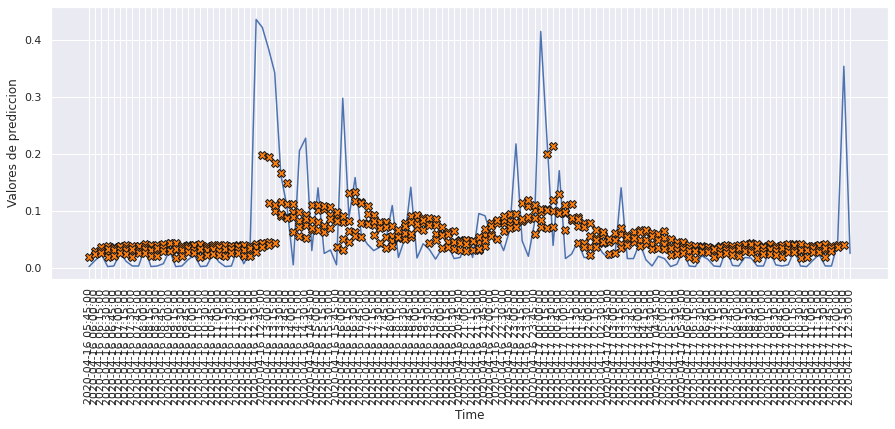

In [96]:
plot_window_predictions_values(int(test_df.iloc[0].name), 
                               testPredict5.reshape(testPredict5.shape[0],n_predicciones), 120)

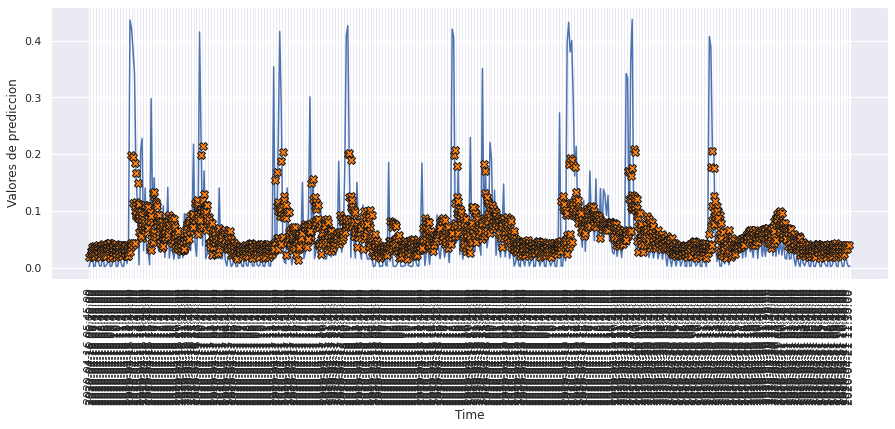

In [97]:
plot_window_predictions_values(int(test_df.iloc[0].name), 
                               testPredict5.reshape(testPredict5.shape[0],n_predicciones), 500)

# MODELO 6: CONVOLUCIONAL 1D CON LSTM 

### Construimos el modelo

In [98]:
def build_model6():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(None, n_entrada, n_features)),
        tf.keras.layers.TimeDistributed(tf.keras.layers.Conv1D(filters=64, kernel_size=1, activation='relu')), 
        tf.keras.layers.TimeDistributed(tf.keras.layers.MaxPooling1D(pool_size=2)),
        tf.keras.layers.TimeDistributed(tf.keras.layers.Flatten()),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences=True),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [99]:
model6 = build_model6()
model6.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_3 (TimeDis  (None, None, 12, 64)     128       
 tributed)                                                       
                                                                 
 time_distributed_4 (TimeDis  (None, None, 6, 64)      0         
 tributed)                                                       
                                                                 
 time_distributed_5 (TimeDis  (None, None, 384)        0         
 tributed)                                                       
                                                                 
 lstm_7 (LSTM)               (None, None, 128)         262656    
                                                                 
 dense_5 (Dense)             (None, None, 4)           516       
                                                      

### Entrenamiento del modelo

In [100]:
history6 = model6.fit(scaled_trainX_4D, data_trainY_3D, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX_4D, data_valY_3D), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 5s 10ms/step - loss: 0.0062 - mae: 0.0463 - mse: 0.0062 - smape: 0.8189 - val_loss: 0.0060 - val_mae: 0.0388 - val_mse: 0.0060 - val_smape: 0.7114
Epoch 2/200
354/354 [==============================] - 3s 10ms/step - loss: 0.0061 - mae: 0.0455 - mse: 0.0061 - smape: 0.8042 - val_loss: 0.0060 - val_mae: 0.0453 - val_mse: 0.0060 - val_smape: 0.8170
Epoch 3/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0061 - mae: 0.0454 - mse: 0.0061 - smape: 0.8024 - val_loss: 0.0059 - val_mae: 0.0382 - val_mse: 0.0059 - val_smape: 0.7069
Epoch 4/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0060 - mae: 0.0452 - mse: 0.0060 - smape: 0.7990 - val_loss: 0.0059 - val_mae: 0.0357 - val_mse: 0.0059 - val_smape: 0.6640
Epoch 5/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0060 - mae: 0.0451 - mse: 0.0060 - smape: 0.7974 - val_loss: 0.0059 - val_mae: 0.0373 - val_mse: 0.0059 - val_smape: 

354/354 [==============================] - 3s 10ms/step - loss: 0.0058 - mae: 0.0442 - mse: 0.0058 - smape: 0.7838 - val_loss: 0.0058 - val_mae: 0.0372 - val_mse: 0.0058 - val_smape: 0.6875
Epoch 82/200
354/354 [==============================] - 3s 10ms/step - loss: 0.0058 - mae: 0.0443 - mse: 0.0058 - smape: 0.7827 - val_loss: 0.0059 - val_mae: 0.0375 - val_mse: 0.0059 - val_smape: 0.6890
Epoch 83/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0058 - mae: 0.0442 - mse: 0.0058 - smape: 0.7817 - val_loss: 0.0059 - val_mae: 0.0379 - val_mse: 0.0059 - val_smape: 0.6932
Epoch 84/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0058 - mae: 0.0442 - mse: 0.0058 - smape: 0.7822 - val_loss: 0.0058 - val_mae: 0.0395 - val_mse: 0.0058 - val_smape: 0.7200
Epoch 85/200
354/354 [==============================] - 3s 10ms/step - loss: 0.0058 - mae: 0.0442 - mse: 0.0058 - smape: 0.7821 - val_loss: 0.0058 - val_mae: 0.0409 - val_mse: 0.0058 - val_smape: 0.7401


In [101]:
hist6 = pd.DataFrame(history6.history)
hist6['epoch'] = history6.epoch
hist6

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006249,0.046348,0.006249,0.818946,0.006005,0.038827,0.006005,0.711415,0
1,0.006090,0.045486,0.006090,0.804179,0.006037,0.045282,0.006037,0.817015,1
2,0.006053,0.045429,0.006053,0.802440,0.005904,0.038188,0.005904,0.706878,2
3,0.006010,0.045180,0.006010,0.798967,0.005923,0.035705,0.005923,0.663998,3
4,0.006004,0.045094,0.006004,0.797389,0.005873,0.037281,0.005873,0.696541,4
...,...,...,...,...,...,...,...,...,...
143,0.005739,0.043887,0.005739,0.778712,0.005871,0.037719,0.005871,0.688657,143
144,0.005738,0.043861,0.005738,0.777645,0.005925,0.037663,0.005925,0.689354,144
145,0.005740,0.043853,0.005740,0.778076,0.005850,0.038594,0.005850,0.701003,145
146,0.005741,0.043922,0.005741,0.778306,0.005879,0.037078,0.005879,0.679612,146


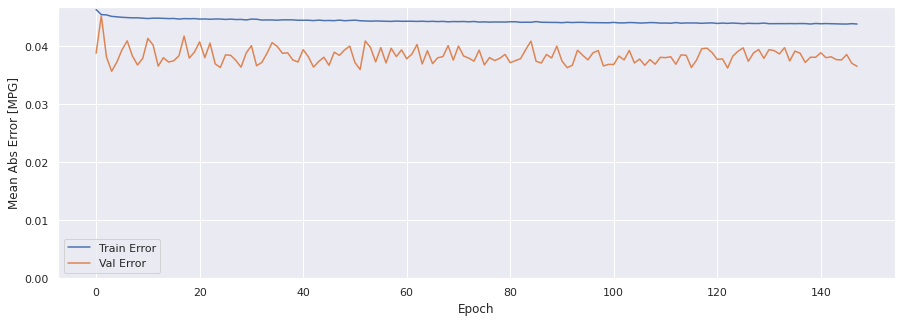

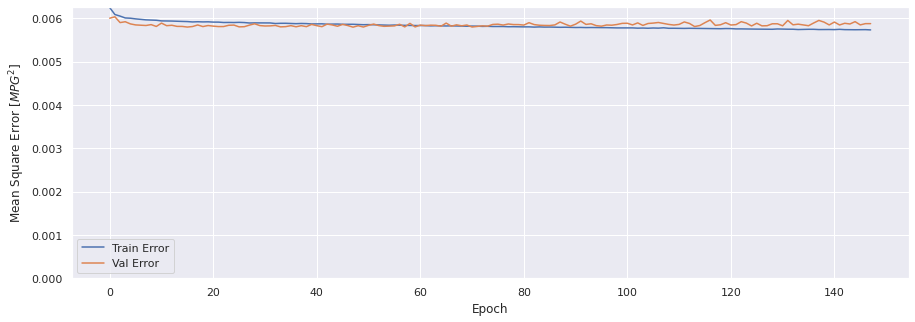

In [102]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history6)

### Evaluar predicciones

In [103]:
score_train6 = model6.evaluate(scaled_trainX_4D, data_trainY_3D, verbose=1)
print(f'Loss:{score_train6[0]}')
print(f'MAE:{score_train6[1]}')
print(f'MSE:{score_train6[2]}')
print(f'SMAPE:{score_train6[3]}')

1413/1413 [==============================] - 8s 5ms/step - loss: 0.0057 - mae: 0.0433 - mse: 0.0057 - smape: 0.7680
Loss:0.005741986911743879
MAE:0.04333586245775223
MSE:0.005741986911743879
SMAPE:0.7680113911628723


In [104]:
score_val6 = model6.evaluate(scaled_valX_4D, data_valY_3D, verbose=1)
print(f'Loss:{score_val6[0]}')
print(f'MAE:{score_val6[1]}')
print(f'MSE:{score_val6[2]}')
print(f'SMAPE:{score_val6[3]}')

303/303 [==============================] - 2s 5ms/step - loss: 0.0059 - mae: 0.0366 - mse: 0.0059 - smape: 0.6711
Loss:0.005879274103790522
MAE:0.03656826913356781
MSE:0.005879274103790522
SMAPE:0.6711324453353882


In [105]:
score_test6 = model6.evaluate(scaled_testX_4D, data_testY_3D, verbose=1)
print(f'Loss:{score_test6[0]}')
print(f'MAE:{score_test6[1]}')
print(f'MSE:{score_test6[2]}')
print(f'SMAPE:{score_test6[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0062 - mae: 0.0419 - mse: 0.0062 - smape: 0.7107
Loss:0.006206527817994356
MAE:0.041890088468790054
MSE:0.006206527817994356
SMAPE:0.7106873393058777


### Comparativa de resultados

In [106]:
result = hist6.iloc[-1]
comparativa6 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test6[1], score_test6[2], score_test6[3], math.sqrt(score_test6[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa6.style.set_caption("Método de ventana de varios pasos - Convolucional 1D con LSTM")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.043858,0.005735,0.778079,0.075728
VALIDACION,0.036568,0.005879,0.672335,0.076676
TEST,0.041890,0.006207,0.710687,0.078782


### Obtener predicciones

In [107]:
trainPredict6 = model6.predict(scaled_trainX_4D)
testPredict6 = model6.predict(scaled_testX_4D)

### Visualización de las predicciones

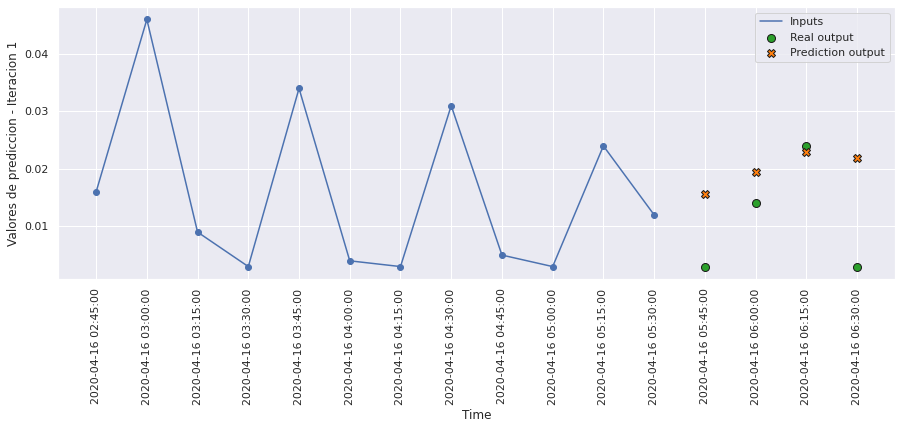

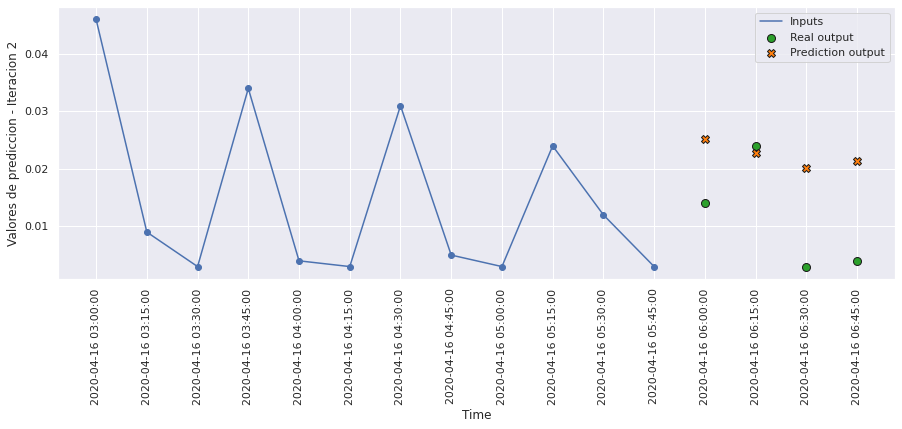

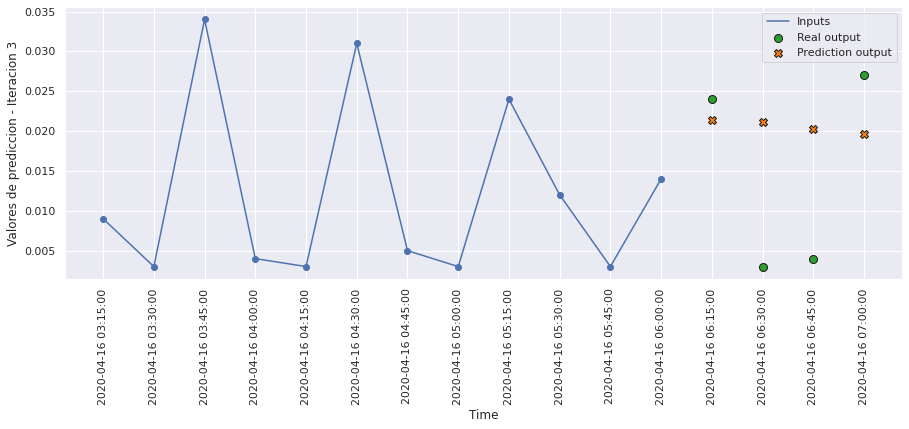

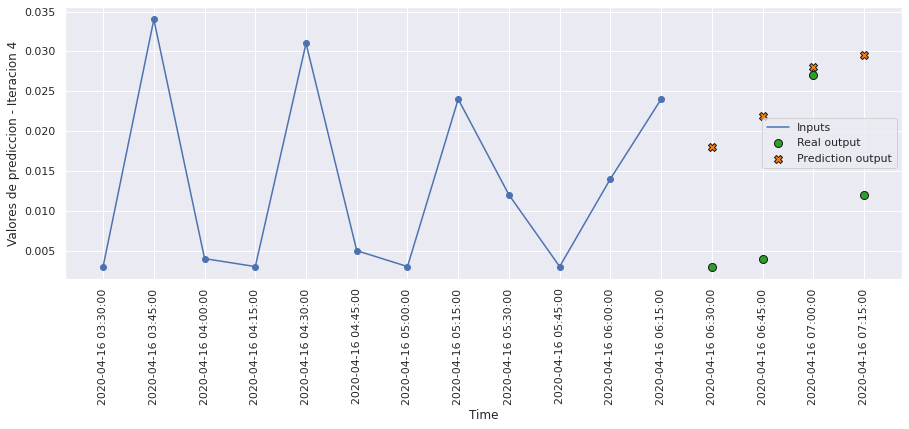

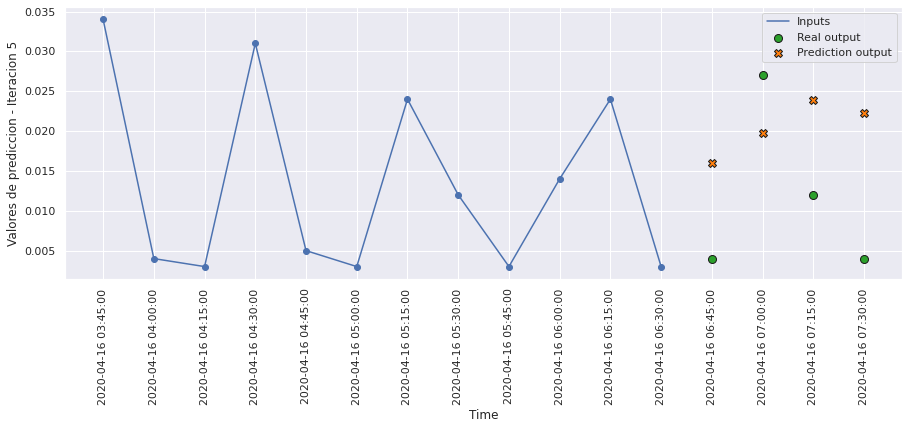

...

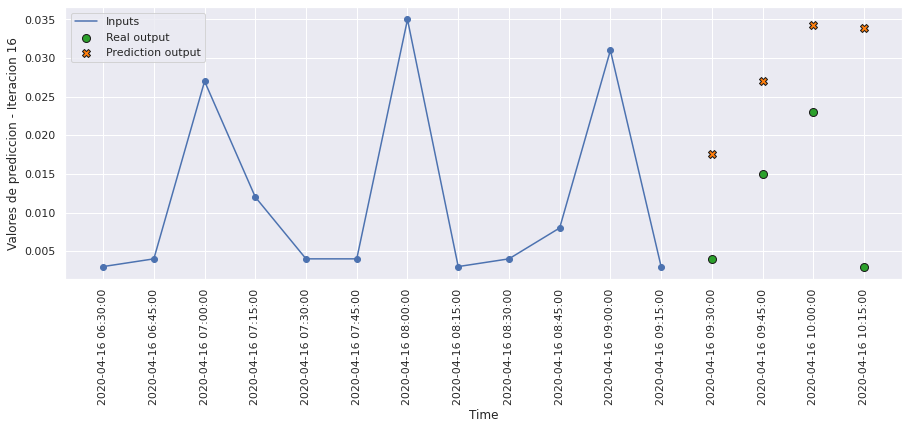

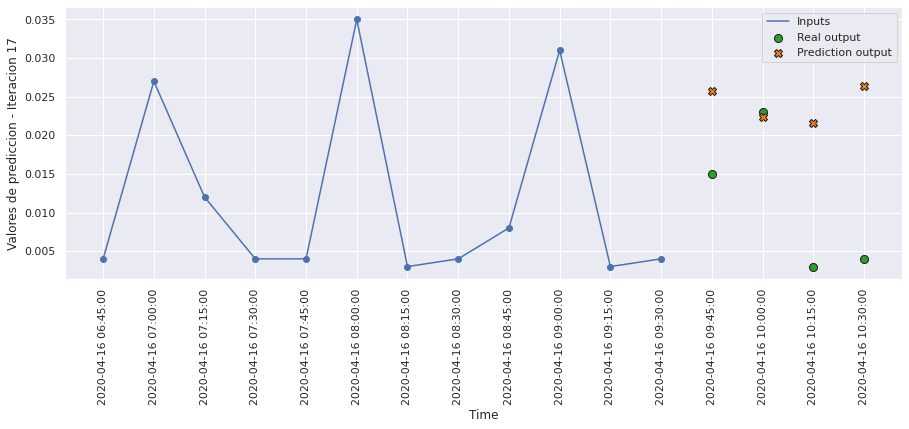

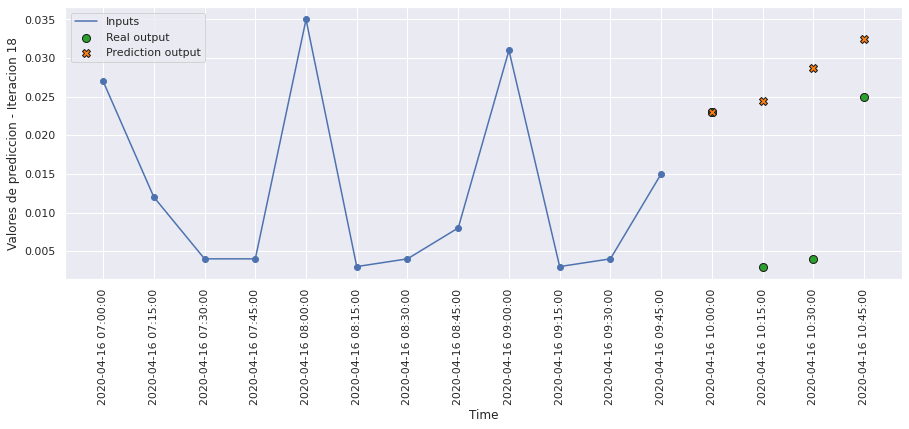

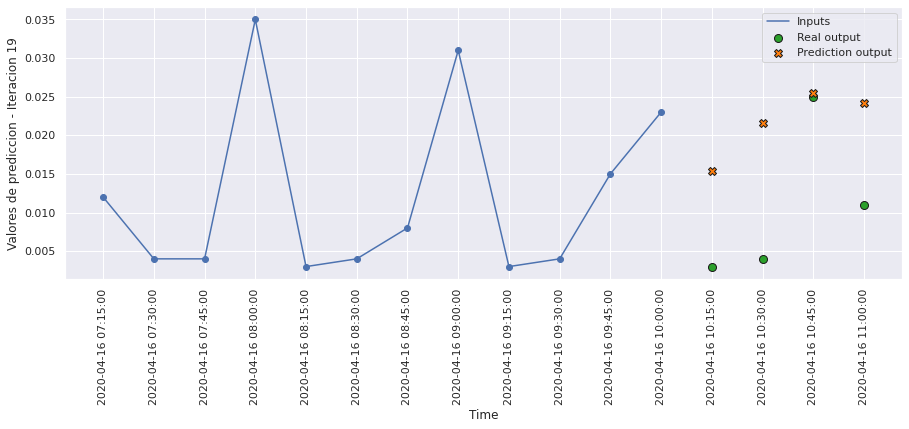

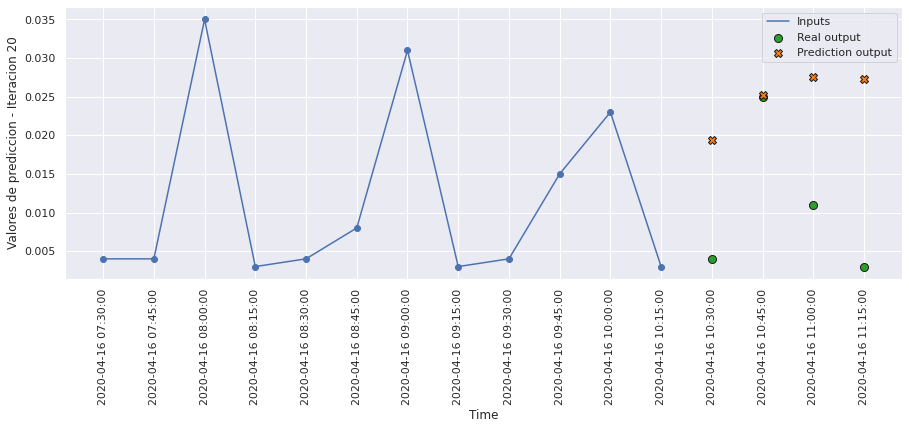

In [108]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, 
                        testPredict6.reshape(testPredict6.shape[0],n_predicciones), 20, 0)

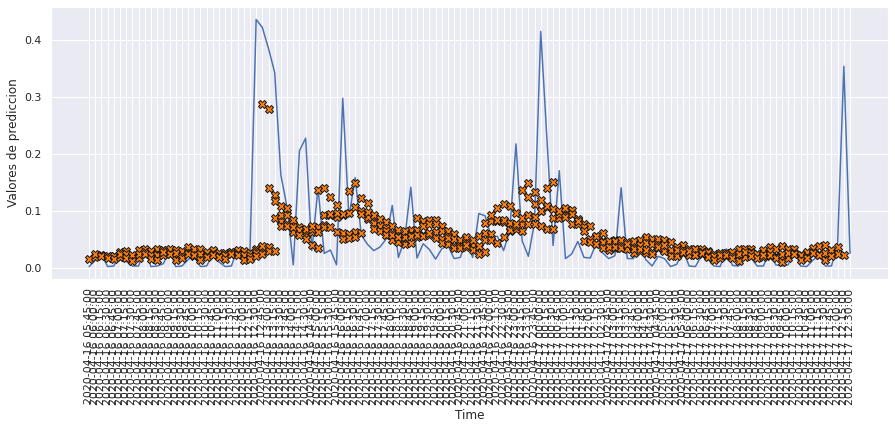

In [109]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict6.reshape(testPredict6.shape[0],n_predicciones), 120)

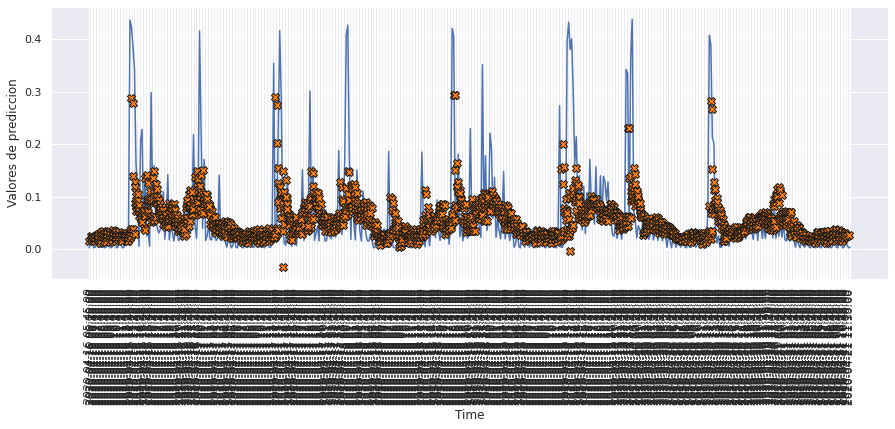

In [110]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict6.reshape(testPredict6.shape[0],n_predicciones), 500)

# MODELO 7: CONVLSTM1D

### Construimos el modelo

In [111]:
def build_model7():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(None, n_entrada, n_features)),
        tf.keras.layers.ConvLSTM1D(filters=64, kernel_size=1, activation='tanh'),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(n_predicciones),
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [112]:
model7 = build_model7()
model7.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm1d (ConvLSTM1D)    (None, 12, 64)            16896     
                                                                 
 flatten_2 (Flatten)         (None, 768)               0         
                                                                 
 dense_6 (Dense)             (None, 4)                 3076      
                                                                 
Total params: 19,972
Trainable params: 19,972
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [113]:
history7 = model7.fit(scaled_trainX_4D, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX_4D, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 9s 22ms/step - loss: 0.0062 - mae: 0.0459 - mse: 0.0062 - smape: 0.8202 - val_loss: 0.0059 - val_mae: 0.0407 - val_mse: 0.0059 - val_smape: 0.7532
Epoch 2/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0060 - mae: 0.0450 - mse: 0.0060 - smape: 0.7999 - val_loss: 0.0059 - val_mae: 0.0440 - val_mse: 0.0059 - val_smape: 0.8043
Epoch 3/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0060 - mae: 0.0450 - mse: 0.0060 - smape: 0.8003 - val_loss: 0.0059 - val_mae: 0.0425 - val_mse: 0.0059 - val_smape: 0.7811
Epoch 4/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0060 - mae: 0.0449 - mse: 0.0060 - smape: 0.7992 - val_loss: 0.0059 - val_mae: 0.0370 - val_mse: 0.0059 - val_smape: 0.6898
Epoch 5/200
354/354 [==============================] - 7s 21ms/step - loss: 0.0060 - mae: 0.0449 - mse: 0.0060 - smape: 0.7988 - val_loss: 0.0059 - val_mae: 0.0414 - val_mse: 0.0059 - val_smap

354/354 [==============================] - 7s 20ms/step - loss: 0.0058 - mae: 0.0441 - mse: 0.0058 - smape: 0.7886 - val_loss: 0.0058 - val_mae: 0.0407 - val_mse: 0.0058 - val_smape: 0.7610
Epoch 82/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0058 - mae: 0.0441 - mse: 0.0058 - smape: 0.7879 - val_loss: 0.0058 - val_mae: 0.0395 - val_mse: 0.0058 - val_smape: 0.7449
Epoch 83/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0058 - mae: 0.0440 - mse: 0.0058 - smape: 0.7875 - val_loss: 0.0058 - val_mae: 0.0430 - val_mse: 0.0058 - val_smape: 0.7987
Epoch 84/200
354/354 [==============================] - 7s 21ms/step - loss: 0.0059 - mae: 0.0441 - mse: 0.0059 - smape: 0.7891 - val_loss: 0.0058 - val_mae: 0.0408 - val_mse: 0.0058 - val_smape: 0.7661
Epoch 85/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0058 - mae: 0.0441 - mse: 0.0058 - smape: 0.7883 - val_loss: 0.0058 - val_mae: 0.0407 - val_mse: 0.0058 - val_smape: 0.764

In [114]:
hist7 = pd.DataFrame(history7.history)
hist7['epoch'] = history7.epoch
hist7

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006245,0.045929,0.006245,0.820232,0.005890,0.040708,0.005890,0.753242,0
1,0.006011,0.044991,0.006011,0.799888,0.005920,0.043953,0.005920,0.804327,1
2,0.006002,0.044991,0.006002,0.800333,0.005888,0.042479,0.005888,0.781051,2
3,0.005998,0.044914,0.005998,0.799210,0.005884,0.036979,0.005884,0.689833,3
4,0.005994,0.044882,0.005994,0.798799,0.005867,0.041394,0.005867,0.765987,4
...,...,...,...,...,...,...,...,...,...
141,0.005824,0.043935,0.005824,0.785194,0.005819,0.042956,0.005819,0.798667,141
142,0.005822,0.044005,0.005822,0.785903,0.005814,0.040689,0.005814,0.761035,142
143,0.005822,0.043991,0.005822,0.785410,0.005796,0.039132,0.005796,0.736552,143
144,0.005822,0.043949,0.005822,0.784821,0.005810,0.040898,0.005810,0.766697,144


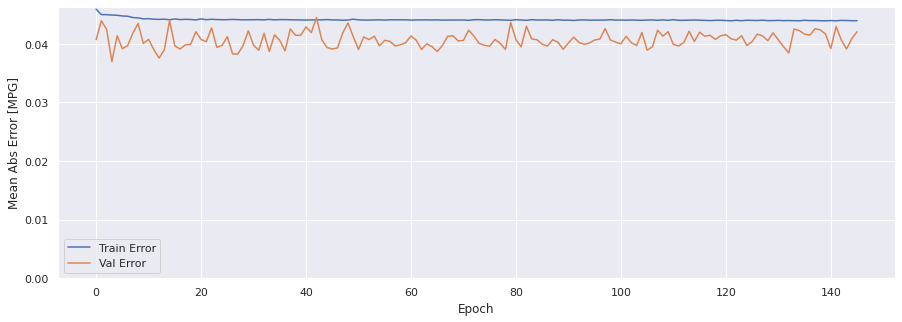

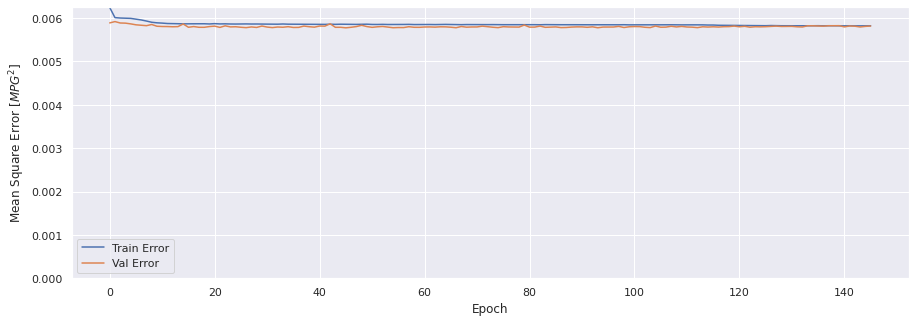

In [115]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history7)

### Evaluar predicciones

In [116]:
score_train7 = model7.evaluate(scaled_trainX_4D, data_trainY, verbose=1)
print(f'Loss:{score_train7[0]}')
print(f'MAE:{score_train7[1]}')
print(f'MSE:{score_train7[2]}')
print(f'SMAPE:{score_train7[3]}')

1413/1413 [==============================] - 8s 6ms/step - loss: 0.0058 - mae: 0.0449 - mse: 0.0058 - smape: 0.7987
Loss:0.005818558856844902
MAE:0.04486658051609993
MSE:0.005818558856844902
SMAPE:0.798690915107727


In [117]:
score_val7 = model7.evaluate(scaled_valX_4D, data_valY, verbose=1)
print(f'Loss:{score_val7[0]}')
print(f'MAE:{score_val7[1]}')
print(f'MSE:{score_val7[2]}')
print(f'SMAPE:{score_val7[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0058 - mae: 0.0421 - mse: 0.0058 - smape: 0.7820
Loss:0.005817493423819542
MAE:0.042067304253578186
MSE:0.005817493423819542
SMAPE:0.7819586396217346


In [118]:
score_test7 = model7.evaluate(scaled_testX_4D, data_testY, verbose=1)
print(f'Loss:{score_test7[0]}')
print(f'MAE:{score_test7[1]}')
print(f'MSE:{score_test7[2]}')
print(f'SMAPE:{score_test7[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0060 - mae: 0.0458 - mse: 0.0060 - smape: 0.8036
Loss:0.005979890003800392
MAE:0.04580710083246231
MSE:0.005979890003800392
SMAPE:0.8036104440689087


### Comparativa de resultados

In [119]:
result = hist7.iloc[-1]
comparativa7 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test7[1], score_test7[2], score_test7[3], math.sqrt(score_test7[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa7.style.set_caption("Método de ventana de varios pasos - CONVLSTM 1D")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.043958,0.005824,0.785461,0.076312
VALIDACION,0.042067,0.005817,0.783034,0.076272
TEST,0.045807,0.005980,0.803610,0.077330


### Obtener predicciones

In [120]:
trainPredict7 = model7.predict(scaled_trainX_4D)
testPredict7 = model7.predict(scaled_testX_4D)

### Visualización de las predicciones

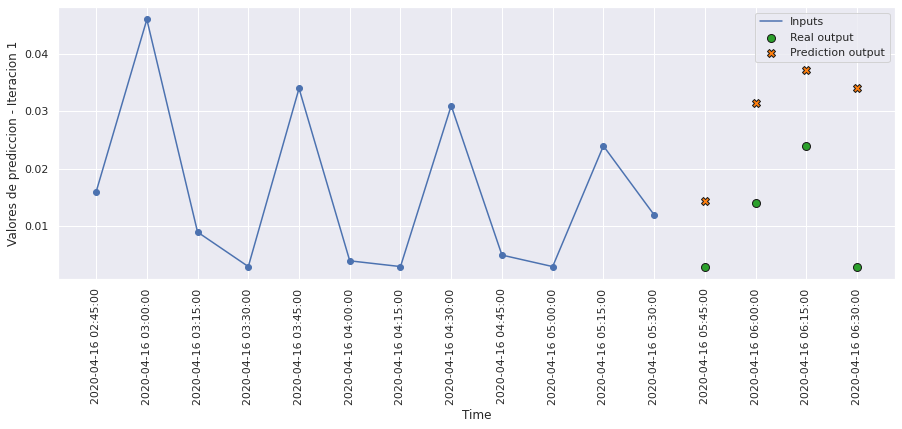

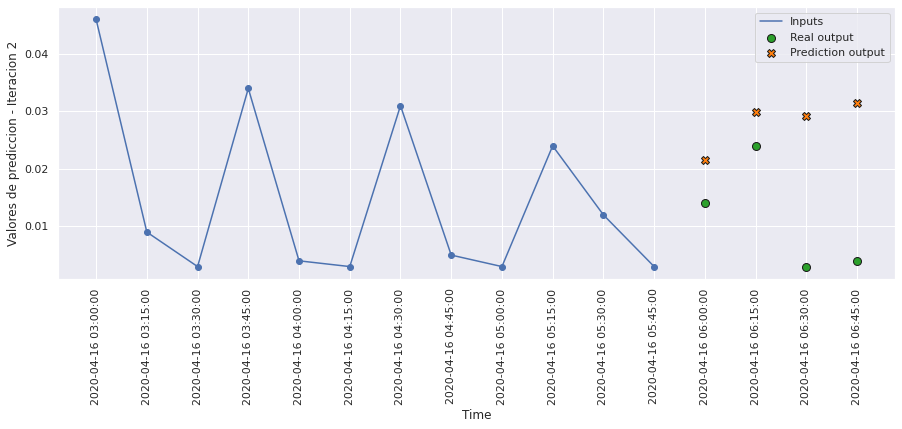

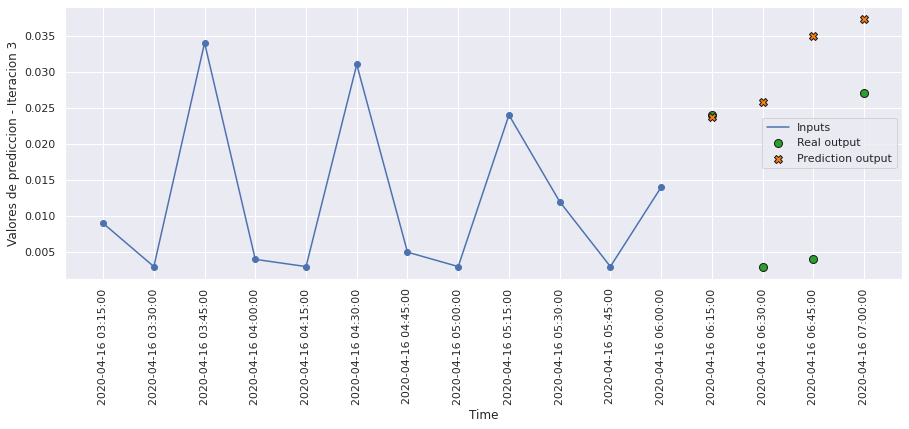

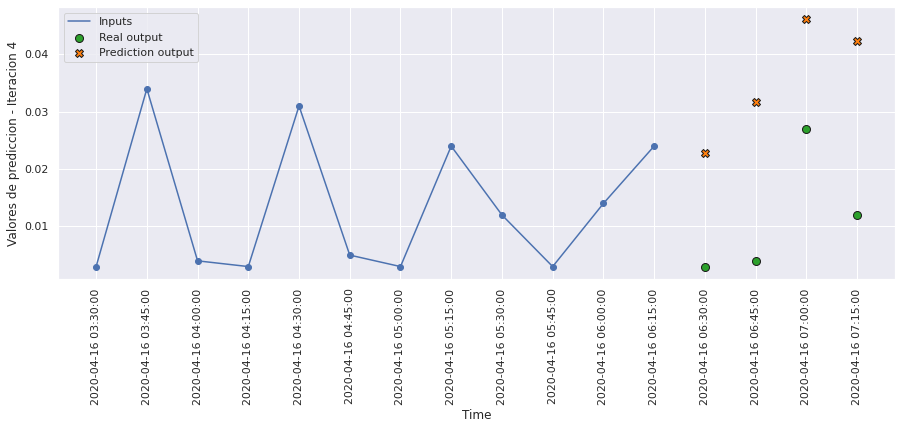

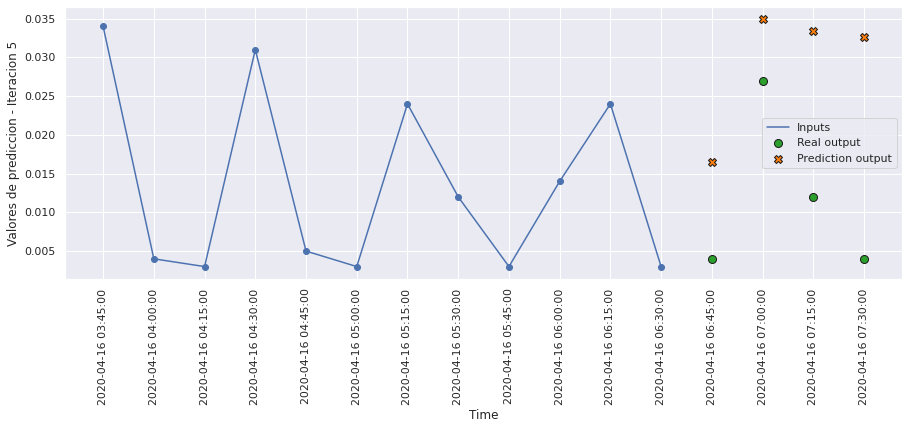

...

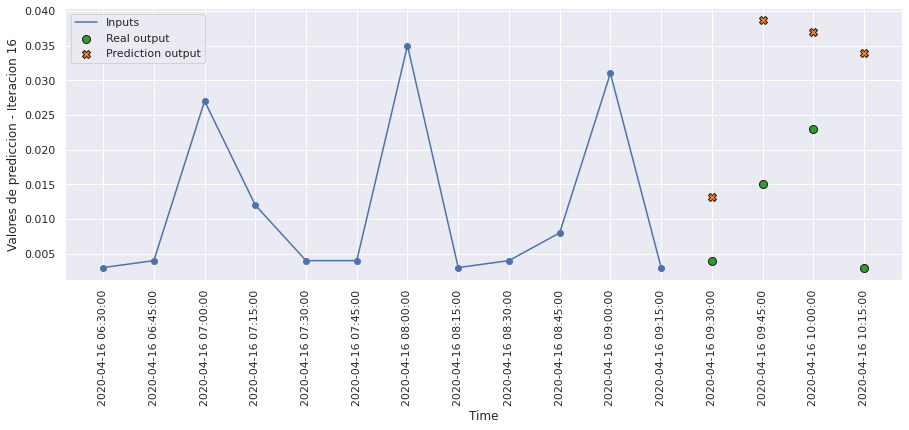

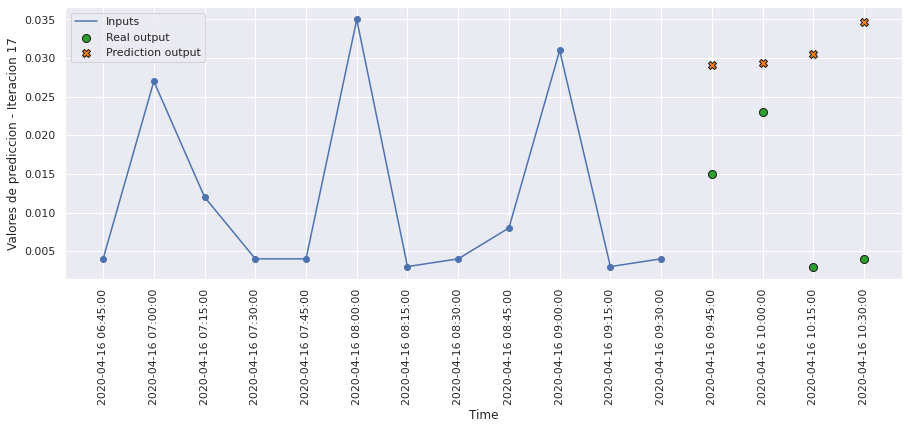

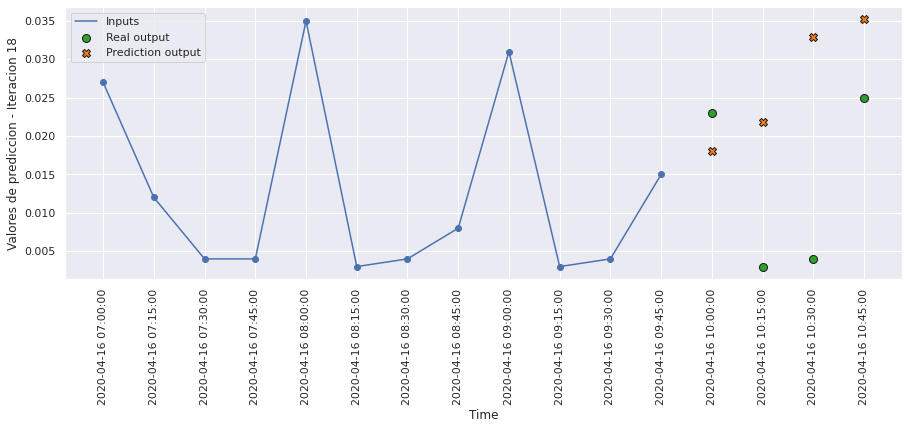

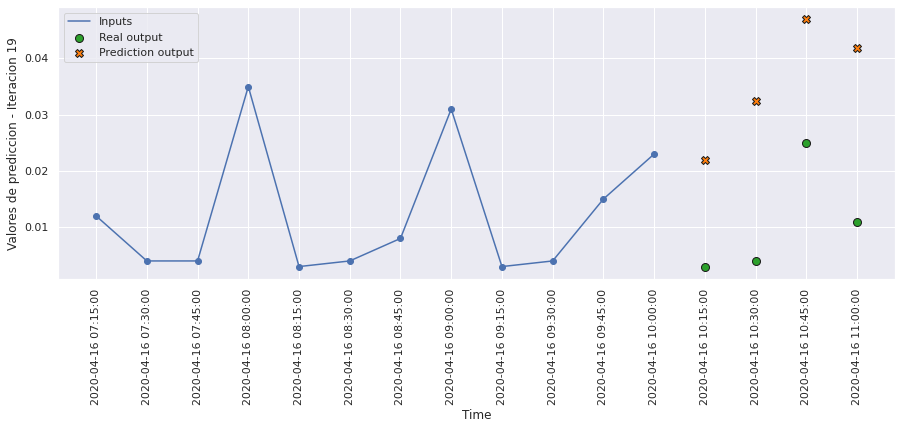

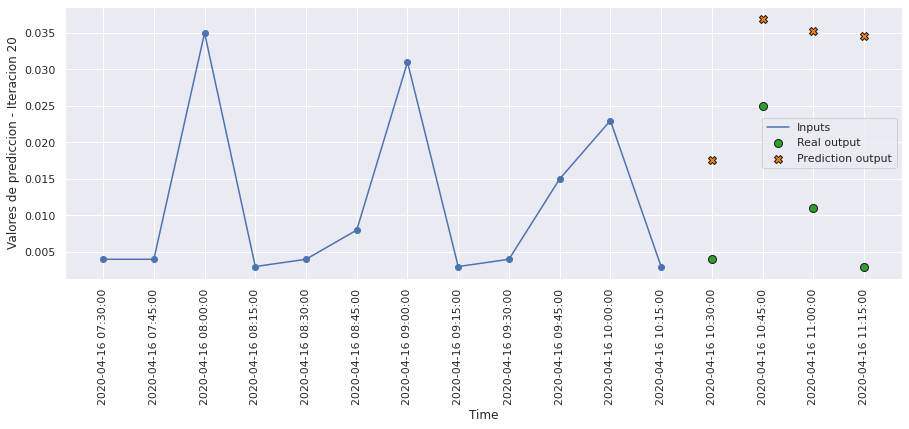

In [121]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict7, 20, 0)

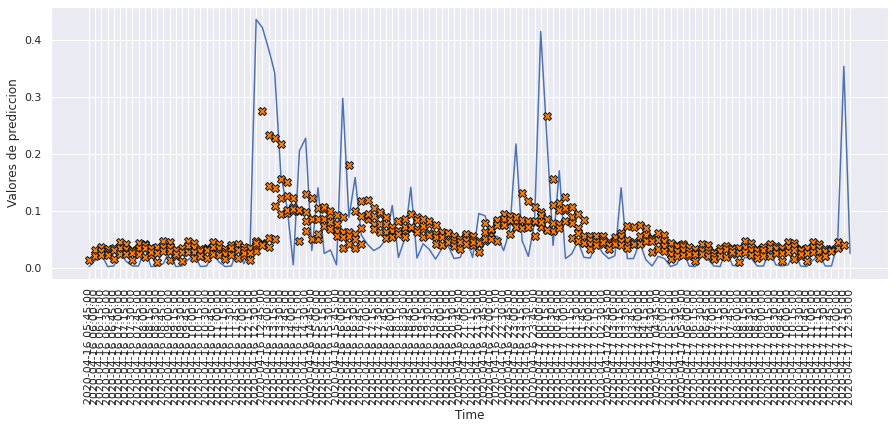

In [122]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict7, 120)

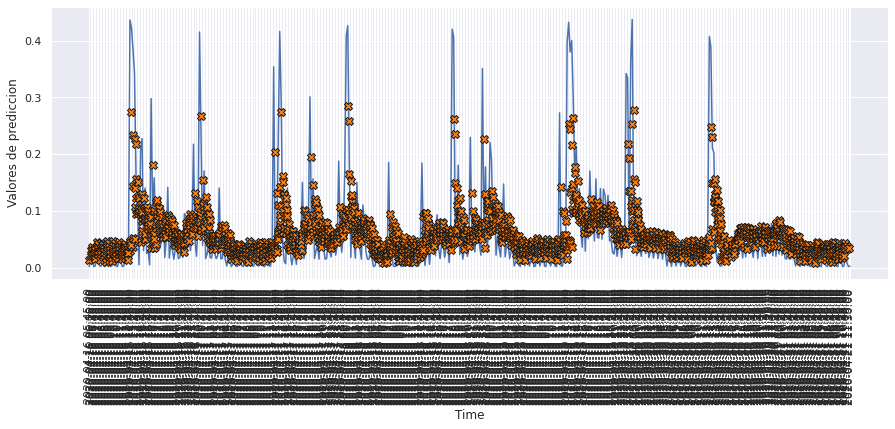

In [123]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict7, 500)

# MODELO 8: CONVLSTM2D

### Construimos el modelo

In [124]:
def build_model8():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(1, 1, n_entrada, n_features)),
        tf.keras.layers.ConvLSTM2D(filters=64, kernel_size=(1,1), activation='relu'),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(n_predicciones),
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [125]:
model8 = build_model8()
model8.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d (ConvLSTM2D)    (None, 1, 12, 64)         16896     
                                                                 
 flatten_3 (Flatten)         (None, 768)               0         
                                                                 
 dense_7 (Dense)             (None, 4)                 3076      
                                                                 
Total params: 19,972
Trainable params: 19,972
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [126]:
history8 = model8.fit(scaled_trainX_5D, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX_5D, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 9s 20ms/step - loss: 0.0063 - mae: 0.0463 - mse: 0.0063 - smape: 0.8303 - val_loss: 0.0059 - val_mae: 0.0428 - val_mse: 0.0059 - val_smape: 0.7885
Epoch 2/200
354/354 [==============================] - 7s 19ms/step - loss: 0.0060 - mae: 0.0449 - mse: 0.0060 - smape: 0.7995 - val_loss: 0.0059 - val_mae: 0.0424 - val_mse: 0.0059 - val_smape: 0.7846
Epoch 3/200
354/354 [==============================] - 7s 19ms/step - loss: 0.0059 - mae: 0.0446 - mse: 0.0059 - smape: 0.7963 - val_loss: 0.0058 - val_mae: 0.0377 - val_mse: 0.0058 - val_smape: 0.7089
Epoch 4/200
354/354 [==============================] - 7s 19ms/step - loss: 0.0059 - mae: 0.0445 - mse: 0.0059 - smape: 0.7954 - val_loss: 0.0058 - val_mae: 0.0400 - val_mse: 0.0058 - val_smape: 0.7497
Epoch 5/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0059 - mae: 0.0444 - mse: 0.0059 - smape: 0.7936 - val_loss: 0.0058 - val_mae: 0.0405 - val_mse: 0.0058 - val_smap

354/354 [==============================] - 7s 20ms/step - loss: 0.0058 - mae: 0.0439 - mse: 0.0058 - smape: 0.7849 - val_loss: 0.0058 - val_mae: 0.0396 - val_mse: 0.0058 - val_smape: 0.7423
Epoch 82/200
354/354 [==============================] - 7s 19ms/step - loss: 0.0058 - mae: 0.0440 - mse: 0.0058 - smape: 0.7852 - val_loss: 0.0058 - val_mae: 0.0422 - val_mse: 0.0058 - val_smape: 0.7813
Epoch 83/200
354/354 [==============================] - 7s 19ms/step - loss: 0.0058 - mae: 0.0439 - mse: 0.0058 - smape: 0.7850 - val_loss: 0.0058 - val_mae: 0.0415 - val_mse: 0.0058 - val_smape: 0.7715
Epoch 84/200
354/354 [==============================] - 7s 19ms/step - loss: 0.0058 - mae: 0.0439 - mse: 0.0058 - smape: 0.7850 - val_loss: 0.0058 - val_mae: 0.0383 - val_mse: 0.0058 - val_smape: 0.7212
Epoch 85/200
354/354 [==============================] - 7s 19ms/step - loss: 0.0058 - mae: 0.0440 - mse: 0.0058 - smape: 0.7856 - val_loss: 0.0058 - val_mae: 0.0374 - val_mse: 0.0058 - val_smape: 0.701

354/354 [==============================] - 7s 20ms/step - loss: 0.0058 - mae: 0.0440 - mse: 0.0058 - smape: 0.7853 - val_loss: 0.0058 - val_mae: 0.0370 - val_mse: 0.0058 - val_smape: 0.6944
Epoch 162/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0058 - mae: 0.0438 - mse: 0.0058 - smape: 0.7834 - val_loss: 0.0058 - val_mae: 0.0399 - val_mse: 0.0058 - val_smape: 0.7477
Epoch 163/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0058 - mae: 0.0439 - mse: 0.0058 - smape: 0.7838 - val_loss: 0.0058 - val_mae: 0.0409 - val_mse: 0.0058 - val_smape: 0.7635
Epoch 164/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0058 - mae: 0.0439 - mse: 0.0058 - smape: 0.7848 - val_loss: 0.0058 - val_mae: 0.0380 - val_mse: 0.0058 - val_smape: 0.7146
Epoch 165/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0058 - mae: 0.0439 - mse: 0.0058 - smape: 0.7844 - val_loss: 0.0058 - val_mae: 0.0377 - val_mse: 0.0058 - val_smape: 0

In [127]:
hist8 = pd.DataFrame(history8.history)
hist8['epoch'] = history8.epoch
hist8

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006335,0.046288,0.006335,0.830288,0.005929,0.042839,0.005929,0.788483,0
1,0.005993,0.044875,0.005993,0.799472,0.005872,0.042410,0.005872,0.784647,1
2,0.005948,0.044607,0.005948,0.796316,0.005826,0.037727,0.005826,0.708939,2
3,0.005914,0.044482,0.005914,0.795412,0.005810,0.039987,0.005810,0.749719,3
4,0.005891,0.044371,0.005891,0.793592,0.005809,0.040456,0.005809,0.758521,4
...,...,...,...,...,...,...,...,...,...
195,0.005789,0.043854,0.005789,0.783328,0.005864,0.036417,0.005864,0.683833,195
196,0.005791,0.043891,0.005791,0.784122,0.005797,0.039309,0.005797,0.736392,196
197,0.005791,0.043902,0.005791,0.784336,0.005790,0.040133,0.005790,0.746258,197
198,0.005790,0.043847,0.005790,0.783499,0.005797,0.040266,0.005797,0.749368,198


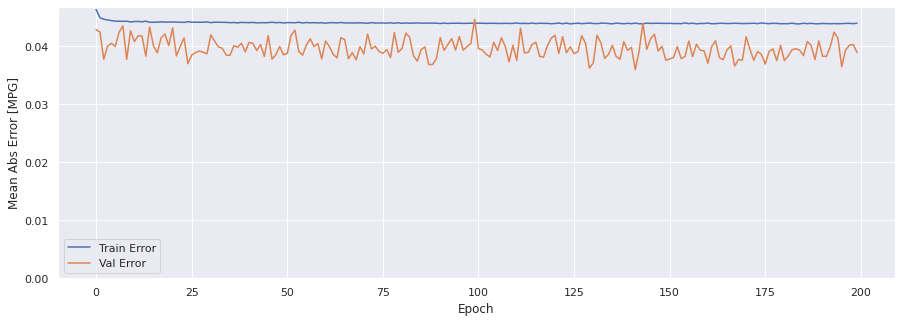

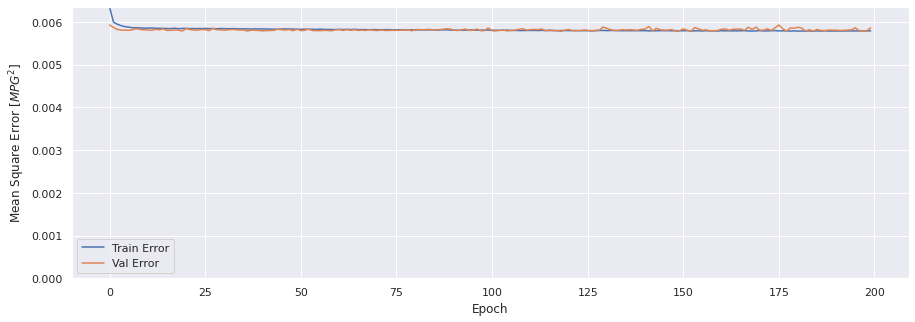

In [128]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history8)

### Evaluar predicciones

In [129]:
score_train8 = model8.evaluate(scaled_trainX_5D, data_trainY, verbose=1)
print(f'Loss:{score_train8[0]}')
print(f'MAE:{score_train8[1]}')
print(f'MSE:{score_train8[2]}')
print(f'SMAPE:{score_train8[3]}')

1413/1413 [==============================] - 8s 6ms/step - loss: 0.0058 - mae: 0.0433 - mse: 0.0058 - smape: 0.7790
Loss:0.005785289686173201
MAE:0.04330484941601753
MSE:0.005785289686173201
SMAPE:0.7790460586547852


In [130]:
score_val8 = model8.evaluate(scaled_valX_5D, data_valY, verbose=1)
print(f'Loss:{score_val8[0]}')
print(f'MAE:{score_val8[1]}')
print(f'MSE:{score_val8[2]}')
print(f'SMAPE:{score_val8[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0059 - mae: 0.0389 - mse: 0.0059 - smape: 0.7293
Loss:0.005860471166670322
MAE:0.03887316584587097
MSE:0.005860471166670322
SMAPE:0.729253888130188


In [131]:
score_test8 = model8.evaluate(scaled_testX_5D, data_testY, verbose=1)
print(f'Loss:{score_test8[0]}')
print(f'MAE:{score_test8[1]}')
print(f'MSE:{score_test8[2]}')
print(f'SMAPE:{score_test8[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0060 - mae: 0.0427 - mse: 0.0060 - smape: 0.7545
Loss:0.00599011080339551
MAE:0.04269680008292198
MSE:0.00599011080339551
SMAPE:0.7545007467269897


### Comparativa de resultados

In [132]:
result = hist8.iloc[-1]
comparativa8 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test8[1], score_test8[2], score_test8[3], math.sqrt(score_test8[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa8.style.set_caption("Método de ventana de varios pasos - CONVLSTM 2D")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.043934,0.005793,0.785064,0.076110
VALIDACION,0.038873,0.005860,0.730433,0.076554
TEST,0.042697,0.005990,0.754501,0.077396


### Obtener predicciones

In [133]:
trainPredict8 = model8.predict(scaled_trainX_5D)
testPredict8 = model8.predict(scaled_testX_5D)

### Visualización de las predicciones

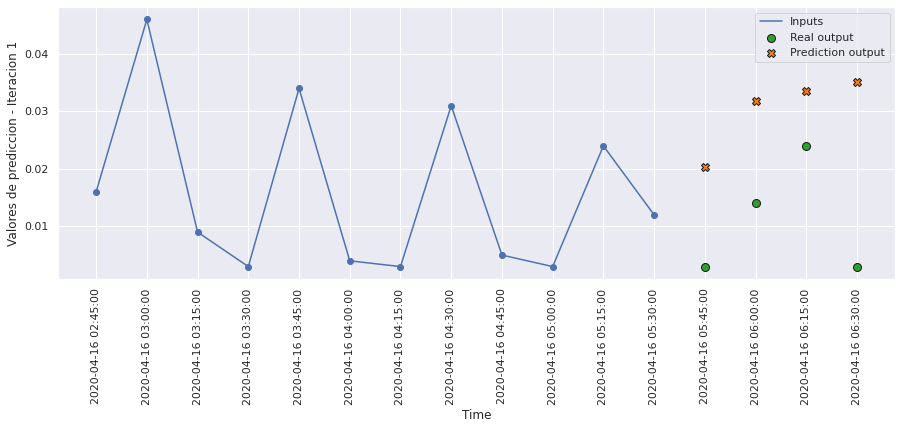

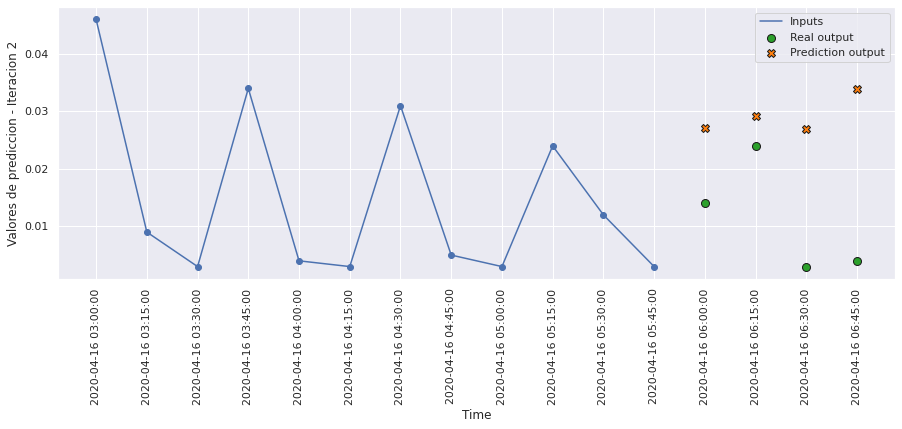

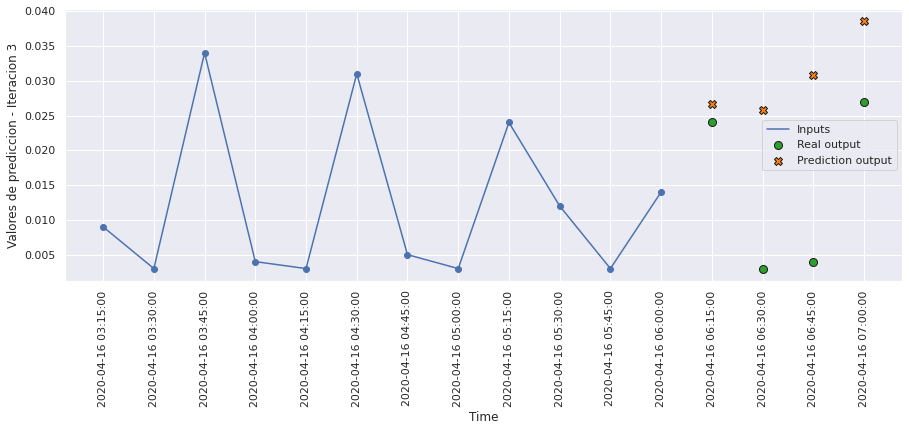

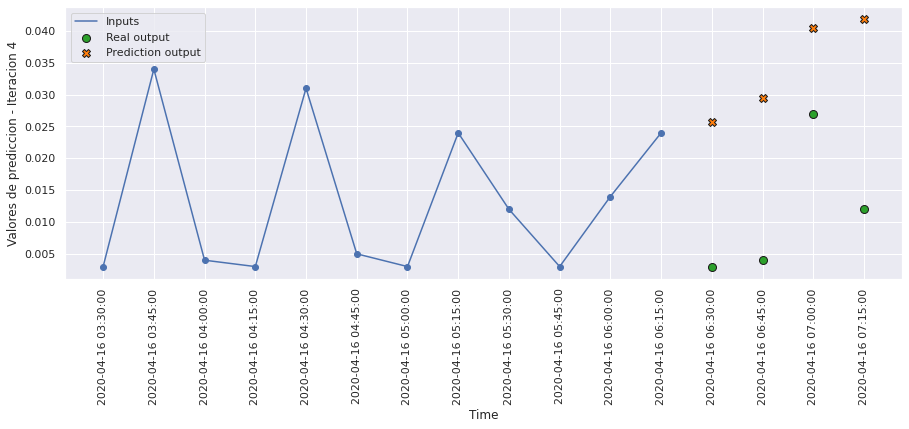

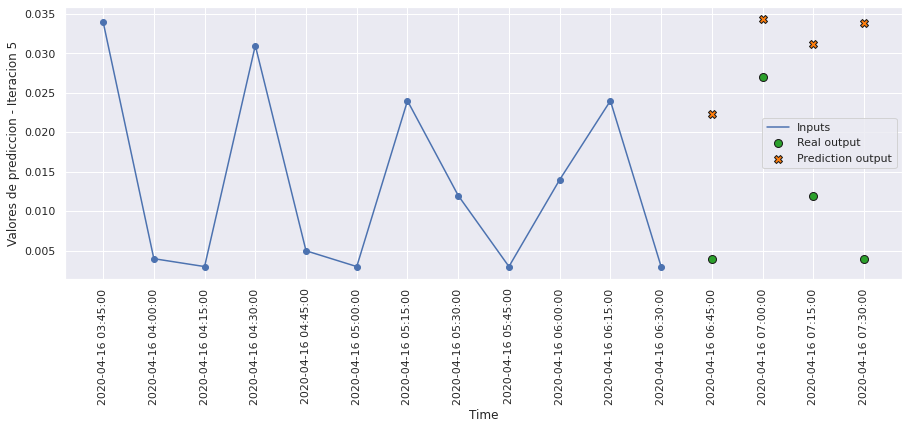

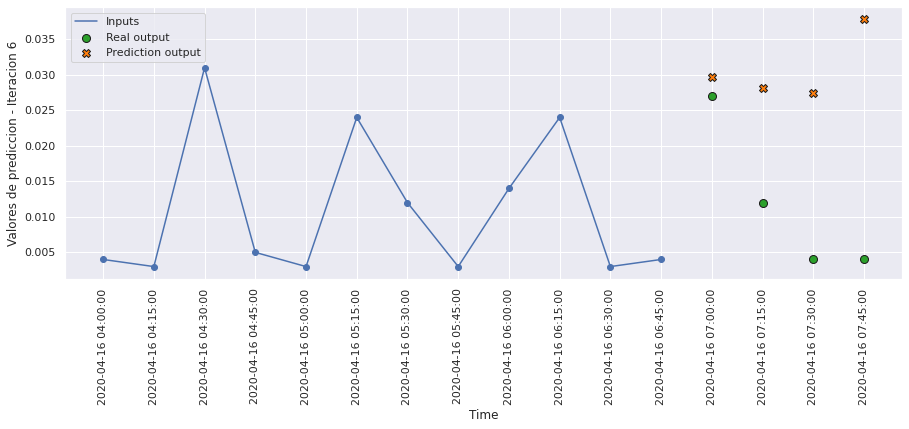

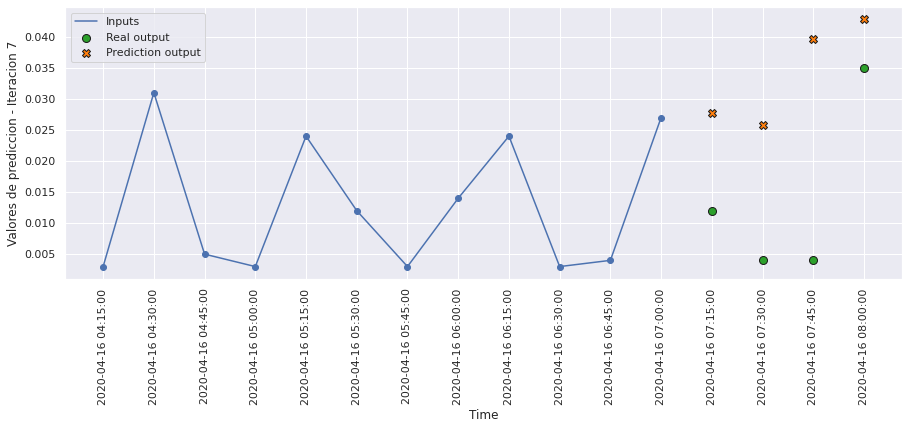

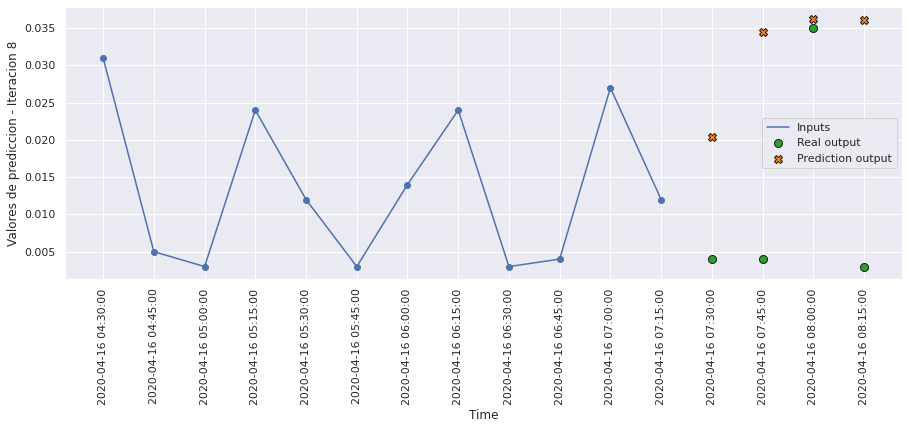

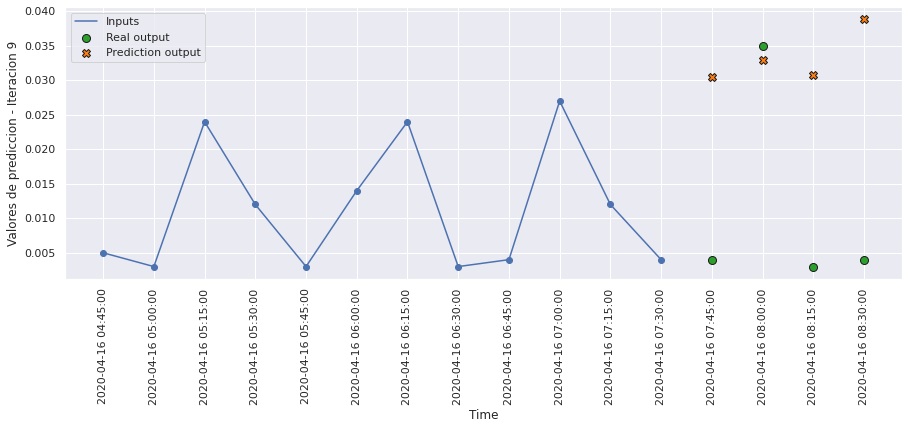

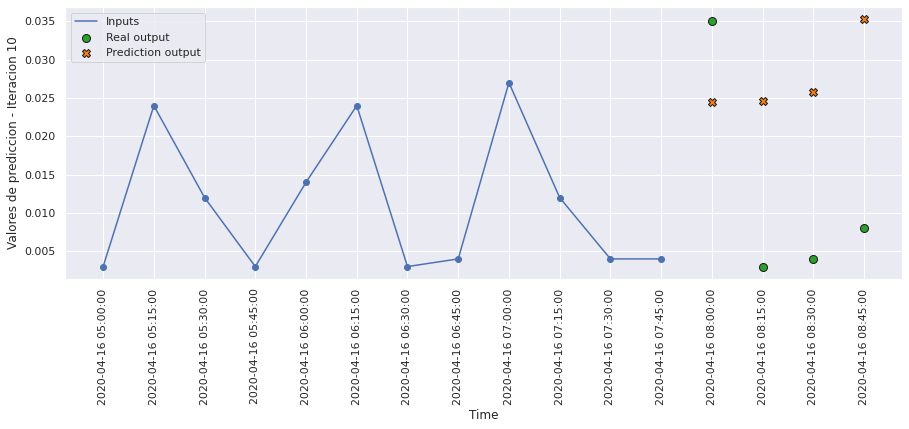

In [134]:
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict8, 10, 0)

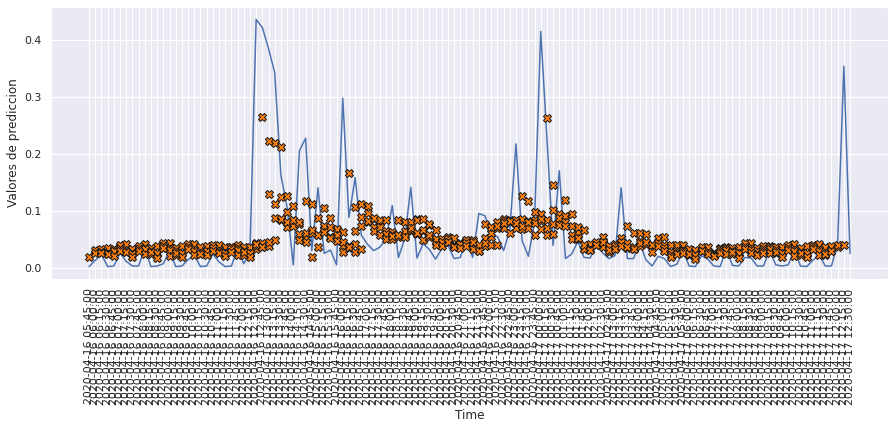

In [135]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict8, 120)

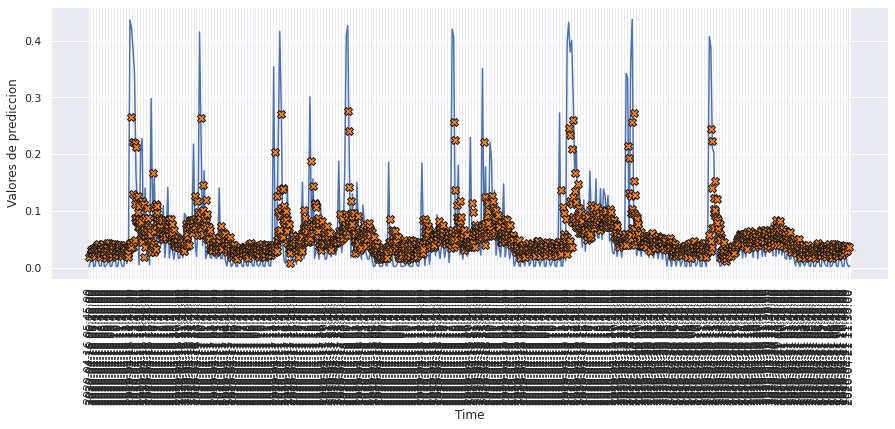

In [136]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict8, 500)

# MODELO 9: LSTM ENCODE DECODE

### Construimos el modelo

In [137]:
def build_model9():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh'),
        tf.keras.layers.RepeatVector(n_predicciones),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences=True),
        tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(100)),
        tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(1))
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [138]:
model9 = build_model9()
model9.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_8 (LSTM)               (None, 128)               66560     
                                                                 
 repeat_vector (RepeatVector  (None, 4, 128)           0         
 )                                                               
                                                                 
 lstm_9 (LSTM)               (None, 4, 128)            131584    
                                                                 
 time_distributed_6 (TimeDis  (None, 4, 100)           12900     
 tributed)                                                       
                                                                 
 time_distributed_7 (TimeDis  (None, 4, 1)             101       
 tributed)                                                       
                                                      

### Entrenamiento del modelo

In [139]:
history9 = model9.fit(scaled_trainX, data_trainY_3D_2, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY_3D_2), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 7s 14ms/step - loss: 0.0062 - mae: 0.0460 - mse: 0.0062 - smape: 0.8128 - val_loss: 0.0059 - val_mae: 0.0352 - val_mse: 0.0059 - val_smape: 0.6499
Epoch 2/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0060 - mae: 0.0451 - mse: 0.0060 - smape: 0.8010 - val_loss: 0.0059 - val_mae: 0.0446 - val_mse: 0.0059 - val_smape: 0.8137
Epoch 3/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0060 - mae: 0.0450 - mse: 0.0060 - smape: 0.7992 - val_loss: 0.0058 - val_mae: 0.0442 - val_mse: 0.0058 - val_smape: 0.8160
Epoch 4/200
354/354 [==============================] - 4s 13ms/step - loss: 0.0059 - mae: 0.0447 - mse: 0.0059 - smape: 0.7951 - val_loss: 0.0058 - val_mae: 0.0380 - val_mse: 0.0058 - val_smape: 0.7104
Epoch 5/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0059 - mae: 0.0445 - mse: 0.0059 - smape: 0.7938 - val_loss: 0.0058 - val_mae: 0.0445 - val_mse: 0.0058 - val_smap

354/354 [==============================] - 4s 12ms/step - loss: 0.0049 - mae: 0.0401 - mse: 0.0049 - smape: 0.7428 - val_loss: 0.0060 - val_mae: 0.0432 - val_mse: 0.0060 - val_smape: 0.7808
Epoch 82/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0049 - mae: 0.0399 - mse: 0.0049 - smape: 0.7411 - val_loss: 0.0061 - val_mae: 0.0430 - val_mse: 0.0061 - val_smape: 0.7804
Epoch 83/200
354/354 [==============================] - 4s 13ms/step - loss: 0.0048 - mae: 0.0397 - mse: 0.0048 - smape: 0.7402 - val_loss: 0.0061 - val_mae: 0.0404 - val_mse: 0.0061 - val_smape: 0.7321
Epoch 84/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0048 - mae: 0.0395 - mse: 0.0048 - smape: 0.7377 - val_loss: 0.0061 - val_mae: 0.0387 - val_mse: 0.0061 - val_smape: 0.7068
Epoch 85/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0047 - mae: 0.0394 - mse: 0.0047 - smape: 0.7375 - val_loss: 0.0062 - val_mae: 0.0392 - val_mse: 0.0062 - val_smape: 0.719

In [140]:
hist9 = pd.DataFrame(history9.history)
hist9['epoch'] = history9.epoch
hist9

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006184,0.045959,0.006184,0.812835,0.005911,0.035173,0.005911,0.649925,0
1,0.006014,0.045085,0.006014,0.800983,0.005917,0.044623,0.005917,0.813688,1
2,0.005972,0.044955,0.005972,0.799174,0.005828,0.044219,0.005828,0.816037,2
3,0.005925,0.044699,0.005925,0.795063,0.005753,0.037995,0.005753,0.710443,3
4,0.005894,0.044546,0.005894,0.793774,0.005829,0.044520,0.005829,0.824184,4
...,...,...,...,...,...,...,...,...,...
124,0.002984,0.031744,0.002984,0.697341,0.007057,0.043252,0.007057,0.820551,124
125,0.002955,0.031572,0.002955,0.697689,0.007054,0.044524,0.007054,0.789244,125
126,0.002899,0.031376,0.002899,0.696495,0.007197,0.042949,0.007197,0.850275,126
127,0.002896,0.031211,0.002896,0.694528,0.007202,0.044936,0.007202,0.816121,127


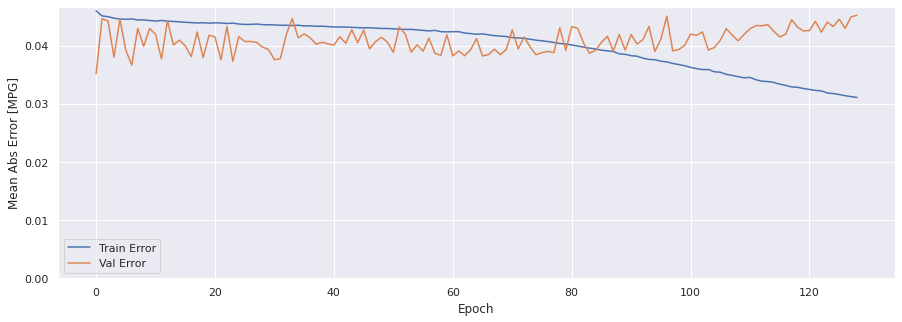

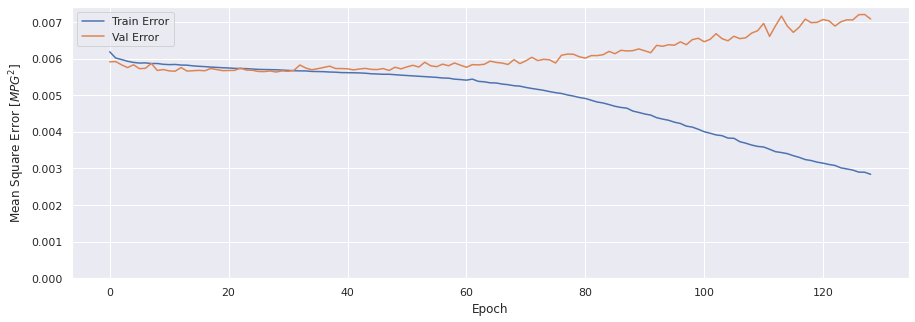

In [141]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history9)

### Evaluar predicciones

In [142]:
score_train9 = model9.evaluate(scaled_trainX, data_trainY_3D_2, verbose=1)
print(f'Loss:{score_train9[0]}')
print(f'MAE:{score_train9[1]}')
print(f'MSE:{score_train9[2]}')
print(f'SMAPE:{score_train9[3]}')

1413/1413 [==============================] - 9s 6ms/step - loss: 0.0028 - mae: 0.0309 - mse: 0.0028 - smape: 0.6899
Loss:0.0027822235133498907
MAE:0.030886903405189514
MSE:0.0027822235133498907
SMAPE:0.6899269223213196


In [143]:
score_val9 = model9.evaluate(scaled_valX, data_valY_3D_2, verbose=1)
print(f'Loss:{score_val9[0]}')
print(f'MAE:{score_val9[1]}')
print(f'MSE:{score_val9[2]}')
print(f'SMAPE:{score_val9[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0071 - mae: 0.0452 - mse: 0.0071 - smape: 0.8011
Loss:0.007080459035933018
MAE:0.04518231749534607
MSE:0.007080459035933018
SMAPE:0.8011297583580017


In [144]:
score_test9 = model9.evaluate(scaled_testX, data_testY_3D_2, verbose=1)
print(f'Loss:{score_test9[0]}')
print(f'MAE:{score_test9[1]}')
print(f'MSE:{score_test9[2]}')
print(f'SMAPE:{score_test9[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0076 - mae: 0.0494 - mse: 0.0076 - smape: 0.8212
Loss:0.007564128842204809
MAE:0.049414318054914474
MSE:0.007564128842204809
SMAPE:0.8211690783500671


### Comparativa de resultados

In [145]:
result = hist9.iloc[-1]
comparativa9 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test9[1], score_test9[2], score_test9[3], math.sqrt(score_test9[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa9.style.set_caption("Método de ventana de varios pasos - LSTM ENCODE DECODE")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.031063,0.002839,0.695789,0.053280
VALIDACION,0.045182,0.007080,0.801805,0.084145
TEST,0.049414,0.007564,0.821169,0.086972


### Obtener predicciones

In [146]:
trainPredict9 = model9.predict(scaled_trainX)
testPredict9 = model9.predict(scaled_testX)

### Visualización de las predicciones

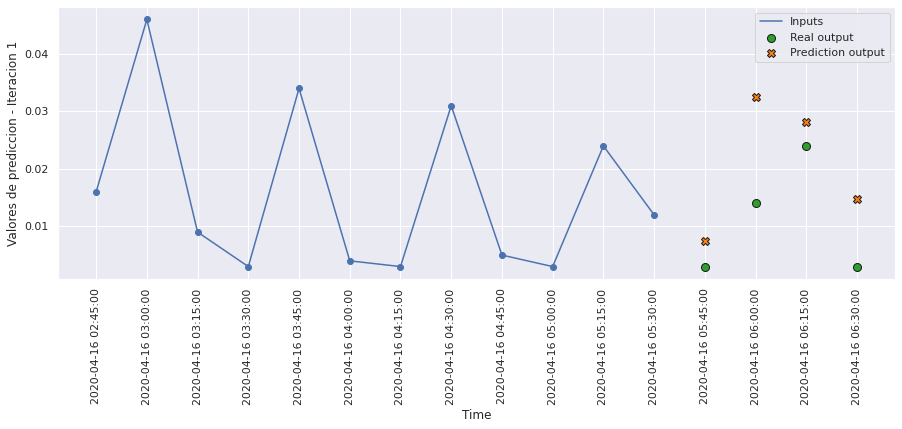

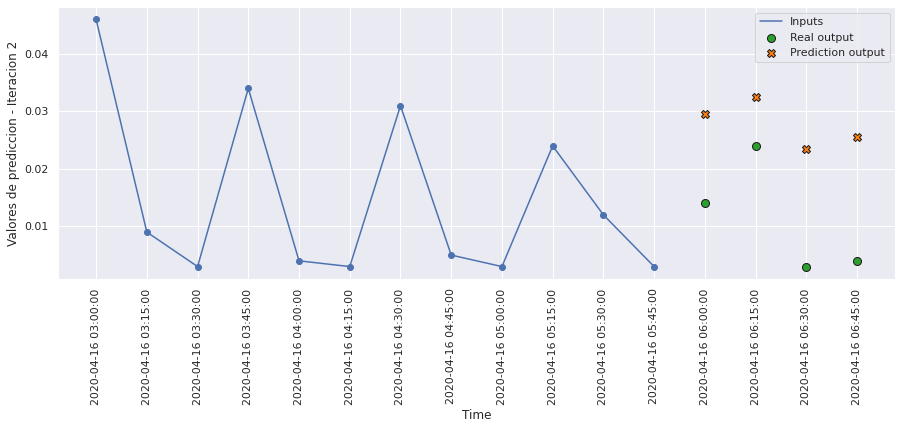

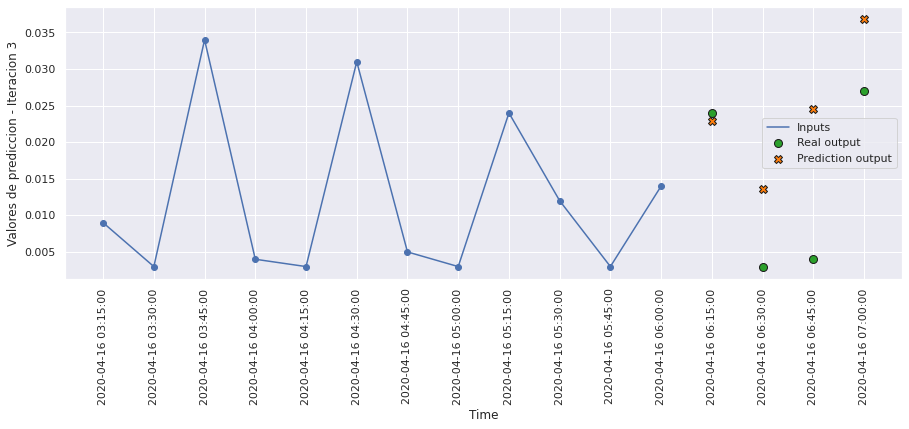

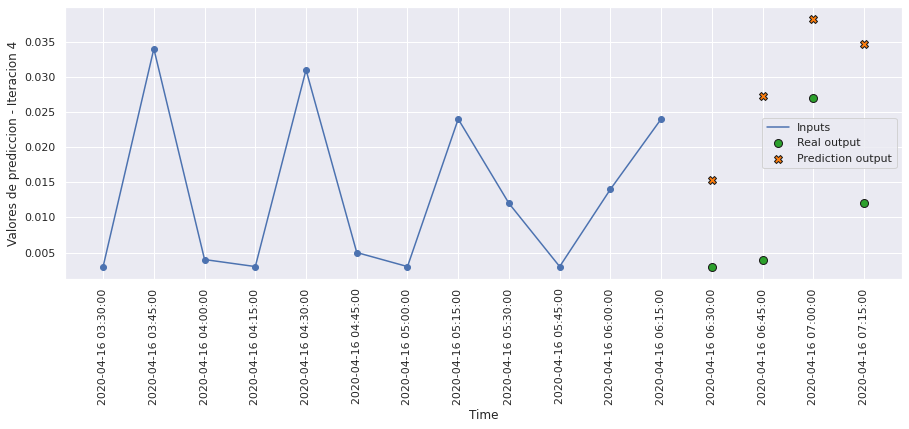

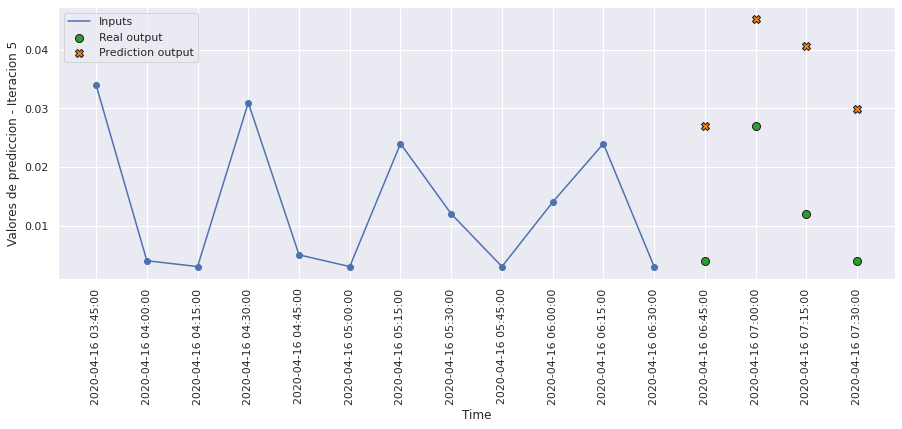

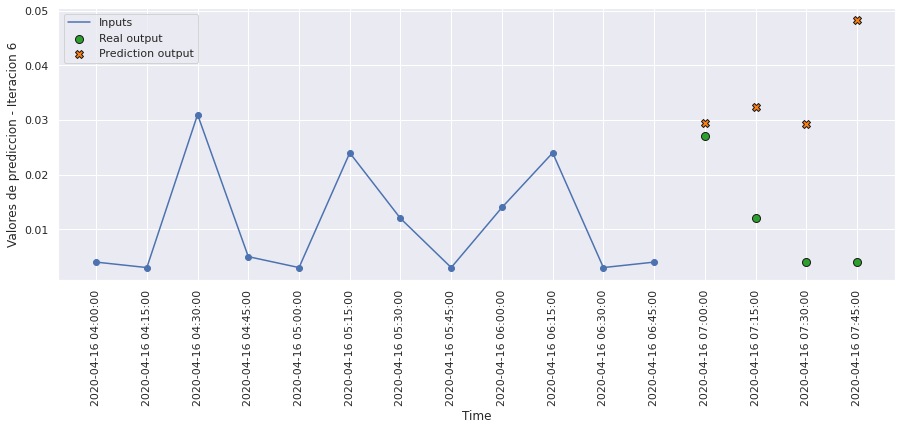

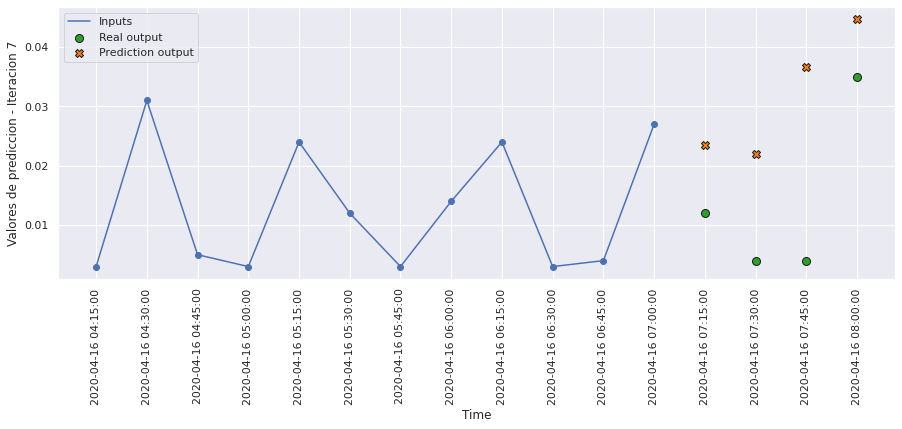

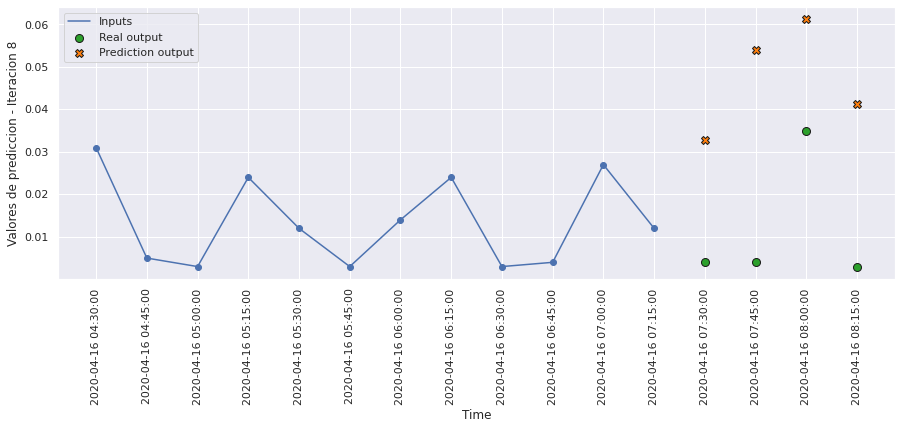

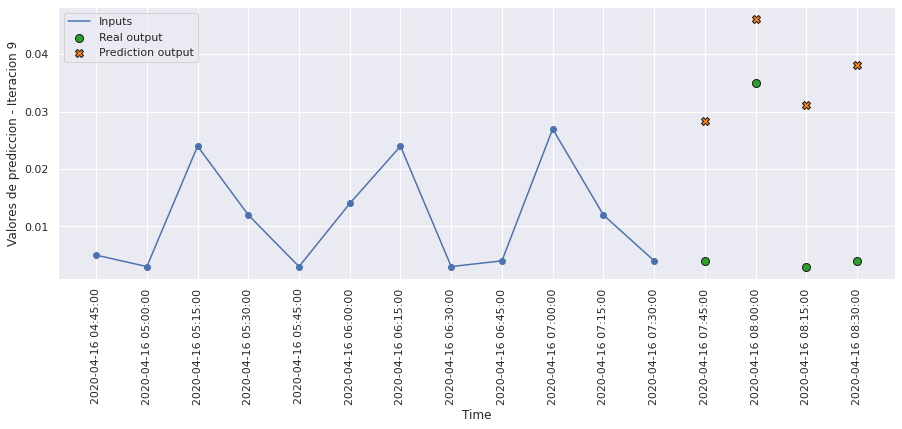

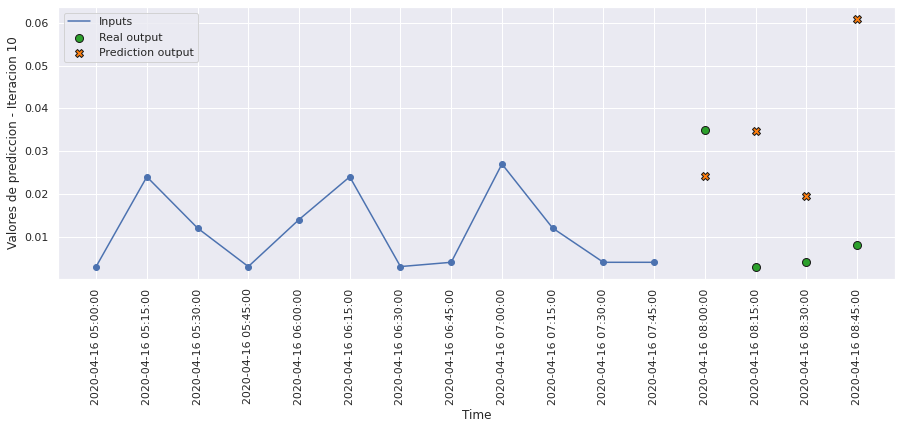

In [147]:
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, 
                        testPredict9.reshape(testPredict9.shape[0],n_predicciones), 10, 0)

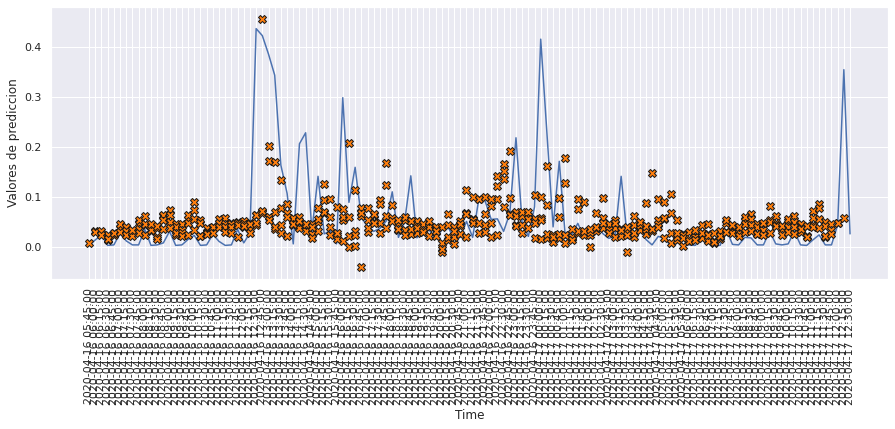

In [148]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions_values(int(test_df.iloc[0].name), 
                        testPredict9.reshape(testPredict9.shape[0],n_predicciones), 120)

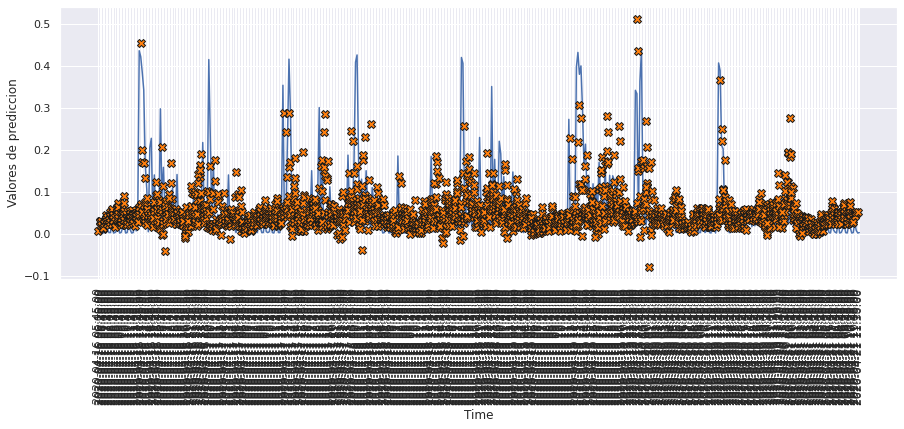

In [149]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions_values(int(test_df.iloc[0].name), 
                        testPredict9.reshape(testPredict9.shape[0],n_predicciones), 500)

# MODELO 10: GRU UNA CAPA

### Construimos el modelo

In [150]:
def build_model10():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.GRU(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [151]:
model10 = build_model10()
model10.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 128)               50304     
                                                                 
 dense_10 (Dense)            (None, 4)                 516       
                                                                 
Total params: 50,820
Trainable params: 50,820
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [152]:
history10 = model10.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 4s 9ms/step - loss: 0.0061 - mae: 0.0456 - mse: 0.0061 - smape: 0.8110 - val_loss: 0.0060 - val_mae: 0.0453 - val_mse: 0.0060 - val_smape: 0.8243
Epoch 2/200
354/354 [==============================] - 3s 10ms/step - loss: 0.0060 - mae: 0.0452 - mse: 0.0060 - smape: 0.8022 - val_loss: 0.0059 - val_mae: 0.0381 - val_mse: 0.0059 - val_smape: 0.7088
Epoch 3/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0060 - mae: 0.0449 - mse: 0.0060 - smape: 0.7977 - val_loss: 0.0058 - val_mae: 0.0392 - val_mse: 0.0058 - val_smape: 0.7320
Epoch 4/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0059 - mae: 0.0444 - mse: 0.0059 - smape: 0.7928 - val_loss: 0.0058 - val_mae: 0.0422 - val_mse: 0.0058 - val_smape: 0.7879
Epoch 5/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0059 - mae: 0.0444 - mse: 0.0059 - smape: 0.7932 - val_loss: 0.0058 - val_mae: 0.0410 - val_mse: 0.0058 - val_smape: 0

Epoch 82/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0055 - mae: 0.0429 - mse: 0.0055 - smape: 0.7685 - val_loss: 0.0058 - val_mae: 0.0406 - val_mse: 0.0058 - val_smape: 0.7589
Epoch 83/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0055 - mae: 0.0428 - mse: 0.0055 - smape: 0.7682 - val_loss: 0.0060 - val_mae: 0.0398 - val_mse: 0.0060 - val_smape: 0.7343
Epoch 84/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0055 - mae: 0.0428 - mse: 0.0055 - smape: 0.7684 - val_loss: 0.0058 - val_mae: 0.0405 - val_mse: 0.0058 - val_smape: 0.7556
Epoch 85/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0055 - mae: 0.0428 - mse: 0.0055 - smape: 0.7684 - val_loss: 0.0058 - val_mae: 0.0410 - val_mse: 0.0058 - val_smape: 0.7639
Epoch 86/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0055 - mae: 0.0427 - mse: 0.0055 - smape: 0.7668 - val_loss: 0.0059 - val_mae: 0.0417 - val_mse: 0.0059 - val_smap

354/354 [==============================] - 3s 9ms/step - loss: 0.0037 - mae: 0.0365 - mse: 0.0037 - smape: 0.7609 - val_loss: 0.0072 - val_mae: 0.0470 - val_mse: 0.0072 - val_smape: 0.8322
Epoch 00162: early stopping


In [153]:
hist10 = pd.DataFrame(history10.history)
hist10['epoch'] = history10.epoch
hist10

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006110,0.045619,0.006110,0.810967,0.005990,0.045339,0.005990,0.824336,0
1,0.006011,0.045152,0.006011,0.802198,0.005857,0.038111,0.005857,0.708765,1
2,0.005978,0.044857,0.005978,0.797722,0.005818,0.039218,0.005818,0.732020,2
3,0.005914,0.044434,0.005914,0.792831,0.005769,0.042237,0.005769,0.787946,3
4,0.005887,0.044434,0.005887,0.793234,0.005752,0.040966,0.005752,0.764199,4
...,...,...,...,...,...,...,...,...,...
157,0.003823,0.036899,0.003823,0.762298,0.007002,0.045620,0.007002,0.812356,157
158,0.003831,0.036997,0.003831,0.763931,0.007164,0.044890,0.007164,0.814029,158
159,0.003784,0.036717,0.003784,0.761214,0.006967,0.045051,0.006967,0.817455,159
160,0.003768,0.036666,0.003768,0.762236,0.007063,0.045594,0.007063,0.809379,160


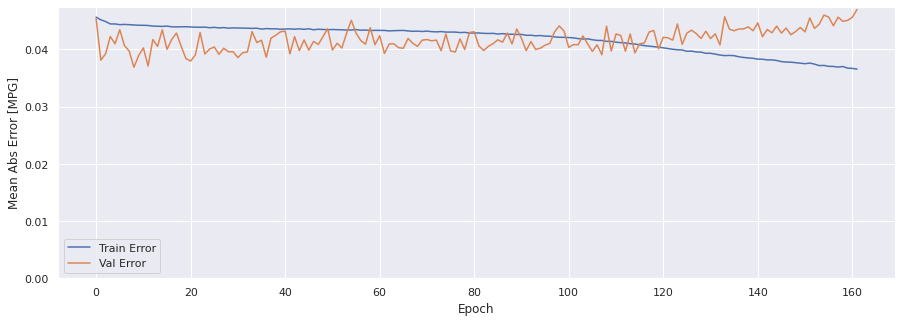

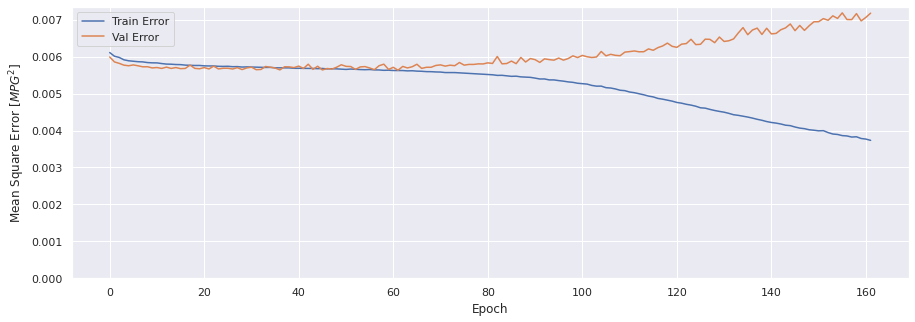

In [154]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history10)

### Evaluar predicciones

In [155]:
score_train10 = model10.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train10[0]}')
print(f'MAE:{score_train10[1]}')
print(f'MSE:{score_train10[2]}')
print(f'SMAPE:{score_train10[3]}')

1413/1413 [==============================] - 7s 5ms/step - loss: 0.0037 - mae: 0.0368 - mse: 0.0037 - smape: 0.7605
Loss:0.003672053338959813
MAE:0.036775074899196625
MSE:0.003672053338959813
SMAPE:0.7605268359184265


In [156]:
score_val10 = model10.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val10[0]}')
print(f'MAE:{score_val10[1]}')
print(f'MSE:{score_val10[2]}')
print(f'SMAPE:{score_val10[3]}')

303/303 [==============================] - 1s 5ms/step - loss: 0.0072 - mae: 0.0470 - mse: 0.0072 - smape: 0.8315
Loss:0.007176544982939959
MAE:0.046959288418293
MSE:0.007176544982939959
SMAPE:0.831507682800293


In [157]:
score_test10 = model10.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test10[0]}')
print(f'MAE:{score_test10[1]}')
print(f'MSE:{score_test10[2]}')
print(f'SMAPE:{score_test10[3]}')

303/303 [==============================] - 1s 5ms/step - loss: 0.0075 - mae: 0.0508 - mse: 0.0075 - smape: 0.8468
Loss:0.007492541801184416
MAE:0.050761815160512924
MSE:0.007492541801184416
SMAPE:0.8467674255371094


### Comparativa de resultados

In [158]:
result = hist10.iloc[-1]
comparativa10 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test10[1], score_test10[2], score_test10[3], math.sqrt(score_test10[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa10.style.set_caption("Método de ventana de varios pasos - GRU una capa")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.036549,0.003734,0.760882,0.061103
VALIDACION,0.046959,0.007177,0.832225,0.084714
TEST,0.050762,0.007493,0.846767,0.086559


### Obtener predicciones

In [159]:
trainPredict10 = model10.predict(scaled_trainX)
testPredict10 = model10.predict(scaled_testX)

### Visualización de las predicciones

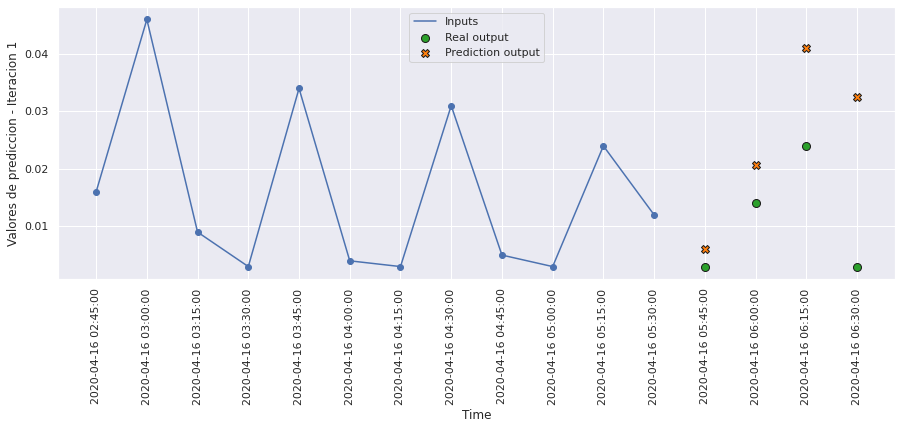

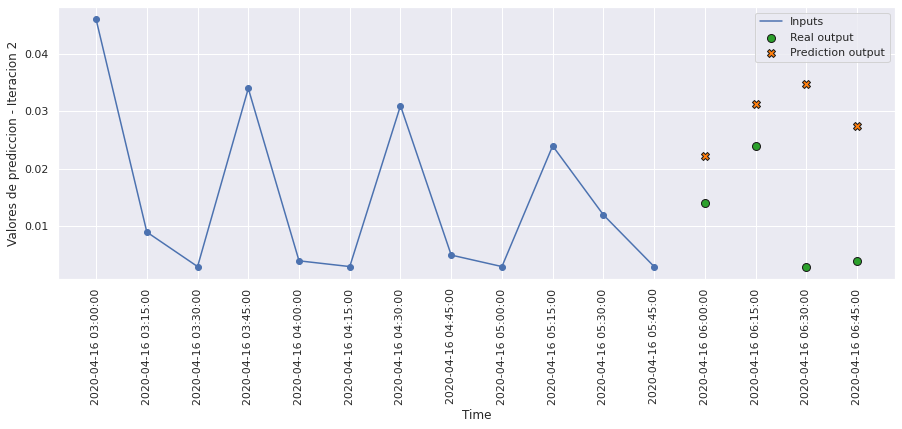

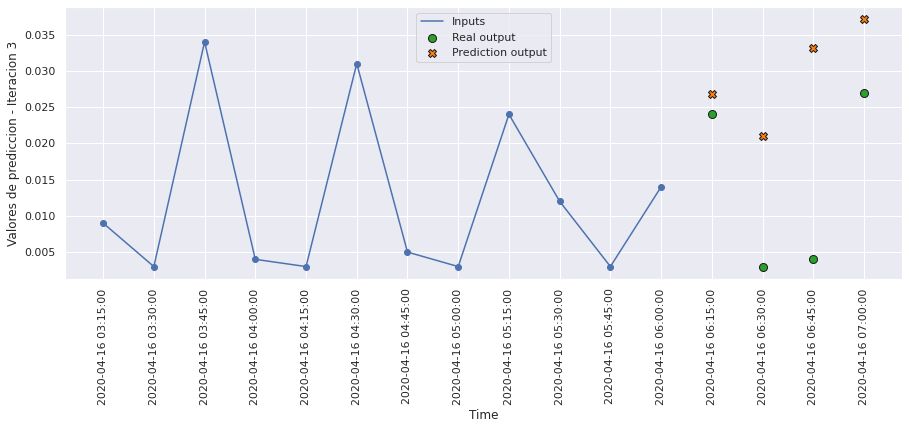

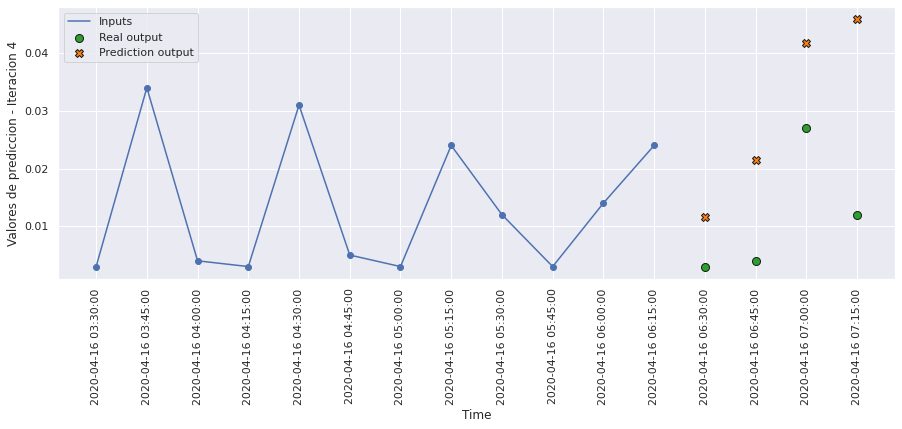

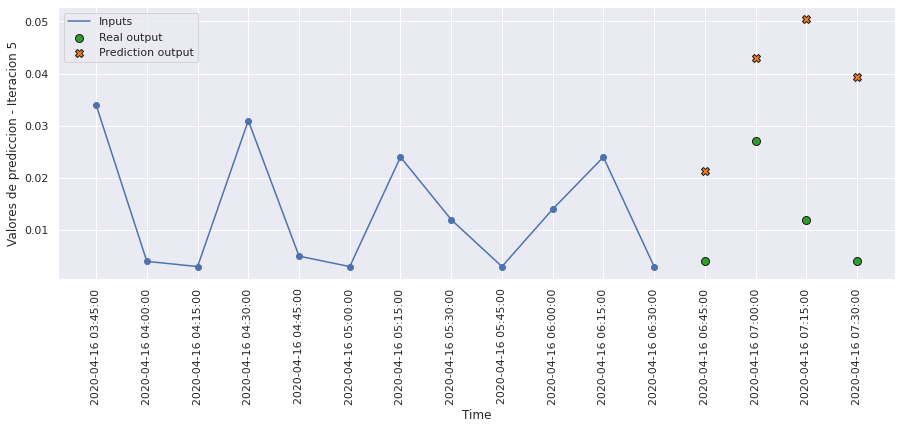

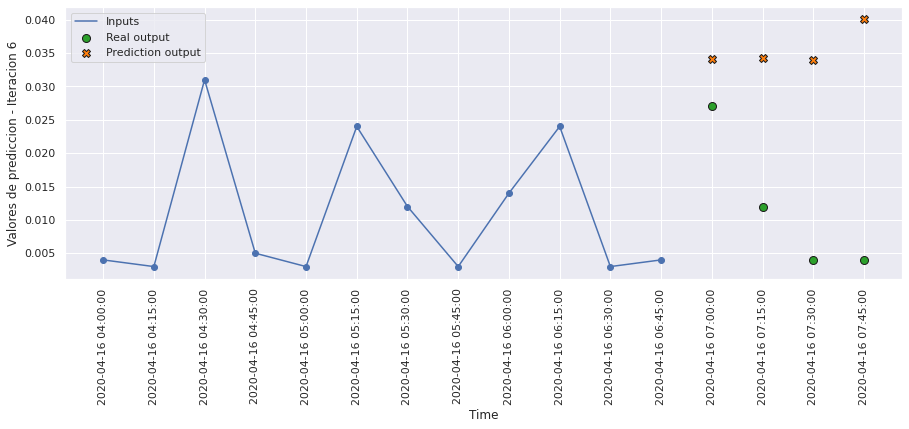

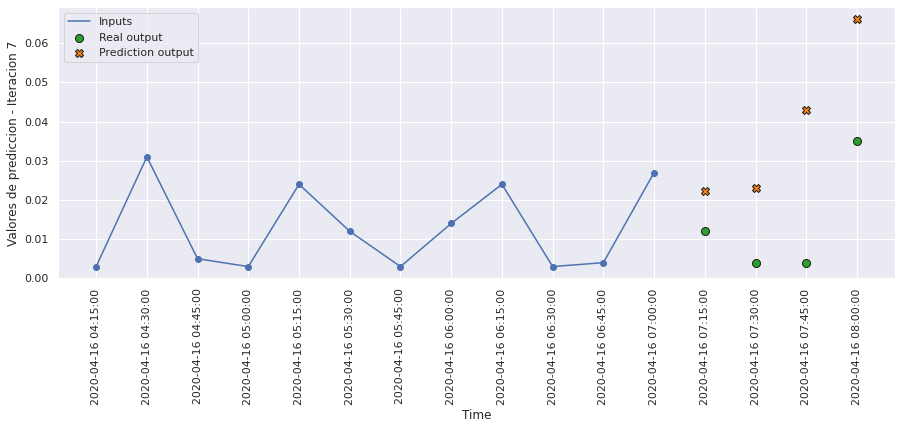

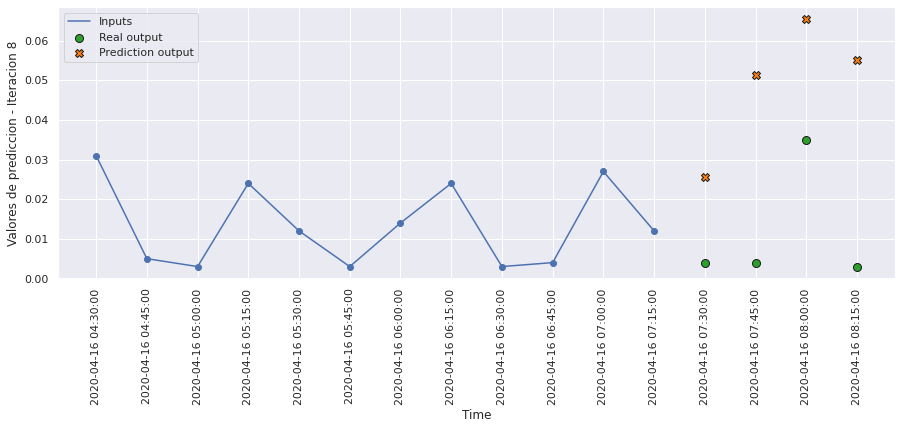

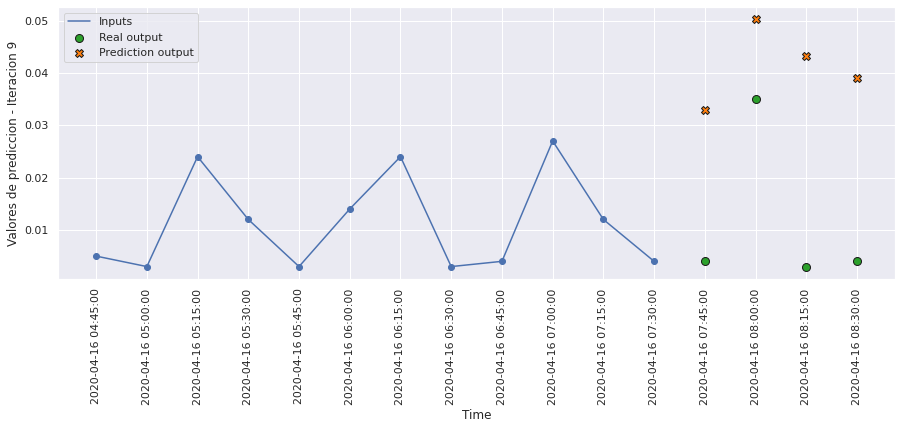

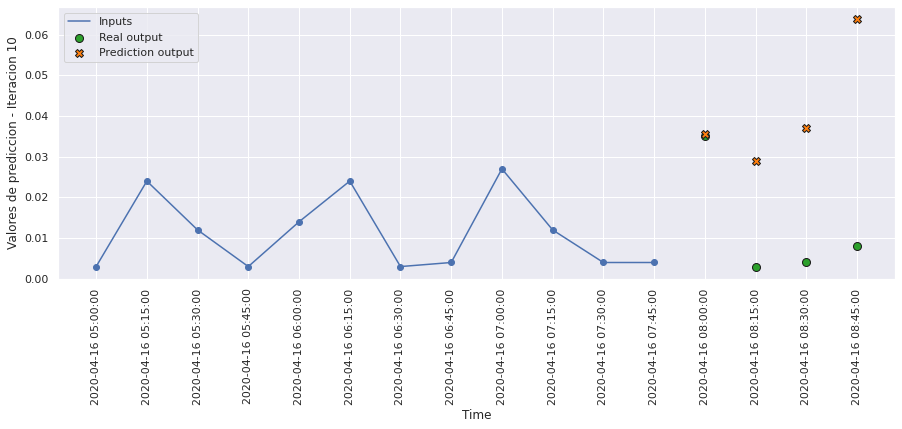

In [160]:
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict10, 10, 0)

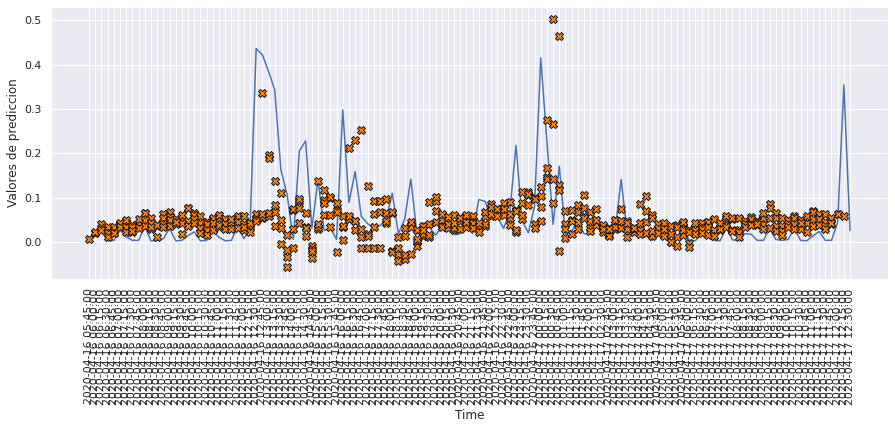

In [161]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict10, 120)

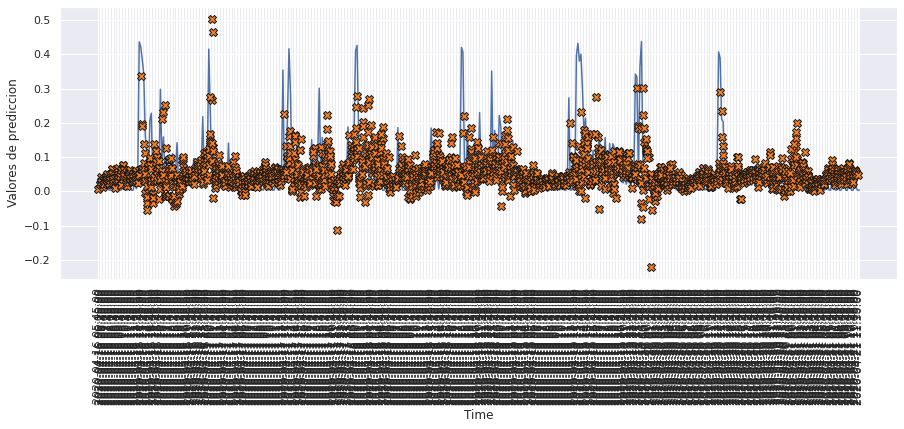

In [162]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict10, 500)

# MODELO 11: GRU DOS CAPAS

### Construimos el modelo

In [163]:
def build_model11():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.GRU(128, activation='tanh', return_sequences=True),
        tf.keras.layers.GRU(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [164]:
model11 = build_model11()
model11.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_1 (GRU)                 (None, 12, 128)           50304     
                                                                 
 gru_2 (GRU)                 (None, 128)               99072     
                                                                 
 dense_11 (Dense)            (None, 4)                 516       
                                                                 
Total params: 149,892
Trainable params: 149,892
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [165]:
history11 = model11.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 7s 13ms/step - loss: 0.0061 - mae: 0.0456 - mse: 0.0061 - smape: 0.8096 - val_loss: 0.0059 - val_mae: 0.0394 - val_mse: 0.0059 - val_smape: 0.7284
Epoch 2/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0060 - mae: 0.0452 - mse: 0.0060 - smape: 0.8019 - val_loss: 0.0058 - val_mae: 0.0392 - val_mse: 0.0058 - val_smape: 0.7275
Epoch 3/200
354/354 [==============================] - 4s 13ms/step - loss: 0.0060 - mae: 0.0449 - mse: 0.0060 - smape: 0.7985 - val_loss: 0.0059 - val_mae: 0.0440 - val_mse: 0.0059 - val_smape: 0.8120
Epoch 4/200
354/354 [==============================] - 4s 13ms/step - loss: 0.0059 - mae: 0.0445 - mse: 0.0059 - smape: 0.7938 - val_loss: 0.0058 - val_mae: 0.0380 - val_mse: 0.0058 - val_smape: 0.7136
Epoch 5/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0059 - mae: 0.0443 - mse: 0.0059 - smape: 0.7906 - val_loss: 0.0058 - val_mae: 0.0383 - val_mse: 0.0058 - val_smap

354/354 [==============================] - 4s 12ms/step - loss: 0.0043 - mae: 0.0384 - mse: 0.0043 - smape: 0.7590 - val_loss: 0.0065 - val_mae: 0.0424 - val_mse: 0.0065 - val_smape: 0.7629
Epoch 82/200
354/354 [==============================] - 4s 13ms/step - loss: 0.0042 - mae: 0.0383 - mse: 0.0042 - smape: 0.7604 - val_loss: 0.0066 - val_mae: 0.0432 - val_mse: 0.0066 - val_smape: 0.8096
Epoch 83/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0042 - mae: 0.0381 - mse: 0.0042 - smape: 0.7617 - val_loss: 0.0064 - val_mae: 0.0420 - val_mse: 0.0064 - val_smape: 0.7569
Epoch 84/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0041 - mae: 0.0378 - mse: 0.0041 - smape: 0.7603 - val_loss: 0.0065 - val_mae: 0.0449 - val_mse: 0.0065 - val_smape: 0.8064
Epoch 85/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0040 - mae: 0.0376 - mse: 0.0040 - smape: 0.7613 - val_loss: 0.0064 - val_mae: 0.0416 - val_mse: 0.0064 - val_smape: 0.788

In [166]:
hist11 = pd.DataFrame(history11.history)
hist11['epoch'] = history11.epoch
hist11

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006107,0.045601,0.006107,0.809575,0.005873,0.039428,0.005873,0.728437,0
1,0.006021,0.045163,0.006021,0.801941,0.005843,0.039222,0.005843,0.727494,1
2,0.005982,0.044866,0.005982,0.798539,0.005852,0.044025,0.005852,0.812041,2
3,0.005913,0.044504,0.005913,0.793808,0.005794,0.037969,0.005794,0.713553,3
4,0.005876,0.044322,0.005876,0.790628,0.005787,0.038290,0.005787,0.717392,4
...,...,...,...,...,...,...,...,...,...
114,0.002704,0.031440,0.002704,0.741550,0.007217,0.045657,0.007217,0.834395,114
115,0.002681,0.031308,0.002681,0.740721,0.007168,0.045845,0.007168,0.833032,115
116,0.002647,0.031140,0.002647,0.738512,0.007302,0.046403,0.007302,0.859419,116
117,0.002629,0.031066,0.002629,0.738949,0.007308,0.046610,0.007308,0.852086,117


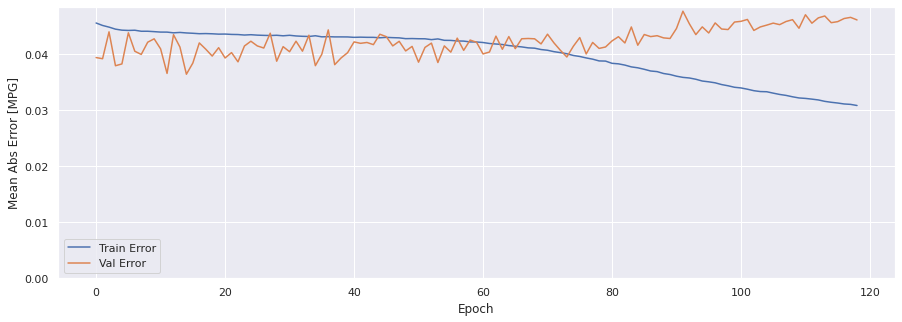

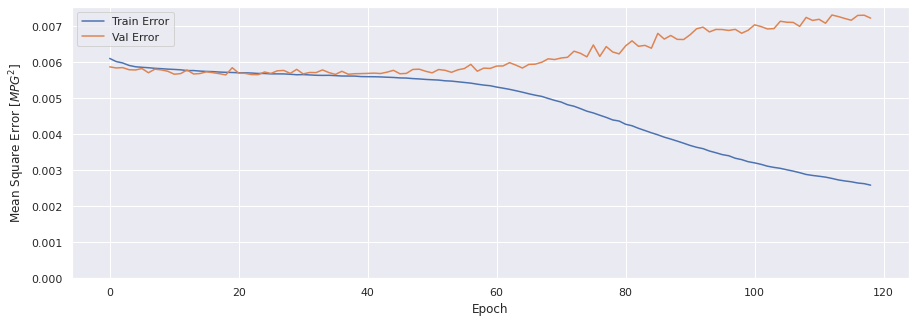

In [167]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history11)

### Evaluar predicciones

In [168]:
score_train11 = model11.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train11[0]}')
print(f'MAE:{score_train11[1]}')
print(f'MSE:{score_train11[2]}')
print(f'SMAPE:{score_train11[3]}')

1413/1413 [==============================] - 8s 6ms/step - loss: 0.0025 - mae: 0.0307 - mse: 0.0025 - smape: 0.7450
Loss:0.002504562260583043
MAE:0.030674222856760025
MSE:0.002504562260583043
SMAPE:0.7449529767036438


In [169]:
score_val11 = model11.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val11[0]}')
print(f'MAE:{score_val11[1]}')
print(f'MSE:{score_val11[2]}')
print(f'SMAPE:{score_val11[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0072 - mae: 0.0461 - mse: 0.0072 - smape: 0.8408
Loss:0.007226754445582628
MAE:0.0461491160094738
MSE:0.007226754445582628
SMAPE:0.8407954573631287


In [170]:
score_test11 = model11.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test11[0]}')
print(f'MAE:{score_test11[1]}')
print(f'MSE:{score_test11[2]}')
print(f'SMAPE:{score_test11[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0078 - mae: 0.0503 - mse: 0.0078 - smape: 0.8590
Loss:0.007803096901625395
MAE:0.05027634650468826
MSE:0.007803096901625395
SMAPE:0.8589571118354797


### Comparativa de resultados

In [171]:
result = hist11.iloc[-1]
comparativa11 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test11[1], score_test11[2], score_test11[3], math.sqrt(score_test11[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa11.style.set_caption("Método de ventana de varios pasos - GRU dos capas")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.030865,0.002587,0.739512,0.050866
VALIDACION,0.046149,0.007227,0.841381,0.085010
TEST,0.050276,0.007803,0.858957,0.088335


### Obtener predicciones

In [172]:
trainPredict11 = model11.predict(scaled_trainX)
testPredict11 = model11.predict(scaled_testX)

### Visualización de las predicciones

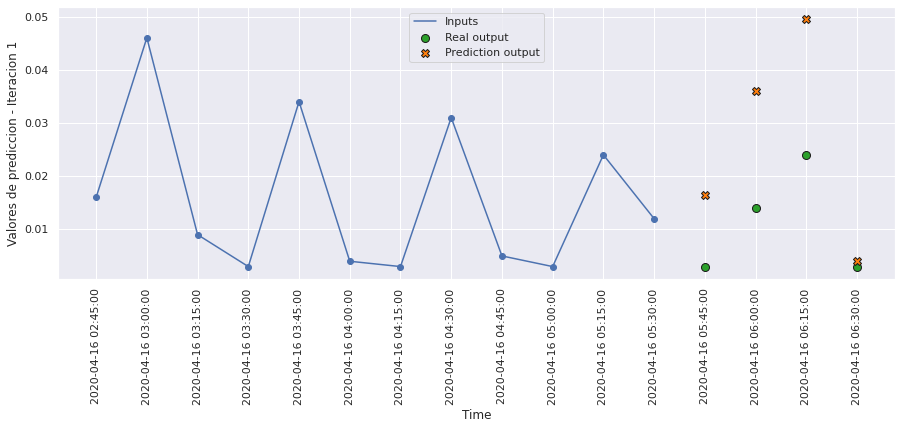

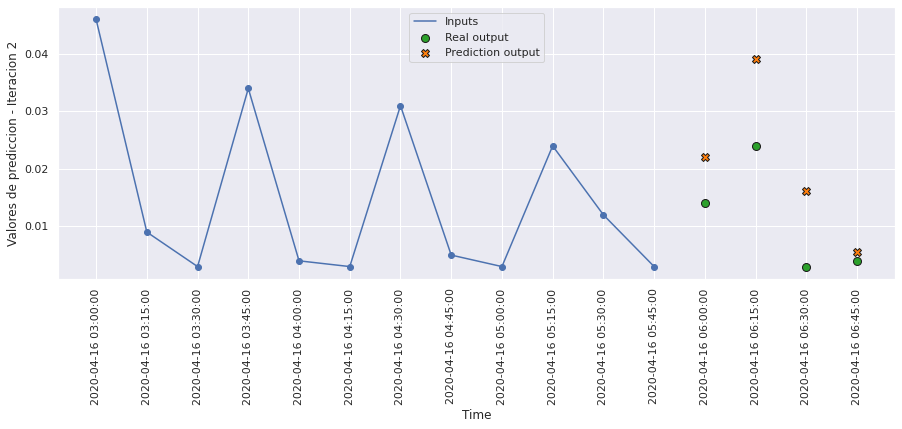

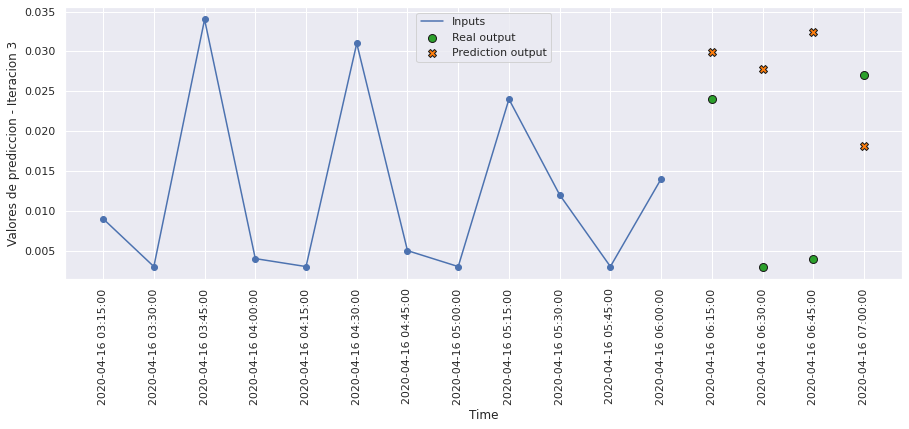

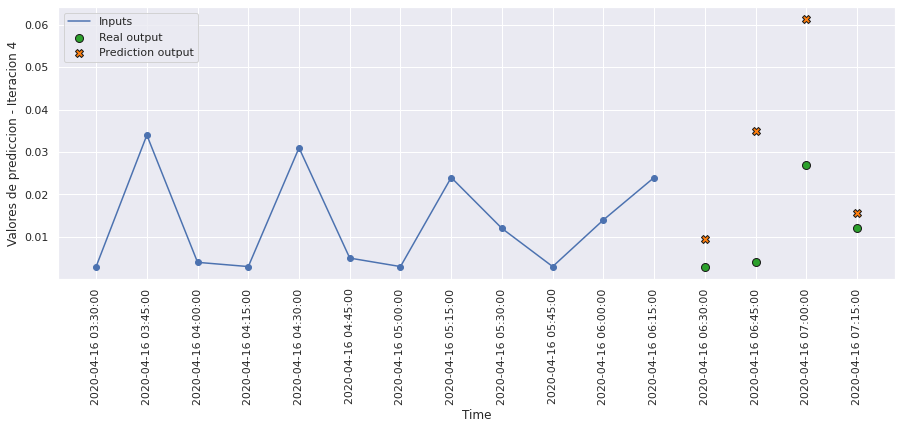

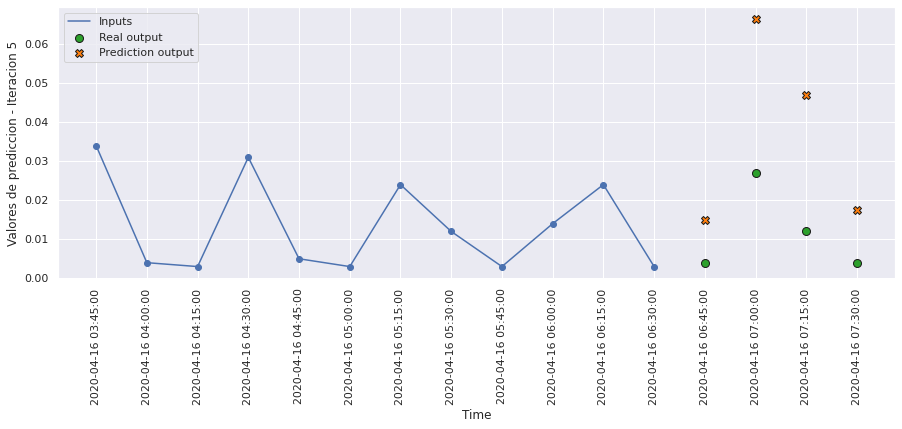

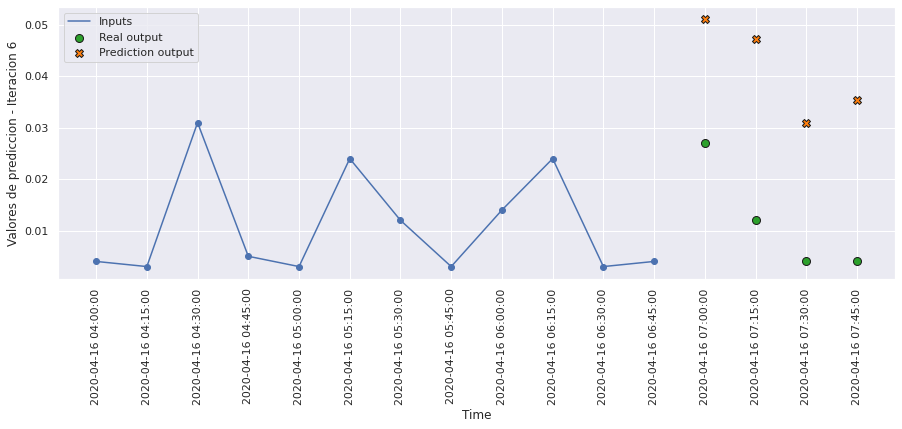

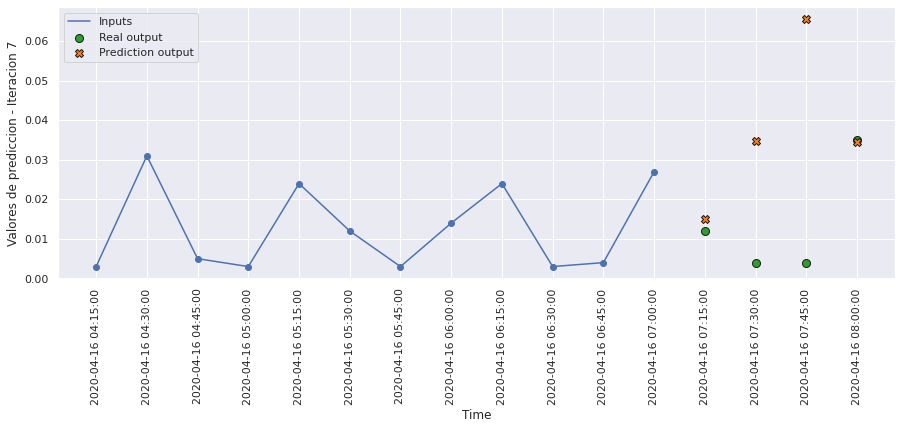

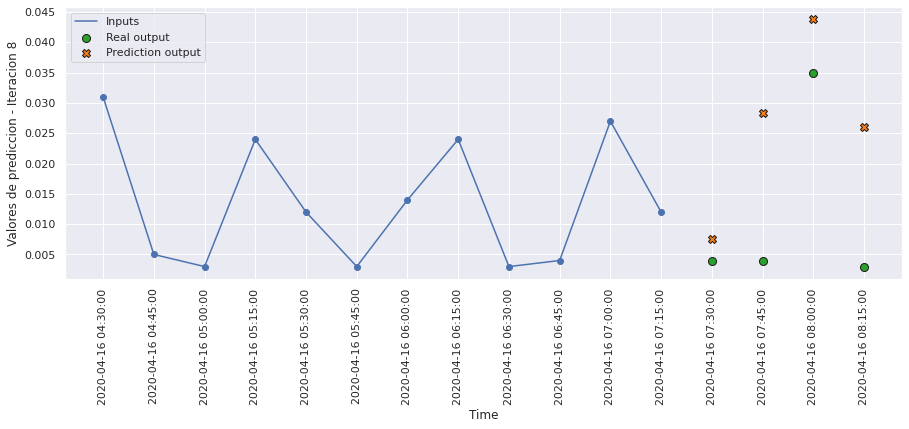

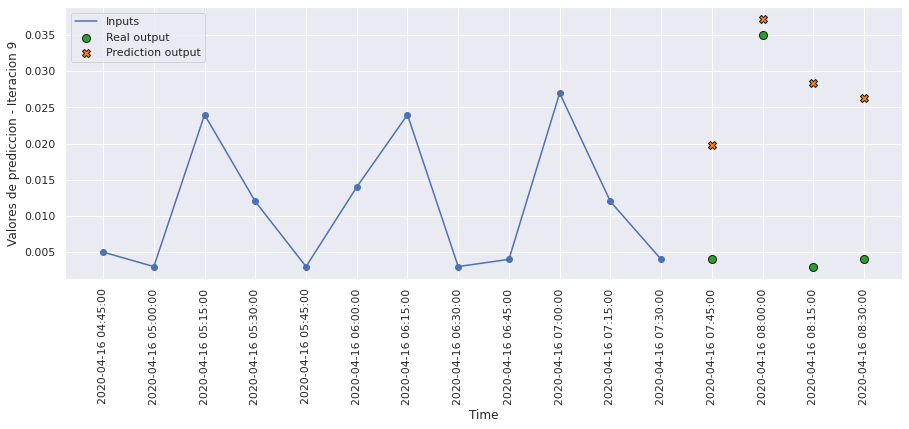

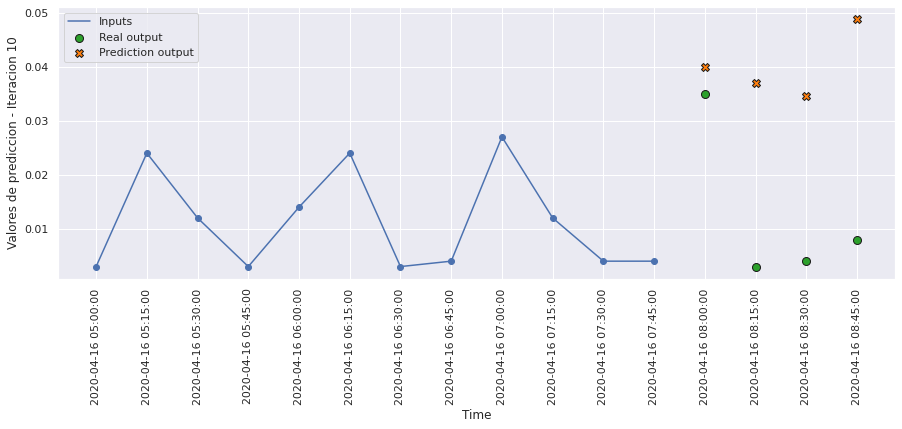

In [173]:
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict11, 10, 0)

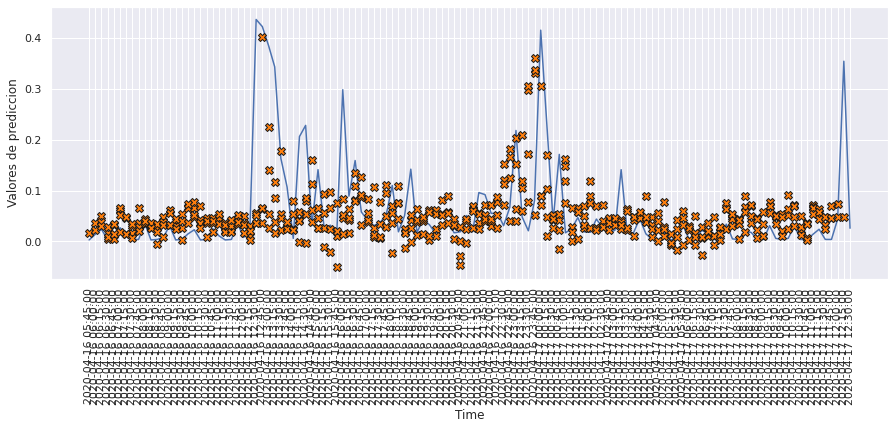

In [174]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict11, 120)

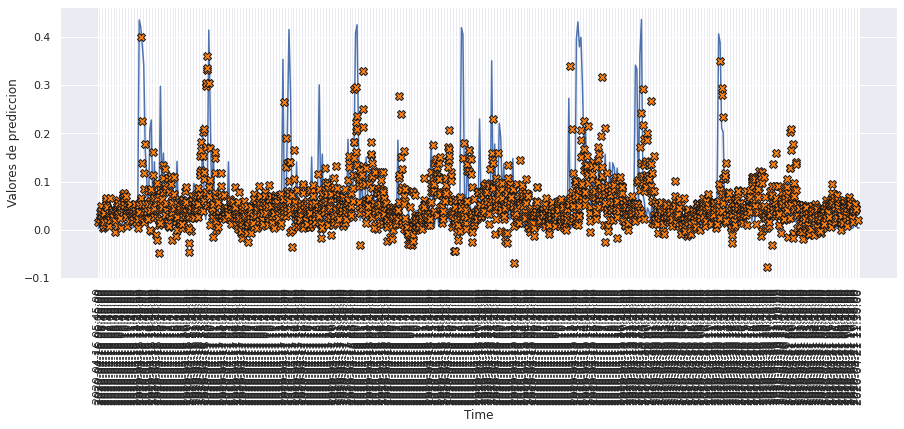

In [175]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict11, 500)

# MODELO 12: LSTM UNRESTRICTED UNA CAPA

### Construimos el modelo

In [176]:
def build_model12():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences=True),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [177]:
model12 = build_model12()
model12.summary()

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_10 (LSTM)              (None, 12, 128)           66560     
                                                                 
 flatten_4 (Flatten)         (None, 1536)              0         
                                                                 
 dense_12 (Dense)            (None, 4)                 6148      
                                                                 
Total params: 72,708
Trainable params: 72,708
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [178]:
history12 = model12.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 4s 10ms/step - loss: 0.0062 - mae: 0.0459 - mse: 0.0062 - smape: 0.8151 - val_loss: 0.0059 - val_mae: 0.0400 - val_mse: 0.0059 - val_smape: 0.7423
Epoch 2/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0060 - mae: 0.0449 - mse: 0.0060 - smape: 0.7995 - val_loss: 0.0059 - val_mae: 0.0416 - val_mse: 0.0059 - val_smape: 0.7681
Epoch 3/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0060 - mae: 0.0449 - mse: 0.0060 - smape: 0.7992 - val_loss: 0.0059 - val_mae: 0.0420 - val_mse: 0.0059 - val_smape: 0.7738
Epoch 4/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0060 - mae: 0.0447 - mse: 0.0060 - smape: 0.7966 - val_loss: 0.0059 - val_mae: 0.0460 - val_mse: 0.0059 - val_smape: 0.8358
Epoch 5/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0059 - mae: 0.0446 - mse: 0.0059 - smape: 0.7957 - val_loss: 0.0058 - val_mae: 0.0406 - val_mse: 0.0058 - val_smape: 0

Epoch 82/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0057 - mae: 0.0435 - mse: 0.0057 - smape: 0.7756 - val_loss: 0.0057 - val_mae: 0.0418 - val_mse: 0.0057 - val_smape: 0.7730
Epoch 83/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0057 - mae: 0.0435 - mse: 0.0057 - smape: 0.7754 - val_loss: 0.0057 - val_mae: 0.0402 - val_mse: 0.0057 - val_smape: 0.7411
Epoch 84/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0057 - mae: 0.0434 - mse: 0.0057 - smape: 0.7751 - val_loss: 0.0057 - val_mae: 0.0408 - val_mse: 0.0057 - val_smape: 0.7614
Epoch 85/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0057 - mae: 0.0434 - mse: 0.0057 - smape: 0.7743 - val_loss: 0.0057 - val_mae: 0.0401 - val_mse: 0.0057 - val_smape: 0.7507
Epoch 86/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0057 - mae: 0.0434 - mse: 0.0057 - smape: 0.7744 - val_loss: 0.0057 - val_mae: 0.0404 - val_mse: 0.0057 - val_smap

In [179]:
hist12 = pd.DataFrame(history12.history)
hist12['epoch'] = history12.epoch
hist12

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006218,0.045912,0.006218,0.815057,0.005905,0.039963,0.005905,0.742294,0
1,0.006008,0.044922,0.006008,0.799550,0.005865,0.041614,0.005865,0.768099,1
2,0.005995,0.044922,0.005995,0.799238,0.005864,0.041955,0.005864,0.773789,2
3,0.005974,0.044701,0.005974,0.796612,0.005910,0.045988,0.005910,0.835838,3
4,0.005940,0.044631,0.005940,0.795745,0.005794,0.040585,0.005794,0.752258,4
...,...,...,...,...,...,...,...,...,...
134,0.005590,0.043125,0.005590,0.770991,0.005708,0.040151,0.005708,0.751824,134
135,0.005586,0.043049,0.005586,0.770146,0.005715,0.040666,0.005715,0.756069,135
136,0.005581,0.042984,0.005581,0.768435,0.005713,0.041322,0.005713,0.767986,136
137,0.005576,0.043028,0.005576,0.769611,0.005725,0.039748,0.005725,0.742403,137


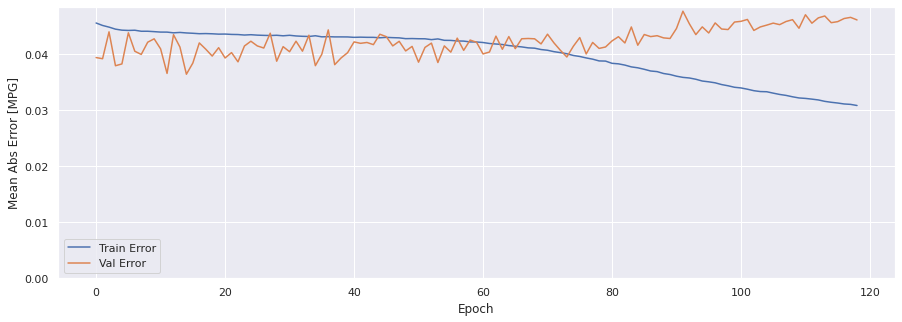

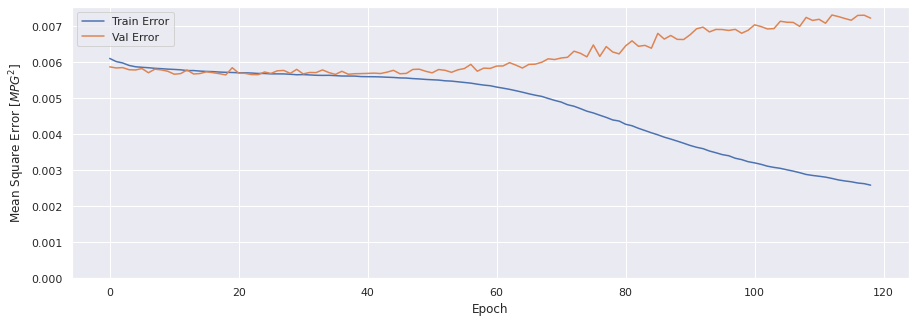

In [180]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history11)

### Evaluar predicciones

In [181]:
score_train12 = model12.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train12[0]}')
print(f'MAE:{score_train12[1]}')
print(f'MSE:{score_train12[2]}')
print(f'SMAPE:{score_train12[3]}')

1413/1413 [==============================] - 7s 5ms/step - loss: 0.0056 - mae: 0.0421 - mse: 0.0056 - smape: 0.7534
Loss:0.005560250952839851
MAE:0.04208260029554367
MSE:0.005560250952839851
SMAPE:0.7534379363059998


In [182]:
score_val12 = model12.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val12[0]}')
print(f'MAE:{score_val12[1]}')
print(f'MSE:{score_val12[2]}')
print(f'SMAPE:{score_val12[3]}')

303/303 [==============================] - 2s 5ms/step - loss: 0.0057 - mae: 0.0402 - mse: 0.0057 - smape: 0.7487
Loss:0.0057146744802594185
MAE:0.04018384590744972
MSE:0.0057146744802594185
SMAPE:0.7487318515777588


In [183]:
score_test12 = model12.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test12[0]}')
print(f'MAE:{score_test12[1]}')
print(f'MSE:{score_test12[2]}')
print(f'SMAPE:{score_test12[3]}')

303/303 [==============================] - 2s 5ms/step - loss: 0.0060 - mae: 0.0446 - mse: 0.0060 - smape: 0.7736
Loss:0.006025527138262987
MAE:0.04458839073777199
MSE:0.006025527138262987
SMAPE:0.7736476063728333


### Comparativa de resultados

In [184]:
result = hist12.iloc[-1]
comparativa12 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test12[1], score_test12[2], score_test12[3], math.sqrt(score_test12[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa12.style.set_caption("Método de ventana de varios pasos - LSTM UNRESTRICTED una capa")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.043054,0.005577,0.769265,0.074681
VALIDACION,0.040184,0.005715,0.749652,0.075595
TEST,0.044588,0.006026,0.773648,0.077624


### Obtener predicciones

In [185]:
trainPredict12 = model12.predict(scaled_trainX)
testPredict12 = model12.predict(scaled_testX)

### Visualización de las predicciones

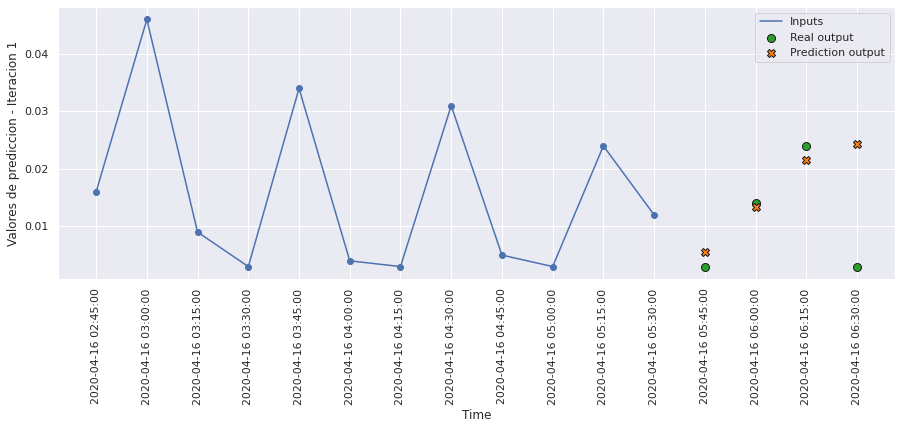

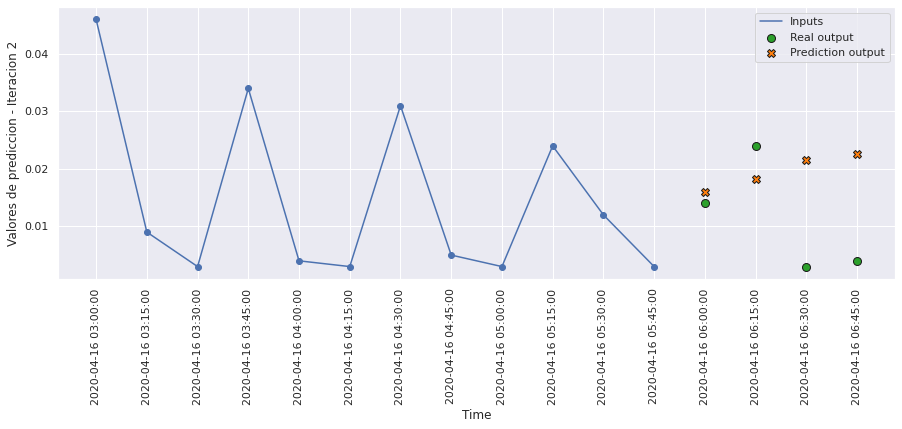

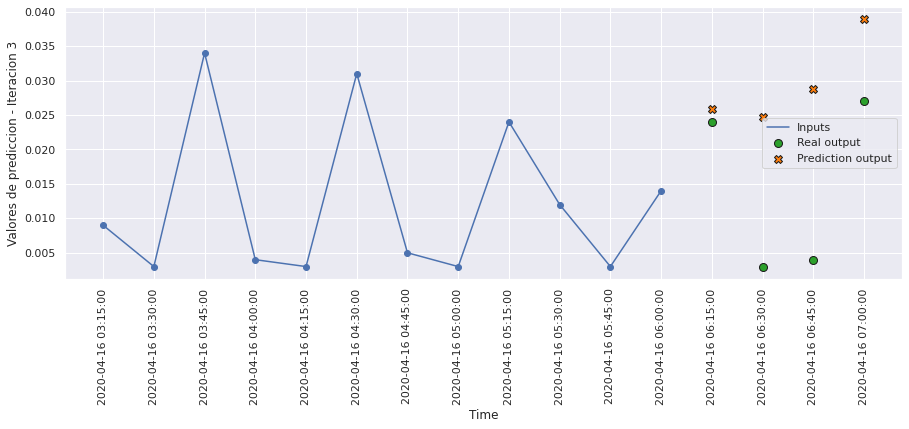

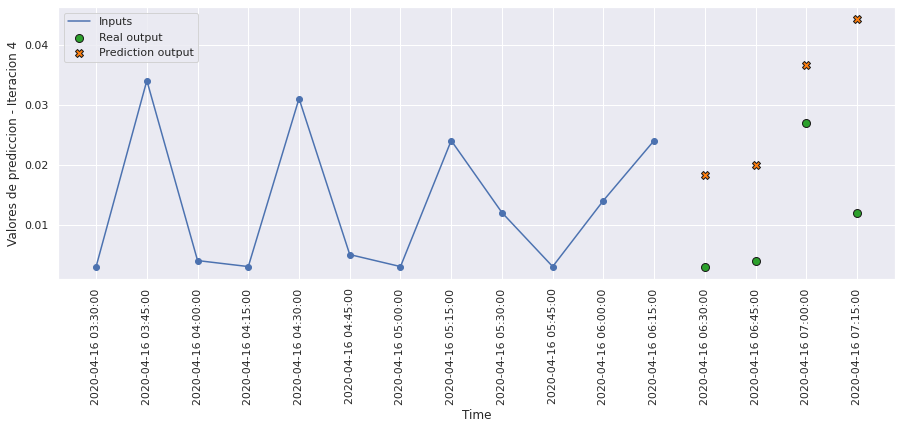

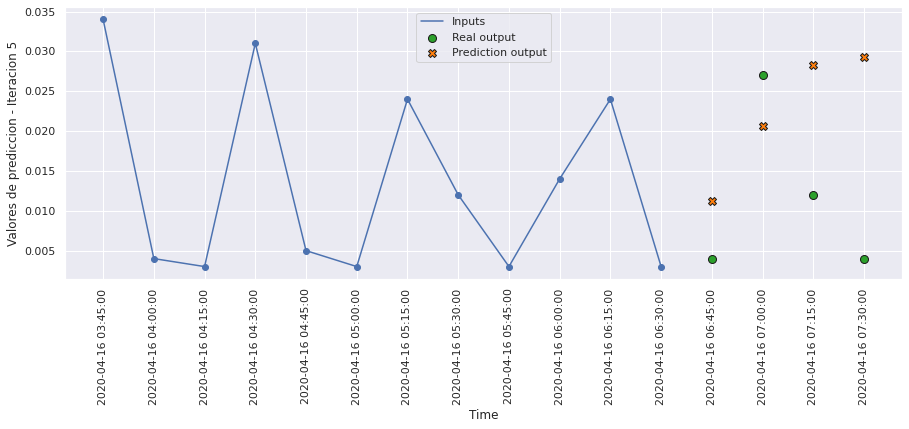

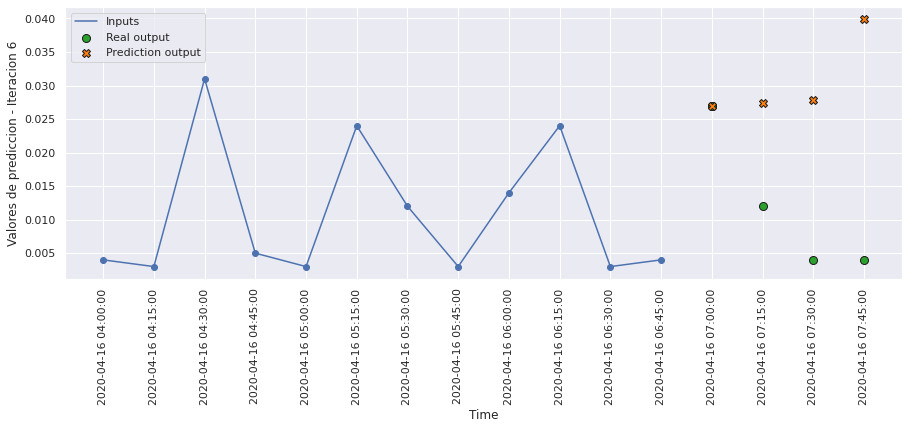

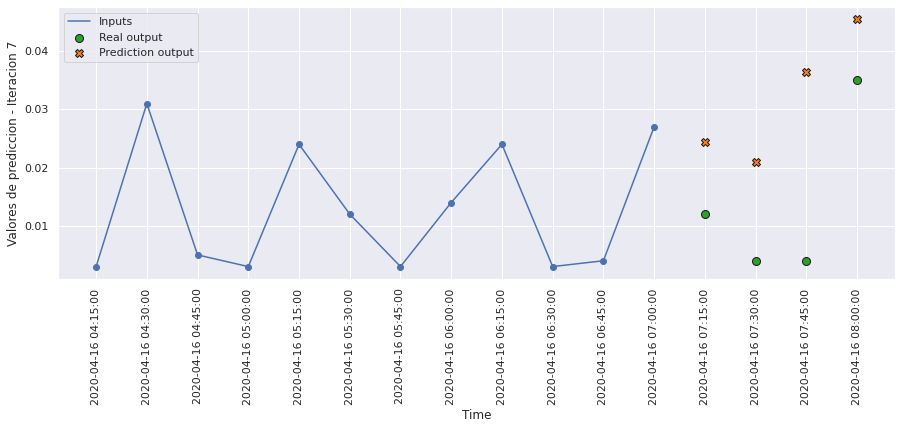

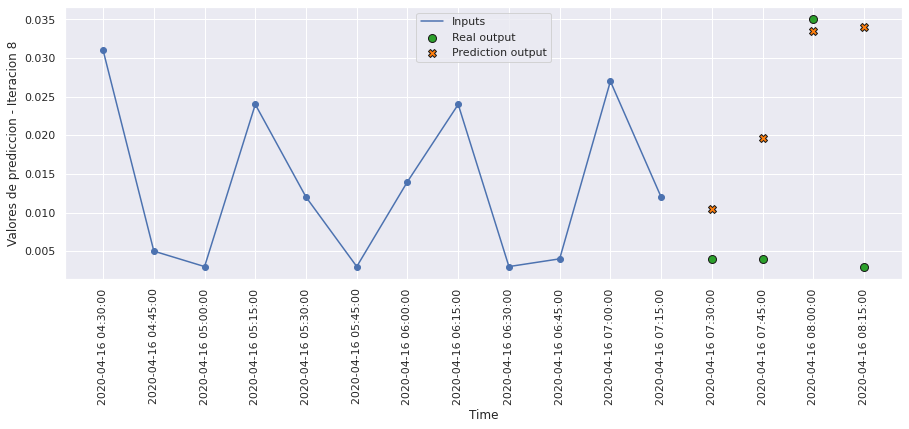

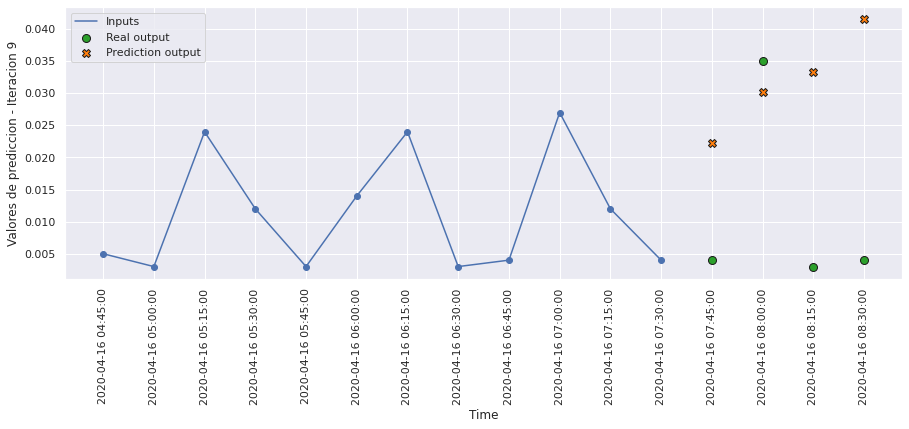

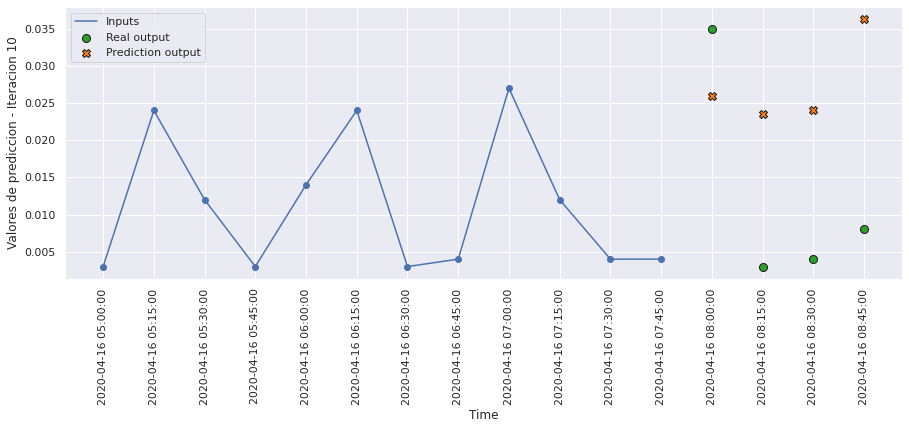

In [186]:
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict12, 10, 0)

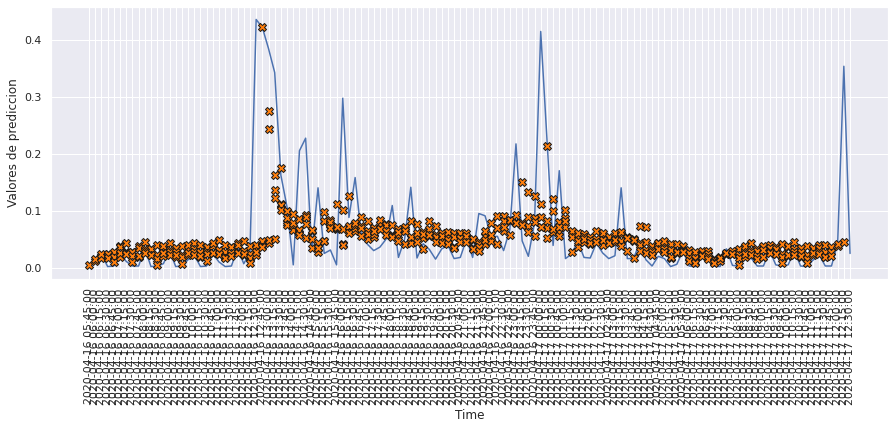

In [187]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict12, 120)

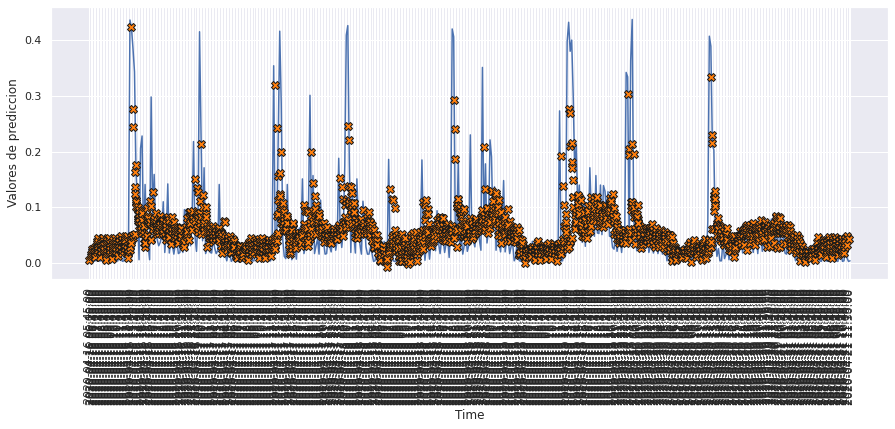

In [188]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict12, 500)

# MODELO 13: LSTM UNRESTRICTED DOS CAPAS

### Construimos el modelo

In [189]:
def build_model13():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences=True),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences=True),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [190]:
model13 = build_model13()
model13.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_11 (LSTM)              (None, 12, 128)           66560     
                                                                 
 lstm_12 (LSTM)              (None, 12, 128)           131584    
                                                                 
 flatten_5 (Flatten)         (None, 1536)              0         
                                                                 
 dense_13 (Dense)            (None, 4)                 6148      
                                                                 
Total params: 204,292
Trainable params: 204,292
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [191]:
history13 = model13.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 7s 15ms/step - loss: 0.0063 - mae: 0.0463 - mse: 0.0063 - smape: 0.8202 - val_loss: 0.0059 - val_mae: 0.0402 - val_mse: 0.0059 - val_smape: 0.7467
Epoch 2/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0060 - mae: 0.0450 - mse: 0.0060 - smape: 0.7992 - val_loss: 0.0059 - val_mae: 0.0397 - val_mse: 0.0059 - val_smape: 0.7366
Epoch 3/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0060 - mae: 0.0448 - mse: 0.0060 - smape: 0.7980 - val_loss: 0.0058 - val_mae: 0.0426 - val_mse: 0.0058 - val_smape: 0.7839
Epoch 4/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0059 - mae: 0.0446 - mse: 0.0059 - smape: 0.7960 - val_loss: 0.0058 - val_mae: 0.0360 - val_mse: 0.0058 - val_smape: 0.6698
Epoch 5/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0059 - mae: 0.0446 - mse: 0.0059 - smape: 0.7950 - val_loss: 0.0057 - val_mae: 0.0387 - val_mse: 0.0057 - val_smap

354/354 [==============================] - 5s 13ms/step - loss: 0.0055 - mae: 0.0426 - mse: 0.0055 - smape: 0.7660 - val_loss: 0.0059 - val_mae: 0.0403 - val_mse: 0.0059 - val_smape: 0.7349
Epoch 82/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0054 - mae: 0.0425 - mse: 0.0054 - smape: 0.7655 - val_loss: 0.0058 - val_mae: 0.0400 - val_mse: 0.0058 - val_smape: 0.7453
Epoch 83/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0054 - mae: 0.0425 - mse: 0.0054 - smape: 0.7641 - val_loss: 0.0059 - val_mae: 0.0401 - val_mse: 0.0059 - val_smape: 0.7386
Epoch 84/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0054 - mae: 0.0425 - mse: 0.0054 - smape: 0.7657 - val_loss: 0.0058 - val_mae: 0.0406 - val_mse: 0.0058 - val_smape: 0.7509
Epoch 85/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0054 - mae: 0.0424 - mse: 0.0054 - smape: 0.7641 - val_loss: 0.0059 - val_mae: 0.0428 - val_mse: 0.0059 - val_smape: 0.776

In [192]:
hist13 = pd.DataFrame(history13.history)
hist13['epoch'] = history13.epoch
hist13

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006288,0.046308,0.006288,0.820213,0.005897,0.040152,0.005897,0.746723,0
1,0.006011,0.044960,0.006011,0.799175,0.005869,0.039660,0.005869,0.736552,1
2,0.005983,0.044836,0.005983,0.798039,0.005847,0.042587,0.005847,0.783942,2
3,0.005928,0.044644,0.005928,0.796049,0.005799,0.035983,0.005799,0.669847,3
4,0.005906,0.044566,0.005906,0.795045,0.005748,0.038749,0.005748,0.727060,4
...,...,...,...,...,...,...,...,...,...
115,0.004620,0.039248,0.004620,0.752692,0.006227,0.044260,0.006227,0.797343,115
116,0.004594,0.039205,0.004594,0.753238,0.006202,0.043001,0.006202,0.781714,116
117,0.004543,0.038969,0.004543,0.752928,0.006396,0.042551,0.006396,0.771132,117
118,0.004519,0.038888,0.004519,0.752133,0.006195,0.041167,0.006195,0.760020,118


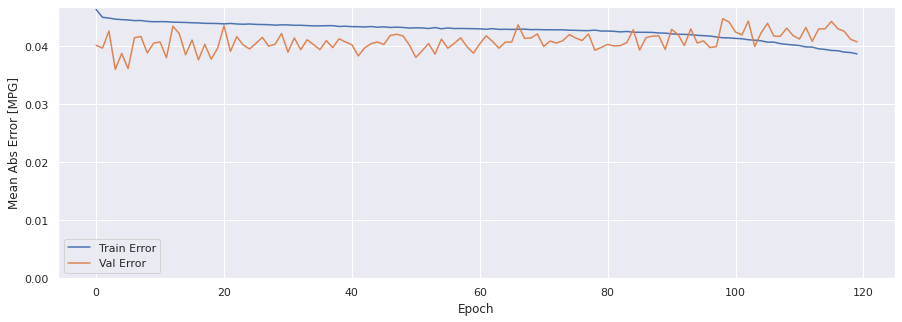

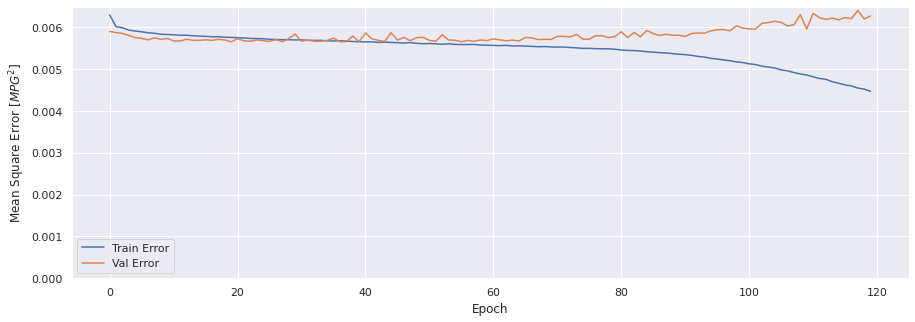

In [193]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history13)

### Evaluar predicciones

In [194]:
score_train13 = model13.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train13[0]}')
print(f'MAE:{score_train13[1]}')
print(f'MSE:{score_train13[2]}')
print(f'SMAPE:{score_train13[3]}')

1413/1413 [==============================] - 9s 7ms/step - loss: 0.0043 - mae: 0.0372 - mse: 0.0043 - smape: 0.7359
Loss:0.004313569515943527
MAE:0.03724464029073715
MSE:0.004313569515943527
SMAPE:0.7358829379081726


In [195]:
score_val13 = model13.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val13[0]}')
print(f'MAE:{score_val13[1]}')
print(f'MSE:{score_val13[2]}')
print(f'SMAPE:{score_val13[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0063 - mae: 0.0408 - mse: 0.0063 - smape: 0.7547
Loss:0.0062650213949382305
MAE:0.04075416550040245
MSE:0.0062650213949382305
SMAPE:0.7546706795692444


In [196]:
score_test13 = model13.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test13[0]}')
print(f'MAE:{score_test13[1]}')
print(f'MSE:{score_test13[2]}')
print(f'SMAPE:{score_test13[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0069 - mae: 0.0462 - mse: 0.0069 - smape: 0.7952
Loss:0.0068692793138325214
MAE:0.04621624946594238
MSE:0.0068692793138325214
SMAPE:0.7951691150665283


### Comparativa de resultados

In [197]:
result = hist13.iloc[-1]
comparativa13 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test13[1], score_test13[2], score_test13[3], math.sqrt(score_test13[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa13.style.set_caption("Método de ventana de varios pasos - LSTM UNRESTRICTED dos capas")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.038670,0.004466,0.752903,0.066825
VALIDACION,0.040754,0.006265,0.755309,0.079152
TEST,0.046216,0.006869,0.795169,0.082881


### Obtener predicciones

In [198]:
trainPredict13 = model13.predict(scaled_trainX)
testPredict13 = model13.predict(scaled_testX)

### Visualización de las predicciones

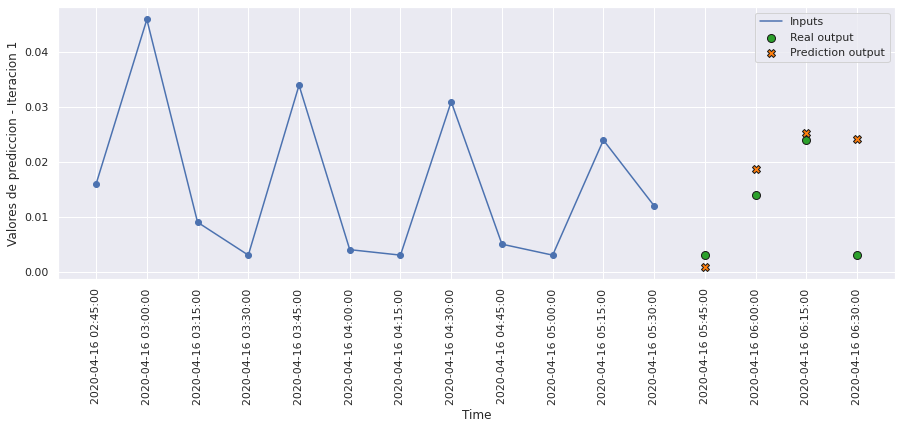

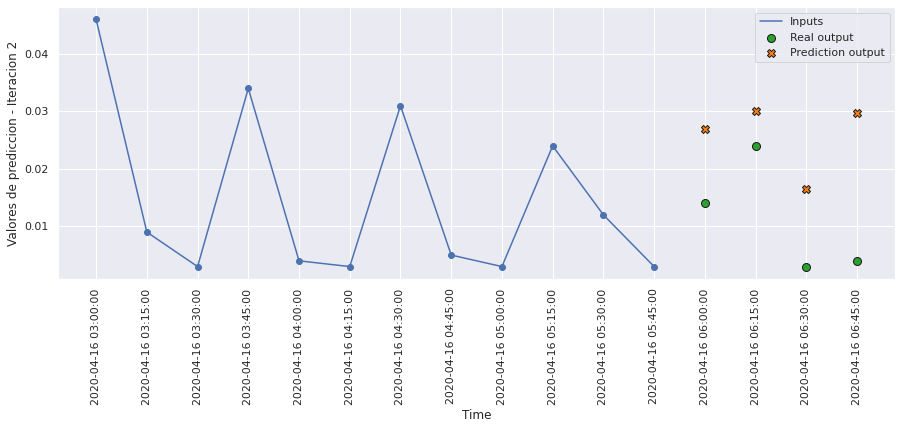

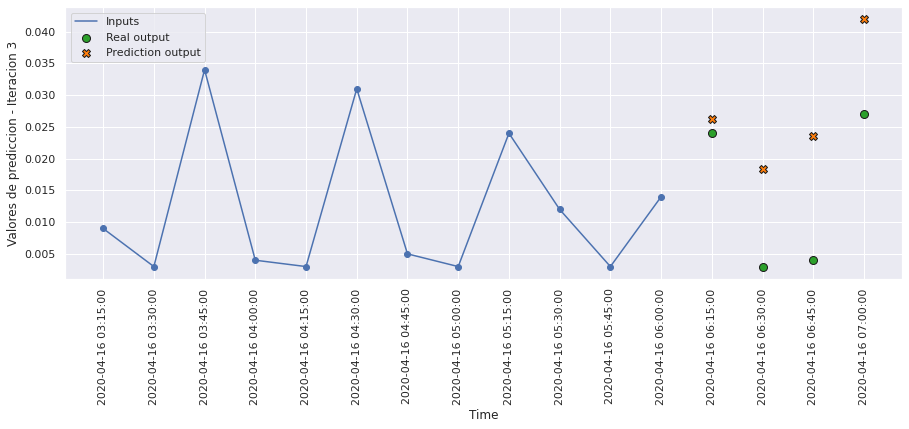

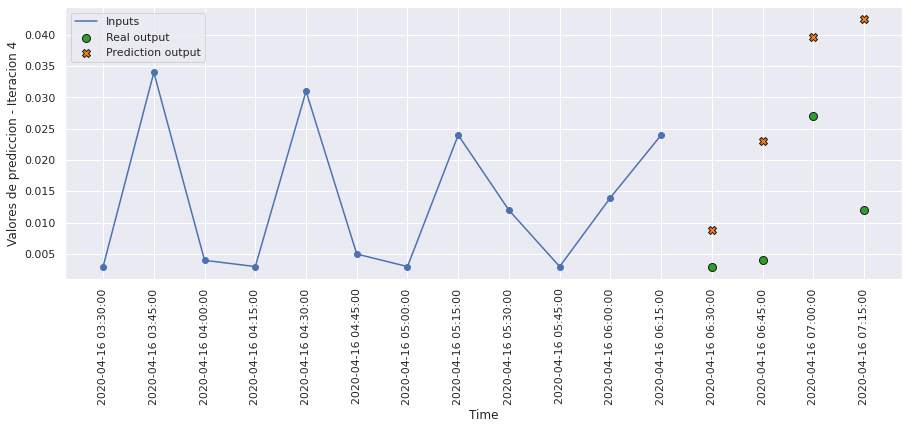

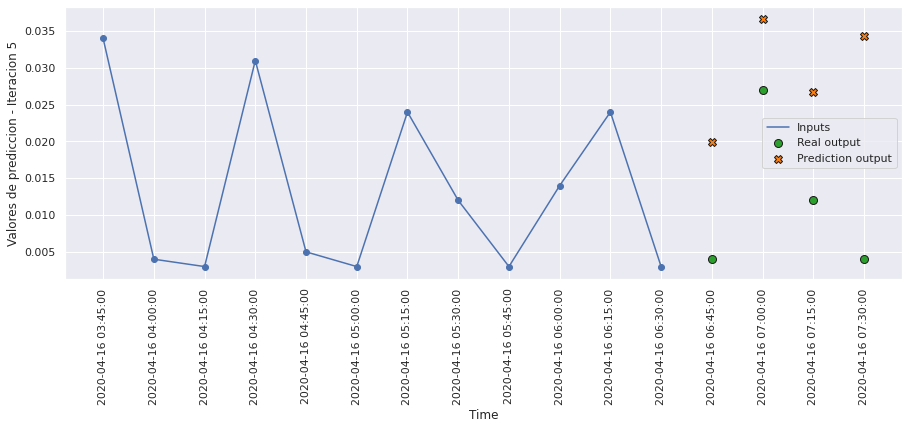

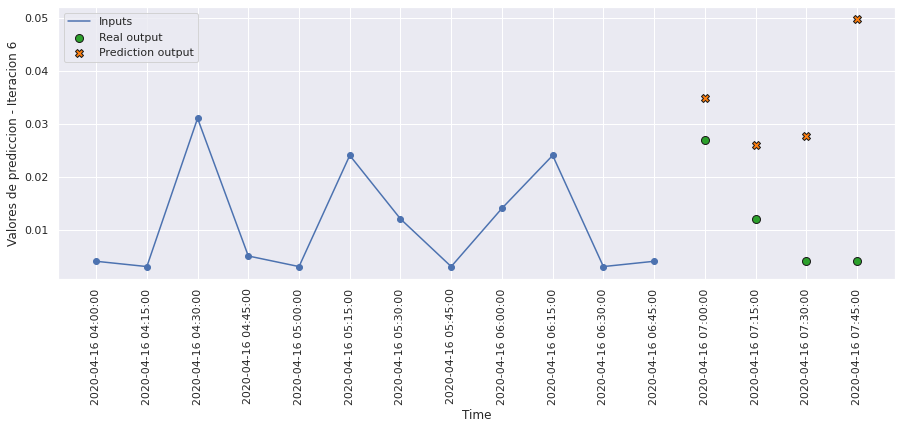

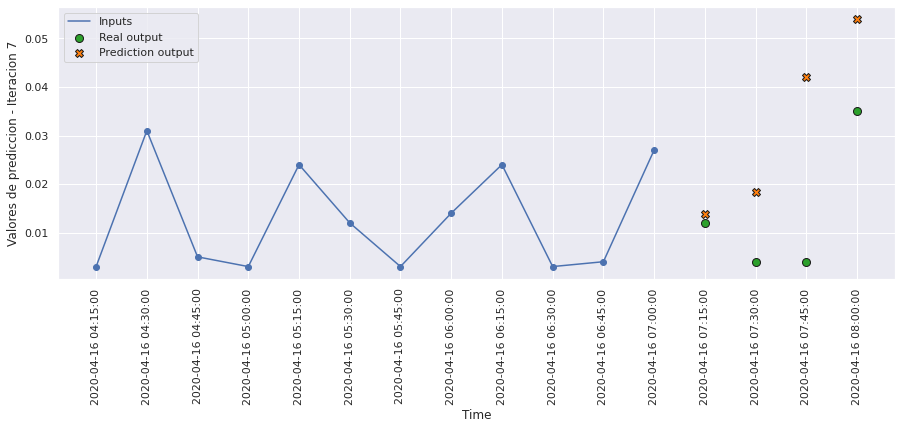

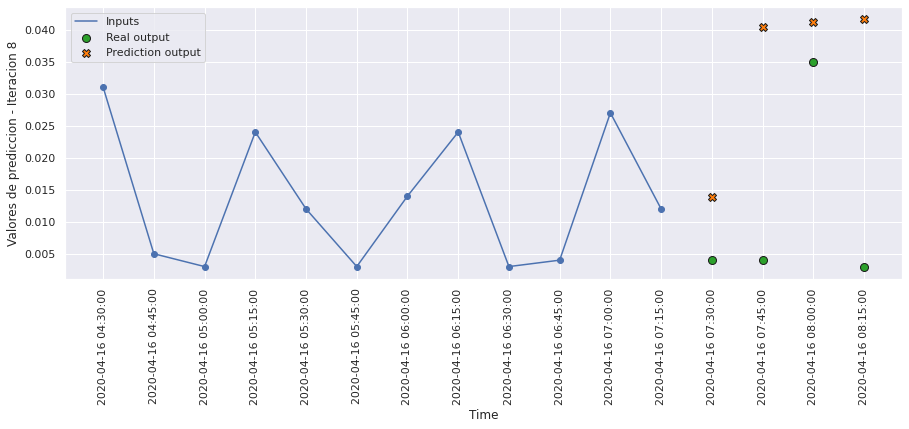

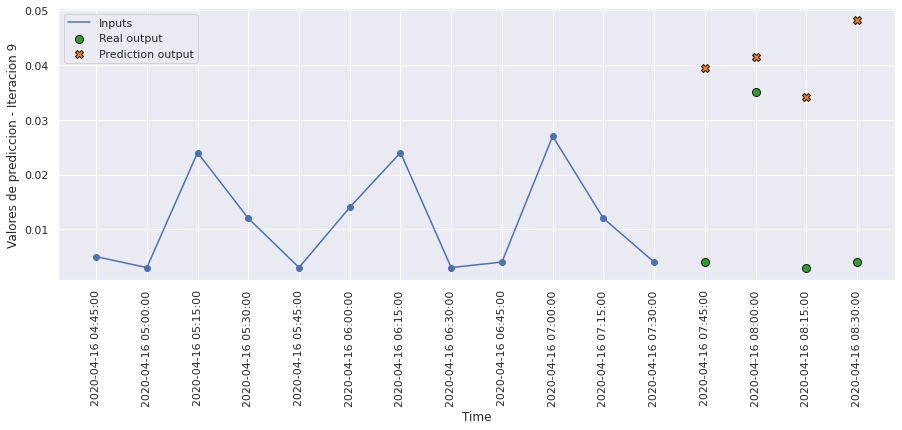

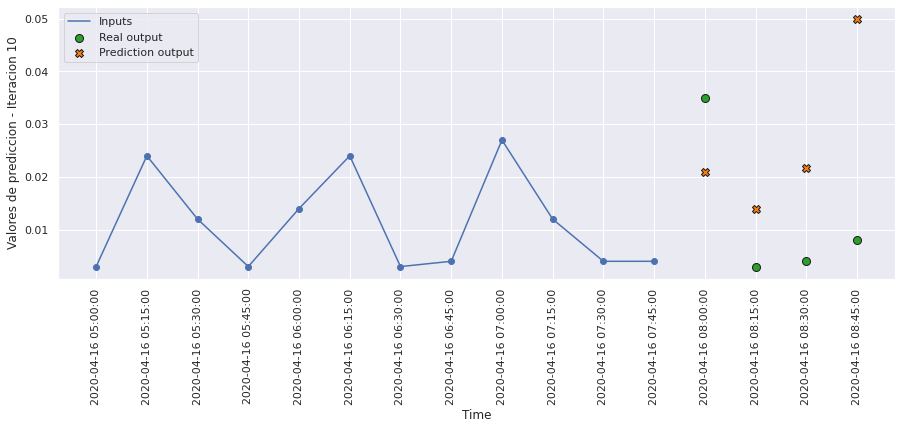

In [199]:
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict13, 10, 0)

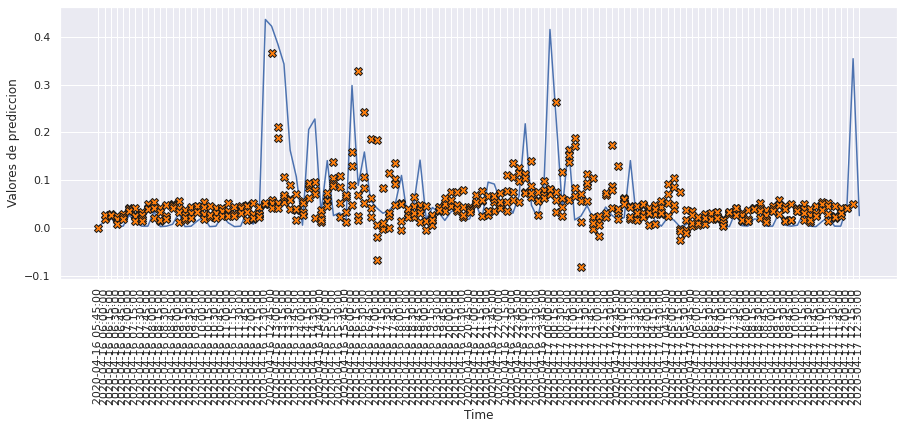

In [200]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict13, 120)

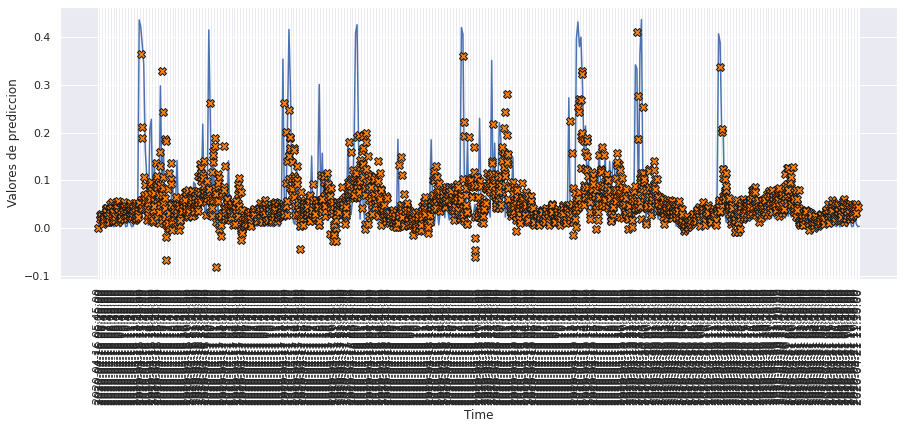

In [201]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict13, 500)

# Comparación de modelos

In [202]:
idx = ['LSTM 1 Layer', 'LSTM 2 Layer', 'LSTM 3 Layer', 'Bidirectional LSTM', 
         'Conv 1D', 'Conv 1D con LSTM', 'ConvLSTM1D', 'ConvLSTM2D', 'LSTM Encode Decode', 
         'GRU 1 Layer', 'GRU 2 Layer', 'LSTM unrestricted 1 layer', 'LSTM unrestricted 2 layer']

col = ['TR_MAE', 'TR_MSE', 'TR_SMAPE', 'TR_RMSE',
       'V_MAE', 'V_MSE', 'V_SMAPE', 'V_RMSE',
       'TS_MAE', 'TS_MSE', 'TS_SMAPE', 'TS_RMSE']

datos = [[score_train1[1], score_train1[2], score_train1[3], math.sqrt(score_train1[2]),
            score_val1[1],   score_val1[2],   score_val1[3],   math.sqrt(score_val1[2]),
           score_test1[1],  score_test1[2],  score_test1[3],  math.sqrt(score_test1[2])],
         [score_train2[1], score_train2[2], score_train2[3], math.sqrt(score_train2[2]),
            score_val2[1],   score_val2[2],   score_val2[3],   math.sqrt(score_val2[2]),
           score_test2[1],  score_test2[2],  score_test2[3],  math.sqrt(score_test2[2])],
         [score_train3[1], score_train3[2], score_train3[3], math.sqrt(score_train3[2]),
            score_val3[1],   score_val3[2],   score_val3[3],   math.sqrt(score_val3[2]),
           score_test3[1],  score_test3[2],  score_test3[3],  math.sqrt(score_test3[2])],
         [score_train4[1], score_train4[2], score_train4[3], math.sqrt(score_train4[2]),
            score_val4[1],   score_val4[2],   score_val4[3],   math.sqrt(score_val4[2]),
           score_test4[1],  score_test4[2],  score_test4[3],  math.sqrt(score_test4[2])],
         [score_train5[1], score_train5[2], score_train5[3], math.sqrt(score_train5[2]),
            score_val5[1],   score_val5[2],   score_val5[3],   math.sqrt(score_val5[2]),
           score_test5[1],  score_test5[2],  score_test5[3],  math.sqrt(score_test5[2])],
         [score_train6[1], score_train6[2], score_train6[3], math.sqrt(score_train6[2]),
            score_val6[1],   score_val6[2],   score_val6[3],   math.sqrt(score_val6[2]),
           score_test6[1],  score_test6[2],  score_test6[3],  math.sqrt(score_test6[2])],
         [score_train7[1], score_train7[2], score_train7[3], math.sqrt(score_train7[2]),
            score_val7[1],   score_val7[2],   score_val7[3],   math.sqrt(score_val7[2]),
           score_test7[1],  score_test7[2],  score_test7[3],  math.sqrt(score_test7[2])],
         [score_train8[1], score_train8[2], score_train8[3], math.sqrt(score_train8[2]),
            score_val8[1],   score_val8[2],   score_val8[3],   math.sqrt(score_val8[2]),
           score_test8[1],  score_test8[2],  score_test8[3],  math.sqrt(score_test8[2])],
         [score_train9[1], score_train9[2], score_train9[3], math.sqrt(score_train9[2]),
            score_val9[1],   score_val9[2],   score_val9[3],   math.sqrt(score_val9[2]),
           score_test9[1],  score_test9[2],  score_test9[3],  math.sqrt(score_test9[2])],
         [score_train10[1], score_train10[2], score_train10[3], math.sqrt(score_train10[2]),
            score_val10[1],   score_val10[2],   score_val10[3],   math.sqrt(score_val10[2]),
           score_test10[1],  score_test10[2],  score_test10[3],  math.sqrt(score_test10[2])],
         [score_train11[1], score_train11[2], score_train11[3], math.sqrt(score_train11[2]),
            score_val11[1],   score_val11[2],   score_val11[3],   math.sqrt(score_val11[2]),
           score_test11[1],  score_test11[2],  score_test11[3],  math.sqrt(score_test11[2])],
         [score_train12[1], score_train12[2], score_train12[3], math.sqrt(score_train12[2]),
            score_val12[1],   score_val12[2],   score_val12[3],   math.sqrt(score_val12[2]),
           score_test12[1],  score_test12[2],  score_test12[3],  math.sqrt(score_test12[2])],
         [score_train13[1], score_train13[2], score_train13[3], math.sqrt(score_train13[2]),
            score_val13[1],   score_val13[2],   score_val13[3],   math.sqrt(score_val13[2]),
           score_test13[1],  score_test13[2],  score_test13[3],  math.sqrt(score_test13[2])]]

comparativa = pd.DataFrame(datos, columns = col, index = idx)
comparativa.style.set_caption("Tabla de comparación de todos los modelos - Método de ventana sólo valor 12 - 4")

,TR_MAE,TR_MSE,TR_SMAPE,TR_RMSE,V_MAE,V_MSE,V_SMAPE,V_RMSE,TS_MAE,TS_MSE,TS_SMAPE,TS_RMSE
LSTM 1 Layer,0.042712,0.004984,0.777289,0.070598,0.045937,0.006235,0.813459,0.078963,0.050052,0.006604,0.832758,0.081266
LSTM 2 Layer,0.026366,0.001953,0.696648,0.044189,0.047017,0.007809,0.843733,0.088370,0.050807,0.008168,0.860081,0.090379
LSTM 3 Layer,0.024339,0.001593,0.643558,0.039914,0.046391,0.007559,0.799654,0.086945,0.050856,0.008125,0.829802,0.090138
Bidirectional LSTM,0.041587,0.004981,0.767284,0.070579,0.042403,0.006008,0.772889,0.077514,0.046661,0.006357,0.795871,0.079734
Conv 1D,0.046715,0.005998,0.818791,0.077447,0.040288,0.006055,0.733244,0.077816,0.044540,0.006168,0.763747,0.078539
Conv 1D con LSTM,0.043336,0.005742,0.768011,0.075776,0.036568,0.005879,0.671132,0.076676,0.041890,0.006207,0.710687,0.078782
ConvLSTM1D,0.044867,0.005819,0.798691,0.076279,0.042067,0.005817,0.781959,0.076272,0.045807,0.005980,0.803610,0.077330
ConvLSTM2D,0.043305,0.005785,0.779046,0.076061,0.038873,0.005860,0.729254,0.076554,0.042697,0.005990,0.754501,0.077396
LSTM Encode Decode,0.030887,0.002782,0.689927,0.052747,0.045182,0.007080,0.801130,0.084145,0.049414,0.007564,0.821169,0.086972
GRU 1 Layer,0.036775,0.003672,0.760527,0.060597,0.046959,0.007177,0.831508,0.084714,0.050762,0.007493,0.846767,0.086559


<AxesSubplot:title={'center':'Comparativa del error en los modelos para la hora del método de ventana de varios pasos con sólo el valor'}>

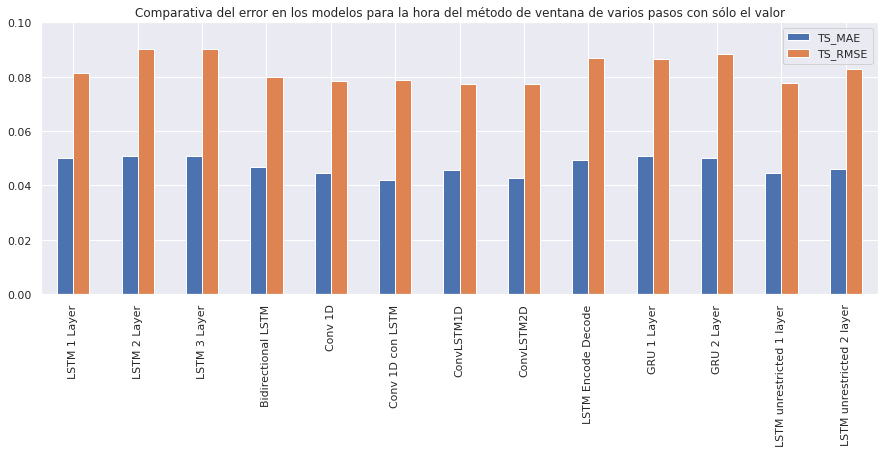

In [203]:
comparativa.loc[:, ['TS_MAE', 'TS_RMSE']].plot(kind='bar', ylim=(0, 0.1), title = 'Comparativa del error en los modelos para la hora del método de ventana de varios pasos con sólo el valor')

<AxesSubplot:title={'center':'Comparativa del error porcentual absoluto medio simétrico para la hora del método de ventana de varios pasos con sólo el valor'}>

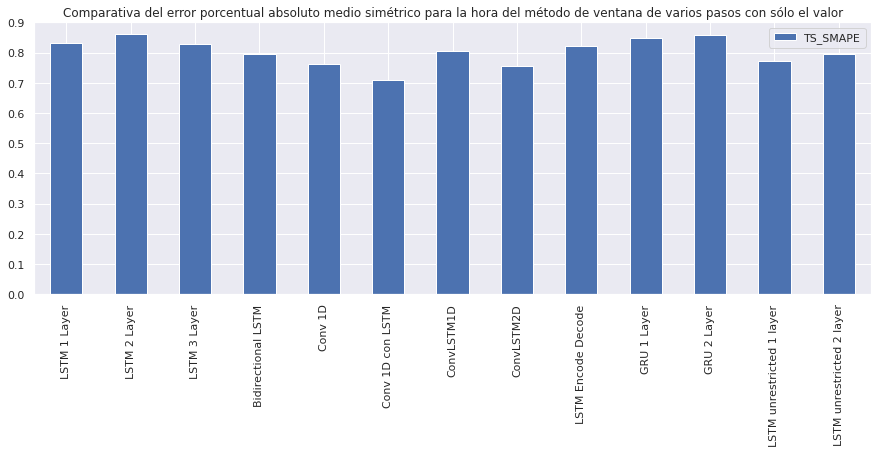

In [204]:
comparativa.loc[:, 'TS_SMAPE'].plot(kind='bar', legend=(['SMAPE']), ylim=(0, 0.9), 
                    title = 'Comparativa del error porcentual absoluto medio simétrico para la hora del método de ventana de varios pasos con sólo el valor')

# Elección de modelo - 9

In [207]:
model11.save('../../models/only_value/hourModel/1/')

INFO:tensorflow:Assets written to: ../../models/only_value/hourModel/1/assets


INFO:tensorflow:Assets written to: ../../models/only_value/hourModel/1/assets
